In [5]:
from Utils import *
from ml_utils import *

In [1]:
import numpy as np, pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
from statsmodels.stats.diagnostic import acorr_ljungbox

/Users/will/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  """


In [4]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller
import seaborn as sns; sns.set(style="whitegrid")

## if you want to test run the code yourself you may start from here

In [2]:
import yfinance as yf

In [7]:
target_list=['^HSI','2800.HK','7500.HK','3067.HK','3033.HK','3032.HK','7226.HK','7200.HK','^HSCE','2828.HK']

In [8]:
df=yf.download(target_list,period='10y',auto_adjust=True,threads=True)

[*********************100%***********************]  10 of 10 completed


In [9]:
df_original=df.copy()

## Correlation and Preliminary Data Screening

In [68]:
df_original.to_csv('10 year Data.csv')

In [10]:
df=df_original.copy()

In [11]:
corr_df=df['Close'].corr()

<AxesSubplot:>

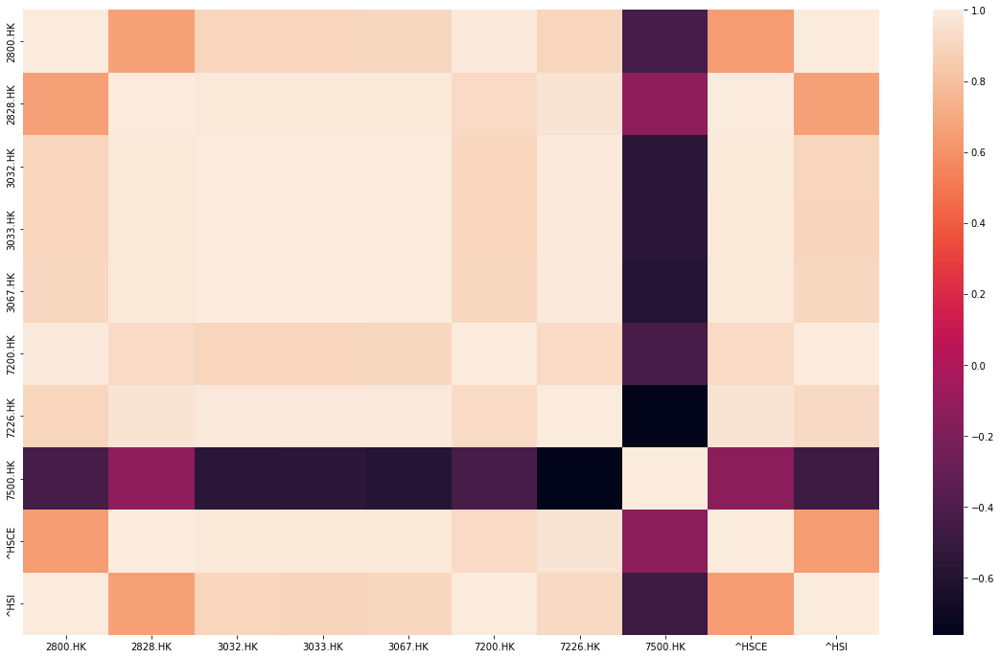

In [12]:
plt.figure(figsize=(20,12))
sns.heatmap(corr_df)

In [13]:
df=df['Close']

In [14]:
log_ret=df.apply(lambda x:np.log(x/x.shift(1)))

In [15]:
log_ret.corr()

,2800.HK,2828.HK,3032.HK,3033.HK,3067.HK,7200.HK,7226.HK,7500.HK,^HSCE,^HSI
2800.HK,1.000000,0.917855,0.840877,0.837194,0.841762,0.979342,0.860199,-0.983094,0.903432,0.952716
2828.HK,0.917855,1.000000,0.901141,0.900205,0.900488,0.944787,0.890675,-0.952326,0.968494,0.912219
3032.HK,0.840877,0.901141,1.000000,0.986409,0.983481,0.854272,0.930679,-0.859529,0.908545,0.858851
3033.HK,0.837194,0.900205,0.986409,1.000000,0.985570,0.849941,0.930188,-0.854935,0.906837,0.856117
3067.HK,0.841762,0.900488,0.983481,0.985570,1.000000,0.849998,0.926192,-0.854685,0.906888,0.856796
7200.HK,0.979342,0.944787,0.854272,0.849941,0.849998,1.000000,0.857555,-0.995674,0.913082,0.949213
7226.HK,0.860199,0.890675,0.930679,0.930188,0.926192,0.857555,1.000000,-0.859500,0.896167,0.869566
7500.HK,-0.983094,-0.952326,-0.859529,-0.854935,-0.854685,-0.995674,-0.859500,1.000000,-0.906771,-0.935382
^HSCE,0.903432,0.968494,0.908545,0.906837,0.906888,0.913082,0.896167,-0.906771,1.000000,0.943872
^HSI,0.952716,0.912219,0.858851,0.856117,0.856796,0.949213,0.869566,-0.935382,0.943872,1.000000


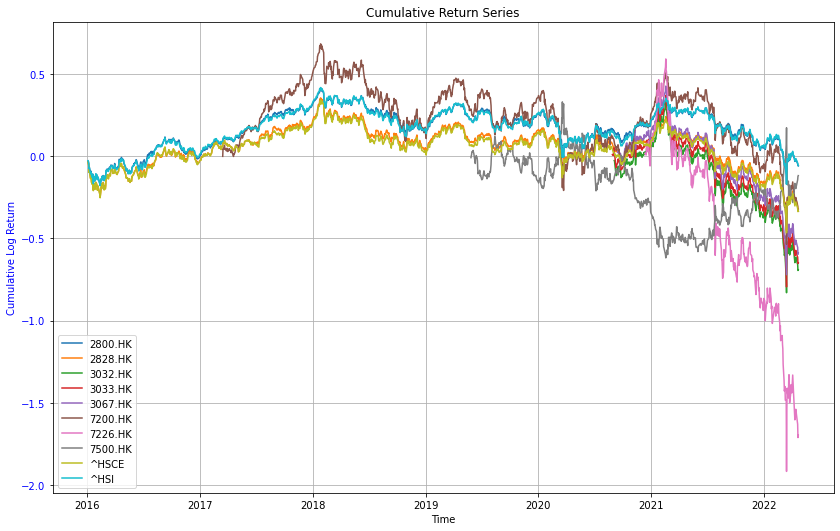

In [503]:
plot_line(log_ret.cumsum(),title='Cumulative Return Series',xlabel='Time',ylabel='Cumulative Log Return',figsize=(20*0.7,20*0.618*0.7))

In [498]:
pd.DataFrame.from_dict(name_dic,orient='index').sort_index().rename(columns={0:'Name'})

,Name
2800.HK,Tracker Fund of Hong Kong
2828.HK,Hang Seng China Enterprises Index ETF
3032.HK,Hang Seng TECH Index ETF
3033.HK,CSOP Hang Seng TECH Index ETF
3067.HK,iShares Hang Seng TECH ETF
7200.HK,CSOP Hang Seng Index Daily (2x) Leveraged Product
7226.HK,CSOP Hang Seng TECH Index Daily (2x) Leveraged...
7500.HK,CSOP Hang Seng Index Daily (-2x) Inverse Product
^HSCE,HANG SENG CHINA ENTERPRISES IND
^HSI,HANG SENG INDEX


In [488]:
name_dic

{'3032.HK': 'Hang Seng TECH Index ETF',
 '7500.HK': 'CSOP Hang Seng Index Daily (-2x) Inverse Product',
 '3033.HK': 'CSOP Hang Seng TECH Index ETF',
 '3067.HK': 'iShares Hang Seng TECH ETF',
 '^HSI': 'HANG SENG INDEX',
 '2800.HK': 'Tracker Fund of Hong Kong',
 '2828.HK': 'Hang Seng China Enterprises Index ETF',
 '7200.HK': 'CSOP Hang Seng Index Daily (2x) Leveraged Product',
 '7226.HK': 'CSOP Hang Seng TECH Index Daily (2x) Leveraged Product',
 '^HSCE': 'HANG SENG CHINA ENTERPRISES IND'}

In [16]:
log_ret=log_ret.loc[log_ret.index.year>2015]

In [507]:
log_ret.corr().sort_values('2800.HK',ascending=False).sort_index()

,2800.HK,2828.HK,3032.HK,3033.HK,3067.HK,7200.HK,7226.HK,7500.HK,^HSCE,^HSI
2800.HK,1.000000,0.937402,0.840877,0.837194,0.841762,0.979342,0.860199,-0.983094,0.913154,0.946926
2828.HK,0.937402,1.000000,0.901141,0.900205,0.900488,0.944787,0.890675,-0.952326,0.957481,0.918117
3032.HK,0.840877,0.901141,1.000000,0.986409,0.983481,0.854272,0.930679,-0.859529,0.908545,0.858851
3033.HK,0.837194,0.900205,0.986409,1.000000,0.985570,0.849941,0.930188,-0.854935,0.906837,0.856117
3067.HK,0.841762,0.900488,0.983481,0.985570,1.000000,0.849998,0.926192,-0.854685,0.906888,0.856796
7200.HK,0.979342,0.944787,0.854272,0.849941,0.849998,1.000000,0.857555,-0.995674,0.913082,0.949213
7226.HK,0.860199,0.890675,0.930679,0.930188,0.926192,0.857555,1.000000,-0.859500,0.896167,0.869566
7500.HK,-0.983094,-0.952326,-0.859529,-0.854935,-0.854685,-0.995674,-0.859500,1.000000,-0.906771,-0.935382
^HSCE,0.913154,0.957481,0.908545,0.906837,0.906888,0.913082,0.896167,-0.906771,1.000000,0.959798
^HSI,0.946926,0.918117,0.858851,0.856117,0.856796,0.949213,0.869566,-0.935382,0.959798,1.000000


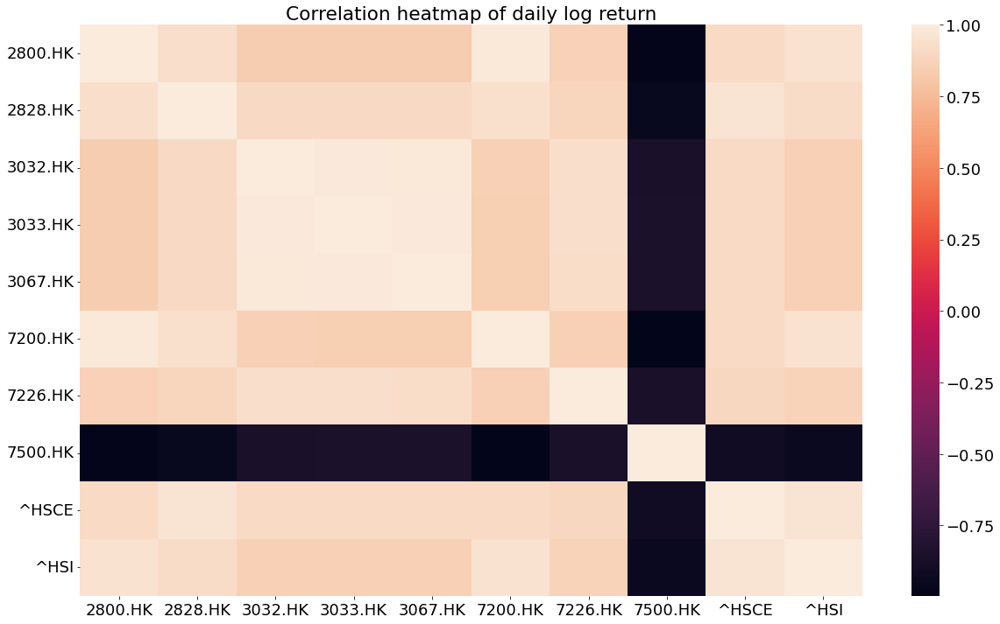

In [514]:
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(20,12))
plt.title('Correlation heatmap of daily log return')

sns.heatmap(log_ret.corr().sort_values('2800.HK',ascending=False).sort_index())
plt.show()

In [18]:
result_dic={}

In [19]:
target_list=['^HSI','2800.HK','7500.HK','3067.HK','3033.HK','3032.HK','7226.HK','7200.HK','^HSCE','2828.HK']

In [20]:
corr_df

,2800.HK,2828.HK,3032.HK,3033.HK,3067.HK,7200.HK,7226.HK,7500.HK,^HSCE,^HSI
2800.HK,1.000000,0.658141,0.900778,0.898687,0.905745,0.991919,0.898005,-0.435276,0.643698,0.996731
2828.HK,0.658141,1.000000,0.983222,0.982842,0.983376,0.921236,0.961617,-0.135004,0.997955,0.658668
3032.HK,0.900778,0.983222,1.000000,0.999867,0.999820,0.901608,0.988691,-0.562482,0.982991,0.897638
3033.HK,0.898687,0.982842,0.999867,1.000000,0.999831,0.898508,0.988959,-0.551622,0.982567,0.894546
3067.HK,0.905745,0.983376,0.999820,0.999831,1.000000,0.908670,0.988552,-0.589364,0.983287,0.904846
7200.HK,0.991919,0.921236,0.901608,0.898508,0.908670,1.000000,0.917670,-0.427496,0.920576,0.994174
7226.HK,0.898005,0.961617,0.988691,0.988959,0.988552,0.917670,1.000000,-0.761433,0.963171,0.911432
7500.HK,-0.435276,-0.135004,-0.562482,-0.551622,-0.589364,-0.427496,-0.761433,1.000000,-0.145635,-0.473301
^HSCE,0.643698,0.997955,0.982991,0.982567,0.983287,0.920576,0.963171,-0.145635,1.000000,0.647543
^HSI,0.996731,0.658668,0.897638,0.894546,0.904846,0.994174,0.911432,-0.473301,0.647543,1.000000


In [515]:
name1,name2=('3033.HK', '3067.HK')
target_series1=log_ret[name1]
target_series2=log_ret[name2]
temp=log_ret[[name1,name2]]
diff=target_series1-target_series2

In [521]:
sns.set_style('whitegrid')

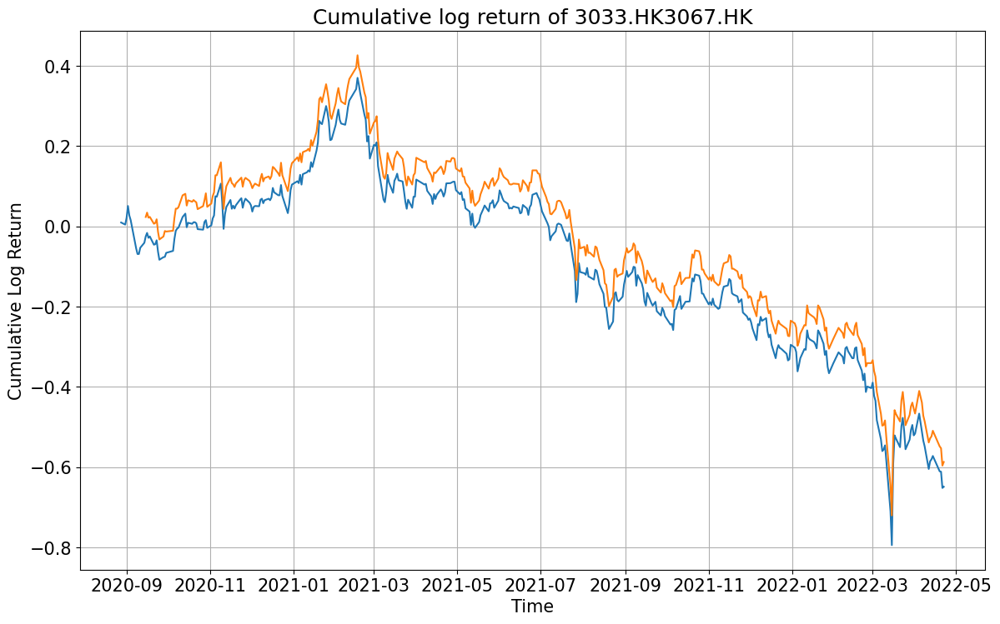

In [533]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(20*0.7,12*0.7))

# plt.title('Cumulative Log Return Series of 3033.HK and 3067.HK')
plt.plot(temp.cumsum())
plt.title('Cumulative log return of '+name1+name2)
plt.xlabel('Time')
plt.ylabel('Cumulative Log Return')
plt.grid()


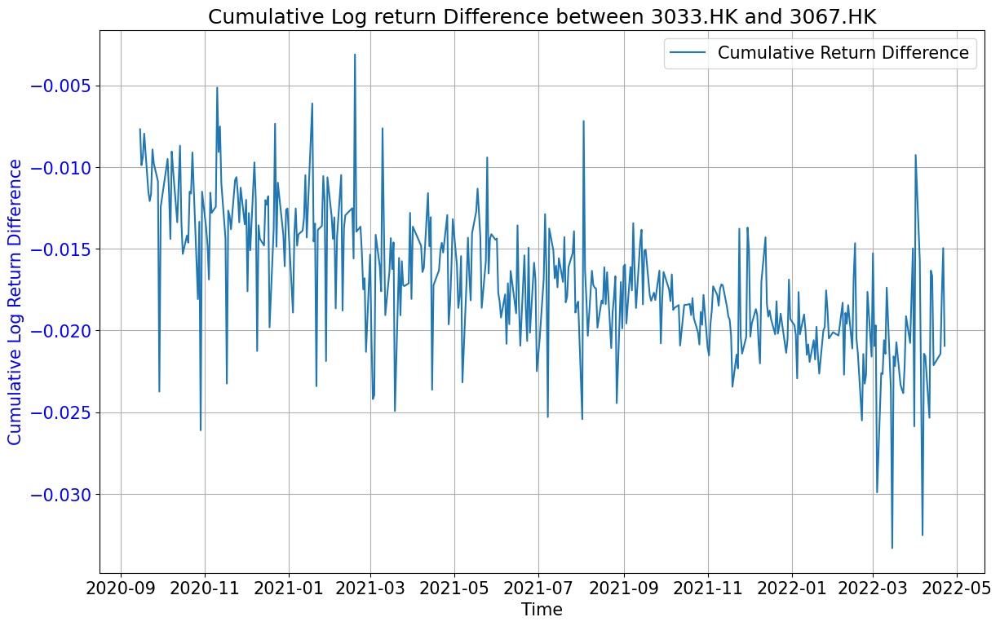

In [535]:
cum_diff=(temp.iloc[:,0]-temp.iloc[:,1]).cumsum().fillna(method='ffill')
plt.rcParams.update({'font.size': 15})
# plt.figure(figsize=(20*0.7,20*0.618*0.7))
plot_line(cum_diff.rename('Cumulative Return Difference'),title='Cumulative Log return Difference between '+name1+' and '+name2,xlabel='Time',ylabel='Cumulative Log Return Difference',figsize=(20*0.7,20*0.618*0.7),fontsize=15)

In [659]:
temp

,3033.HK,3067.HK
Date,,
2016-01-04,NaN,NaN
2016-01-05,NaN,NaN
2016-01-06,NaN,NaN
2016-01-07,NaN,NaN
2016-01-08,NaN,NaN
...,...,...
2022-04-14,0.008495,0.013963
2022-04-19,-0.038319,-0.039021
2022-04-20,-0.000977,-0.004624


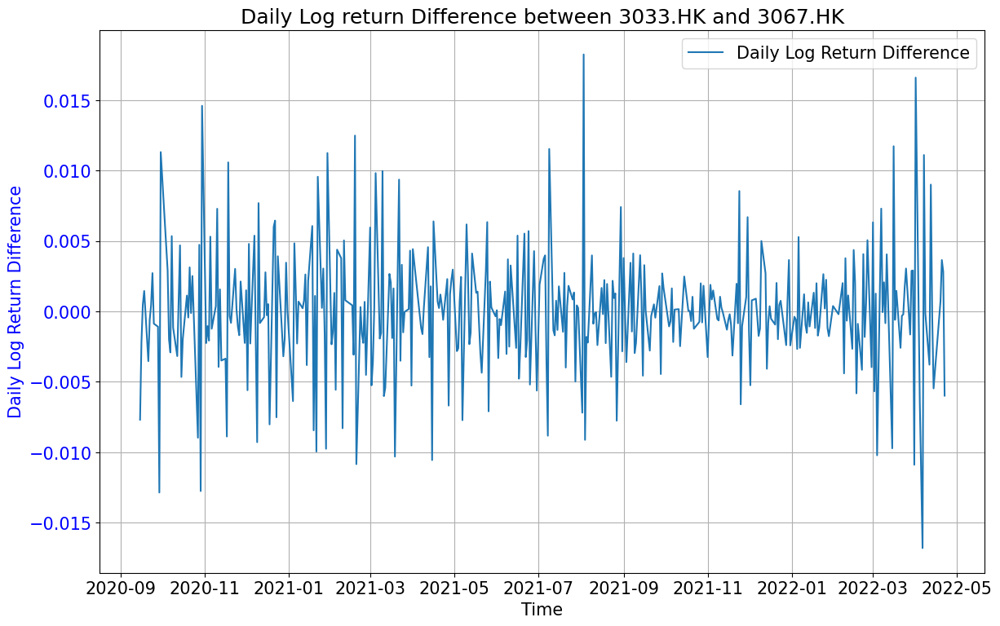

In [660]:
log_ret_1=(temp.iloc[:,0]-temp.iloc[:,1])
plt.rcParams.update({'font.size': 15})
# plt.figure(figsize=(20*0.7,20*0.618*0.7))
plot_line(log_ret_1.rename('Daily Log Return Difference'),title='Daily Log return Difference between '+name1+' and '+name2,xlabel='Time',ylabel='Daily Log Return Difference',figsize=(20*0.7,20*0.618*0.7),fontsize=15)

In [24]:
transcost=3/10000

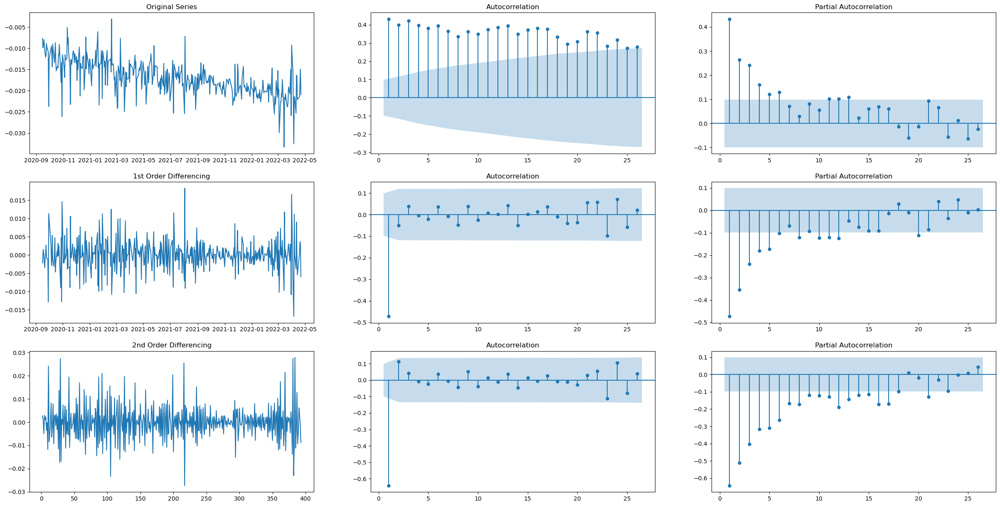

In [539]:
import numpy as np, pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

plt.rcParams.update({'figure.figsize':(15,9)})
plt.rcParams.update({'font.size':10})


# Import data
df = cum_diff.dropna()

# Original Series
fig, axes = plt.subplots(3, 3,figsize=(30,15))
axes[0, 0].plot(df); axes[0, 0].set_title('Original Series')
plot_acf(df.dropna().values, ax=axes[0, 1],zero=False)
plot_pacf(df.dropna().values, ax=axes[0, 2],zero=False)



# 1st Differencing
axes[1, 0].plot(df.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(df.diff().dropna().values, ax=axes[1, 1],zero=False)
plot_pacf(df.diff().dropna(), ax=axes[1, 2],zero=False)

# 2nd Differencing
axes[2, 0].plot(df.diff().diff().values); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df.diff().diff().dropna().values, ax=axes[2, 1],zero=False)
plot_pacf(df.diff().diff().dropna(), ax=axes[2, 2],zero=False)

plt.show()

In [283]:
from statsmodels.tsa.stattools import adfuller
print('adfuller value:')
print(adfuller(cum_diff.dropna())[0])
print('adfuller pvalue:')
print(adfuller(cum_diff.dropna())[1])

adfuller value:
-14.159654059166614
adfuller pvalue:
2.091808312473662e-26


In [27]:
#1st order diff adfuller
from statsmodels.tsa.stattools import adfuller
print('adfuller value:')
print(adfuller(cum_diff.diff().dropna())[0])
print('adfuller pvalue:')
print(adfuller(cum_diff.diff().dropna())[1])

adfuller value:
-24.805356230261147
adfuller pvalue:
0.0


In [43]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
df = diff.dropna()
model = pm.auto_arima(df.dropna(), start_p=0, start_q=0,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=0,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      information_criterion='aic',
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=False)

print(model.summary())


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-8326.516, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-8324.814, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-8332.617, Time=0.23 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-8331.014, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-8324.759, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-8324.671, Time=0.19 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-8331.060, Time=0.20 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-8328.253, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-8332.079, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-8331.086, Time=0.17 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-8329.048, Time=0.17 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-8326.879, Time=0.25 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-8330.867, Time=0.32 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-8328.882, Time=0.36 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=-8316.516, Time=0.31

In [29]:
corr_df

,2800.HK,2828.HK,3032.HK,3033.HK,3067.HK,7200.HK,7226.HK,7500.HK,^HSCE,^HSI
2800.HK,1.000000,0.658141,0.900778,0.898687,0.905745,0.991919,0.898005,-0.435276,0.643698,0.996731
2828.HK,0.658141,1.000000,0.983222,0.982842,0.983376,0.921236,0.961617,-0.135004,0.997955,0.658668
3032.HK,0.900778,0.983222,1.000000,0.999867,0.999820,0.901608,0.988691,-0.562482,0.982991,0.897638
3033.HK,0.898687,0.982842,0.999867,1.000000,0.999831,0.898508,0.988959,-0.551622,0.982567,0.894546
3067.HK,0.905745,0.983376,0.999820,0.999831,1.000000,0.908670,0.988552,-0.589364,0.983287,0.904846
7200.HK,0.991919,0.921236,0.901608,0.898508,0.908670,1.000000,0.917670,-0.427496,0.920576,0.994174
7226.HK,0.898005,0.961617,0.988691,0.988959,0.988552,0.917670,1.000000,-0.761433,0.963171,0.911432
7500.HK,-0.435276,-0.135004,-0.562482,-0.551622,-0.589364,-0.427496,-0.761433,1.000000,-0.145635,-0.473301
^HSCE,0.643698,0.997955,0.982991,0.982567,0.983287,0.920576,0.963171,-0.145635,1.000000,0.647543
^HSI,0.996731,0.658668,0.897638,0.894546,0.904846,0.994174,0.911432,-0.473301,0.647543,1.000000


In [411]:
corr_df['2800.HK'].loc['7226.HK']

0.8980050601457257

In [99]:
pairs_list

[('2800.HK', '3032.HK'),
 ('2800.HK', '3067.HK'),
 ('2828.HK', '3032.HK'),
 ('2828.HK', '3033.HK'),
 ('2828.HK', '3067.HK'),
 ('2828.HK', '7200.HK'),
 ('2828.HK', '7226.HK'),
 ('3032.HK', '7200.HK'),
 ('3032.HK', '7226.HK'),
 ('3032.HK', '^HSCE'),
 ('3033.HK', '7226.HK'),
 ('3033.HK', '^HSCE'),
 ('3067.HK', '7200.HK'),
 ('3067.HK', '7226.HK'),
 ('3067.HK', '^HSCE'),
 ('3067.HK', '^HSI'),
 ('7200.HK', '7226.HK'),
 ('7200.HK', '^HSCE'),
 ('7226.HK', '^HSCE'),
 ('7226.HK', '^HSI')]

In [98]:
data.apply(lambda x:list(x.dropna().index)[0])

2800.HK   2012-04-23
2828.HK   2012-04-23
3032.HK   2020-09-02
3033.HK   2020-08-27
3067.HK   2020-09-14
7200.HK   2017-03-14
7226.HK   2020-12-10
7500.HK   2019-05-27
^HSCE     2012-04-23
^HSI      2012-04-23
dtype: datetime64[ns]

In [415]:
pairs_list=[]
for key1 in list(corr_df.columns):
    for key2 in list(corr_df.index):
        if ((key1,key2) not in pairs_list) and ((key2,key1) not in pairs_list):
            if (abs(corr_df[key1].loc[key2])>0.98)&(abs(corr_df[key1].loc[key2])<1):
                pairs_list.append((key1,key2))


In [378]:
len(pairs_list)

33

In [385]:
# pairs_list=[('^HSI','2800.HK'),("^HSI",'2828.HK'),('2800.HK','7226.HK'),('2800.HK','3033.HK'),('2800.HK','3033.HK'),('3032.HK','7200.HK'),('^HSCE','7200.HK'),('7500.HK','3067.HK'),('3067.HK','7200.HK')]

In [379]:
param_dic={}
result_dic={}
model_dic={}

In [380]:
fail_dic={}

In [73]:
data=df_original['Close'].copy()

In [142]:
# data calculation part

In [633]:
pairs_list=[pairs]

('3033.HK', '3067.HK')


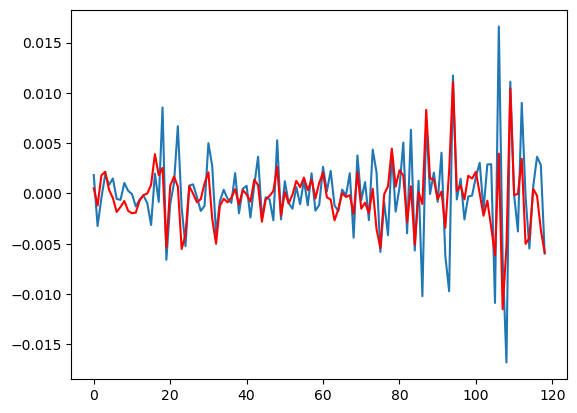

In [637]:
for pairs in pairs_list[:]:
    try:
        if pairs not in result_dic.keys() or True:
            name1,name2=pairs
            diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
            diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
            diff=diff.loc[diff.index.year>2017]
            df = diff.dropna()
            # print(model.summary())
            params=(1,0,1)
            series= diff.dropna().reset_index(drop=True)
            # split into train and test sets
            X = series.values
            size = int(len(X) * 0.7)
            if size<100:
                size = int(len(X) * 0.5)
            train, test = X[0:size], X[size:len(X)]
            history = [x for x in train]
            predictions = list()
            # walk-forward validation
            count=0
            for t in range(len(test)):
                count+=1
                print("{:2%}".format(count/len(test)))
                model_fit = ARIMA(history,order=params).fit(disp=0)
                yhat = model_fit.forecast()
                predictions.append(yhat[0])
                upperbound.append(yhat[2][0][1])
                lowerbound.append(yhat[2][0][1])
                obs = test[t]
                history.append(obs)
                clear_output(wait=False)
            # evaluate forecasts
            # rmse = sqrt(mean_squared_error(test, predictions))
            # print('Test RMSE: %.3f' % rmse)
            # plot forecasts against actual outcomes
            print(pairs)
            pyplot.plot(test)
            pyplot.plot(predictions, color='red')
            pyplot.show() 
            result=pd.DataFrame([predictions,test],index=['predictions','test'],columns=diff.loc[size:len(X)].index).T.dropna()
            bivariate_plot(result)
            regression(result,mute=True,summary=True)
            # param_dic.update({(name1,name2):params})
            # result_dic.update({(name1,name2):result})
    except Exception as e:
        fail_dic.update({pairs:str(e)})


In [677]:
model_fit.forecast()[2][0][1]

0.0005888337254976303

In [644]:
list(test)

[0.0018238717337713123,
 -0.0032430896283341445,
 -0.0004495922737465883,
 0.001886731330483029,
 0.0008486121437605767,
 0.0014854520606424927,
 -0.0005421191677809651,
 -0.0006439663358257346,
 0.0010425000061429143,
 0.0002618019939110948,
 -6.172171470068474e-05,
 -0.001299339703735079,
 -0.0006006506596673705,
 -0.00020085930145853593,
 -0.0009648713947939848,
 -0.0031373292813756583,
 0.001964623274256009,
 -0.0008398428006380649,
 0.00854736165536357,
 -0.006599637655554395,
 -0.0010460119318362465,
 0.0010198598797918294,
 0.006692538053779897,
 -0.0014277544412231316,
 -0.005243698080882479,
 0.0007842721304149453,
 0.0009020318719402155,
 -0.0003597732230444725,
 -0.001739729689757425,
 -0.001222765100214275,
 0.0049973084807909424,
 0.0027160534487244677,
 -0.004075697889634886,
 -0.0007760660668421123,
 0.0003680679335747554,
 -0.0005154676483430203,
 -0.0009374314904162656,
 0.002022029941922864,
 -0.0019754025453775047,
 0.0004617458811753631,
 0.0007551784734729239,
 -0.

In [646]:
diff

Date
2020-09-15   -0.007690
2020-09-16   -0.002198
2020-09-17    0.000481
2020-09-18    0.001450
2020-09-21   -0.003533
                ...   
2022-04-14   -0.005468
2022-04-19    0.000702
2022-04-20    0.003647
2022-04-21    0.002820
2022-04-22   -0.005985
Length: 394, dtype: float64

In [652]:
test=pd.Series(list(test),index=diff.iloc[size:len(X)].index).T

In [654]:
predictions=pd.Series(list(predictions),index=diff.iloc[size:len(X)].index).T

('3033.HK', '3067.HK')


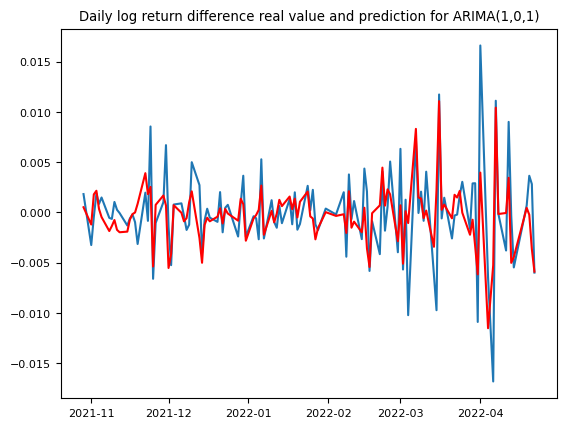

In [670]:
print(pairs)
plt.rcParams.update({'font.size': 8})
pyplot.title('Daily log return difference real value and prediction for ARIMA(1,0,1)')
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show() 

('3033.HK', '3067.HK')


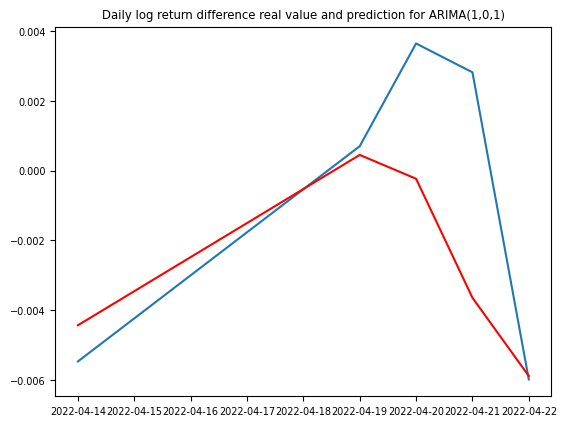

In [673]:
print(pairs)
plt.rcParams.update({'font.size': 7})
pyplot.title('Daily log return difference real value and prediction for ARIMA(1,0,1)')

pyplot.plot(test.iloc[-5:])
pyplot.plot(predictions.iloc[-5:], color='red')
pyplot.show() 

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
for pairs in pairs_list[:]:
    try:
        if pairs not in result_dic.keys():
            name1,name2=pairs
            diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
            diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
            diff=diff.loc[diff.index.year>2017]
            df = diff.dropna()
            model_1 = pm.auto_arima(df.dropna(), start_p=0, start_q=0,
                                test='adf',       # use adftest to find optimal 'd'
                                max_p=60, max_q=60, # maximum p and q
                                m=1,              # frequency of series
                                d=None,           # let model determine 'd'
                                seasonal=False,   # No Seasonality
                                trace=False,
                                information_criterion='aic',
                                error_action='ignore',  
                                suppress_warnings=True, 
                                stepwise=False)
            # print(model.summary())
            params=model_1.get_params()['order']
            series= diff.dropna().reset_index(drop=True)
            # split into train and test sets
            X = series.values
            size = int(len(X) * 0.7)
            if size<100:
                size = int(len(X) * 0.5)
            train, test = X[0:size], X[size:len(X)]
            history = [x for x in train]
            predictions = list()
            # walk-forward validation
            count=0
            for t in range(len(test)):
                count+=1
                print("{:2%}".format(count/len(test)))
                model_fit = ARIMA(history,order=params).fit(disp=0)
                yhat = model_fit.forecast()[0]
                predictions.append(yhat[0])
                obs = test[t]
                history.append(obs)
                clear_output(wait=False)
            # evaluate forecasts
            # rmse = sqrt(mean_squared_error(test, predictions))
            # print('Test RMSE: %.3f' % rmse)
            # plot forecasts against actual outcomes
            print(pairs)
            pyplot.plot(test)
            pyplot.plot(predictions, color='red')
            pyplot.show() 
            result=pd.DataFrame([predictions,test],index=['predictions','test']).T.dropna()
            bivariate_plot(result)
            regression(result,mute=True,summary=True)
            param_dic.update({(name1,name2):params})
            result_dic.update({(name1,name2):result})
    except Exception as e:
        fail_dic.update({pairs:str(e)})


In [1]:
target_string='programmer'

In [7]:
sum([10,2,30])

42

In [ ]:
#result esimation part

('2800.HK', '7200.HK')
(0, 0, 4)
Tracker Fund of Hong Kong
CSOP Hang Seng Index Daily (2x) Leveraged Product


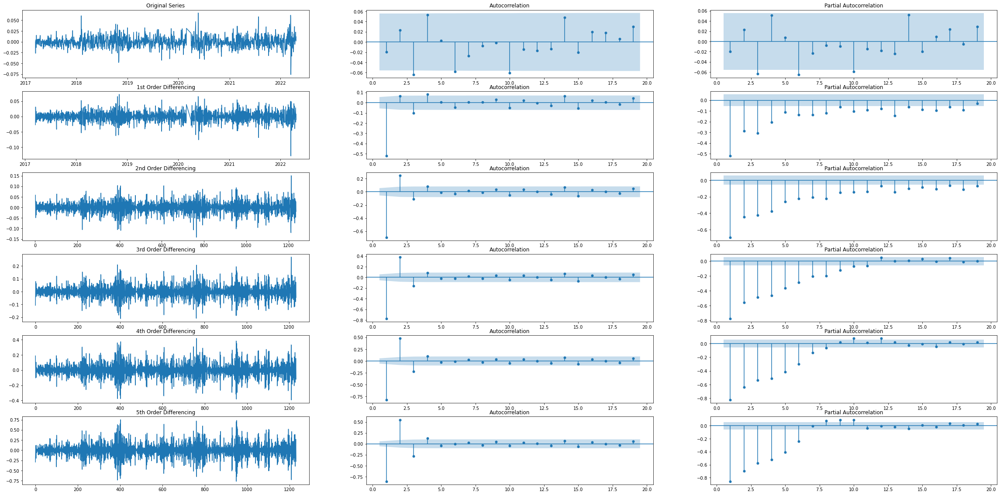

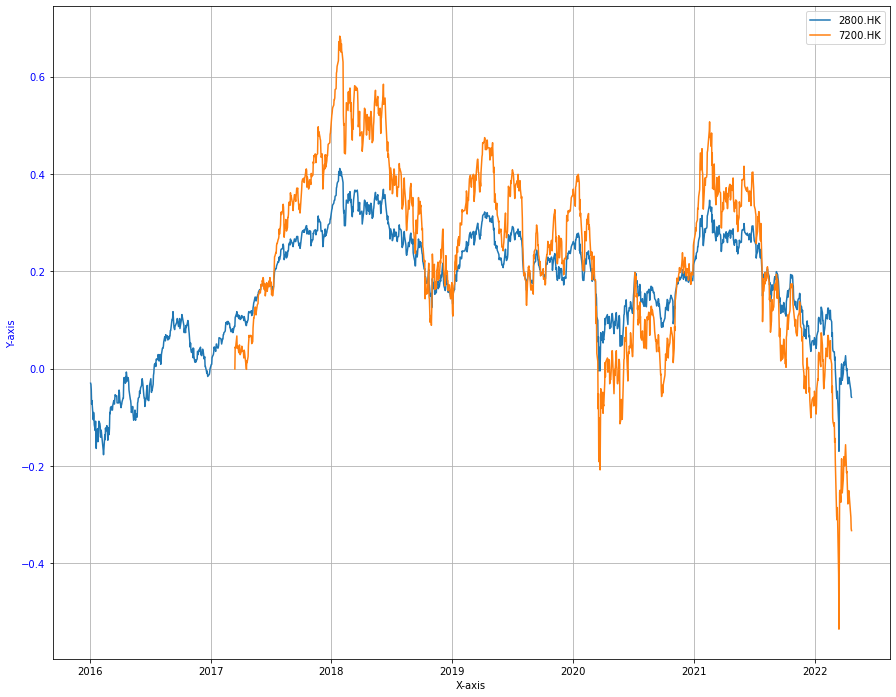

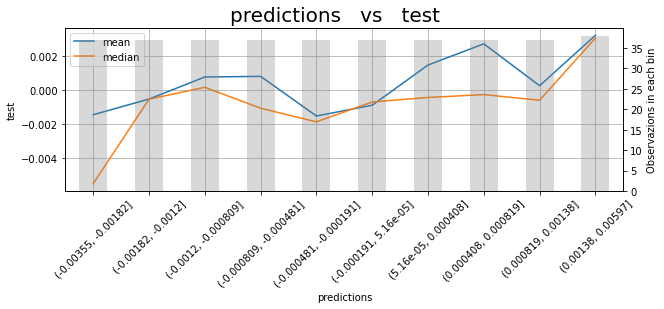

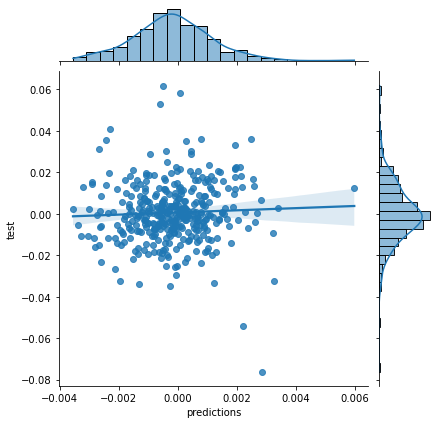

average position: 1.4793224106097758


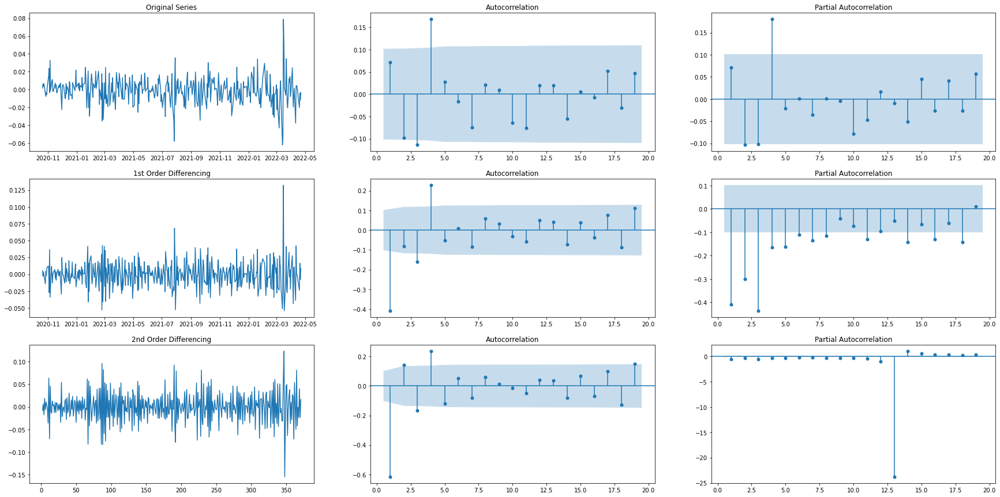

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,1.925488,5.485497,10.371154,21.036818,21.329377,21.428298,23.534126,23.707877,23.741373,25.325211,27.552329,27.695133,27.849823,29.021525,29.031167,29.049798,30.108864,30.470432,31.351839,33.962030
lb_pvalue,0.165253,0.064393,0.015661,0.000311,0.000702,0.001536,0.001375,0.002565,0.004729,0.004762,0.003789,0.006129,0.009496,0.010381,0.015937,0.023602,0.025571,0.033116,0.036923,0.026383


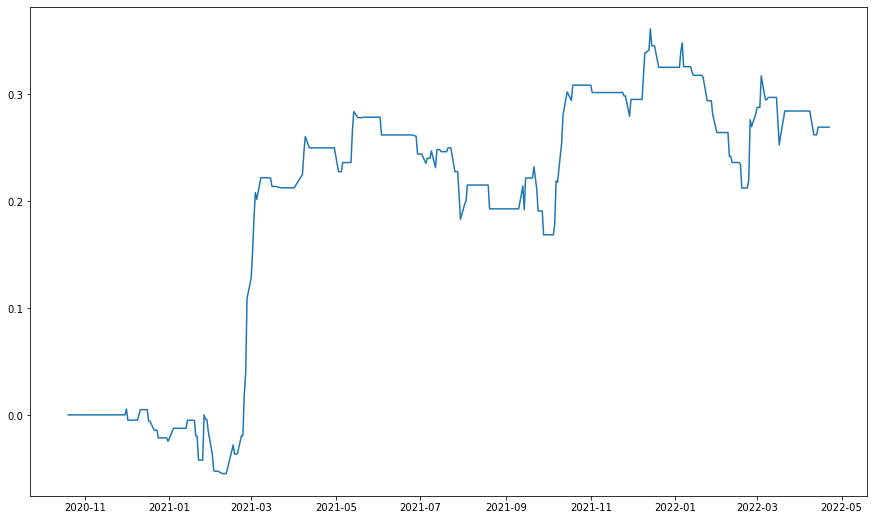

('2800.HK', '^HSI')
(2, 0, 0)
Tracker Fund of Hong Kong
HANG SENG INDEX


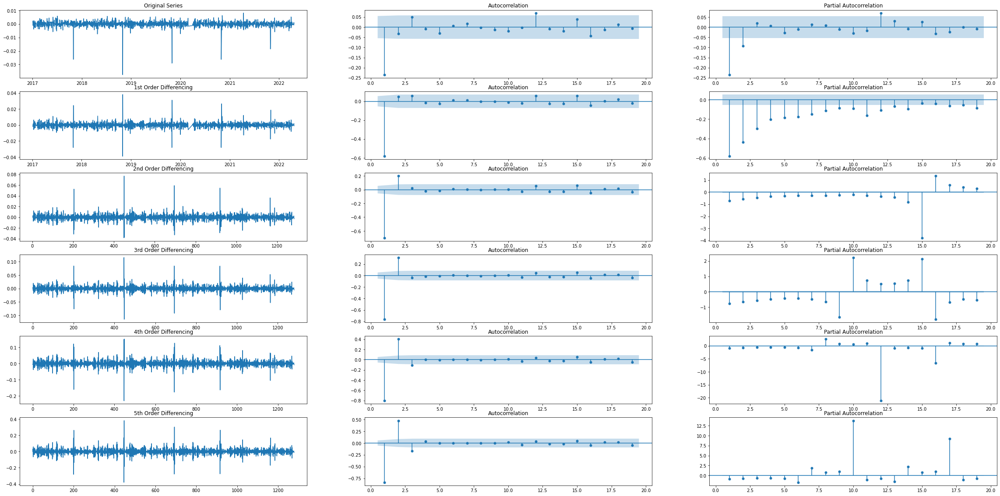

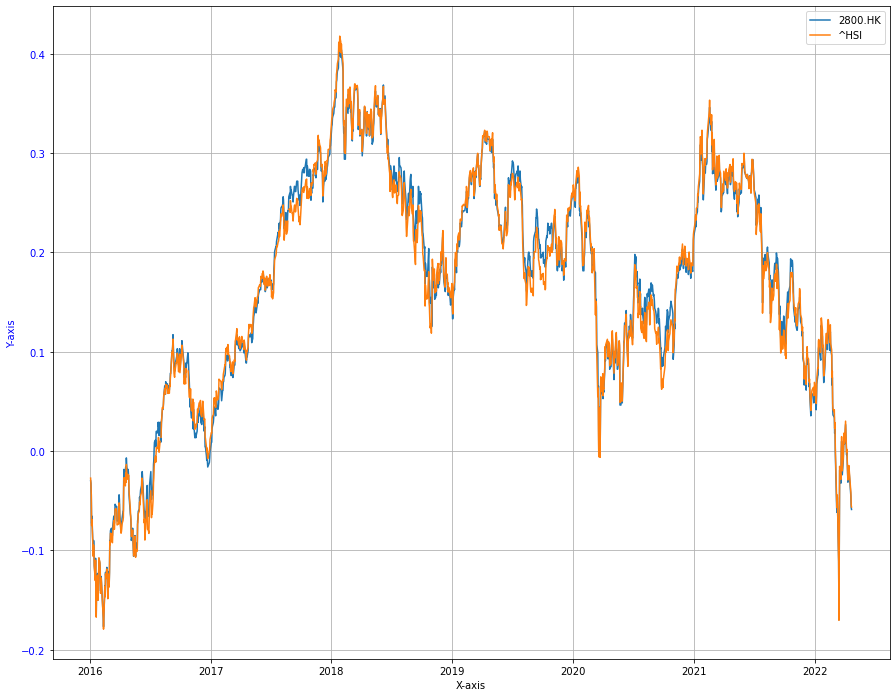

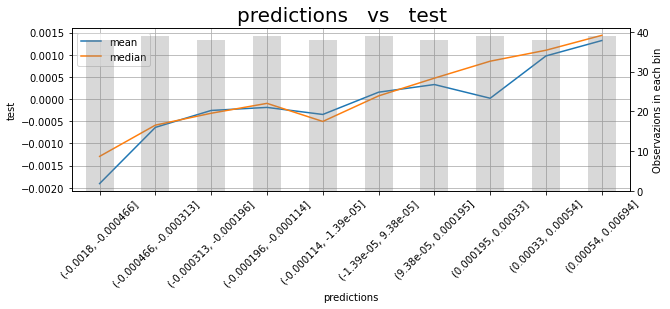

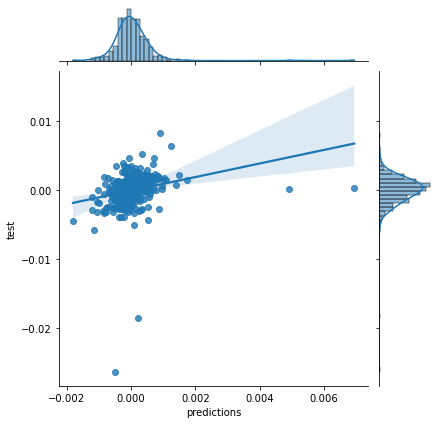

average position: 1.45220306502526


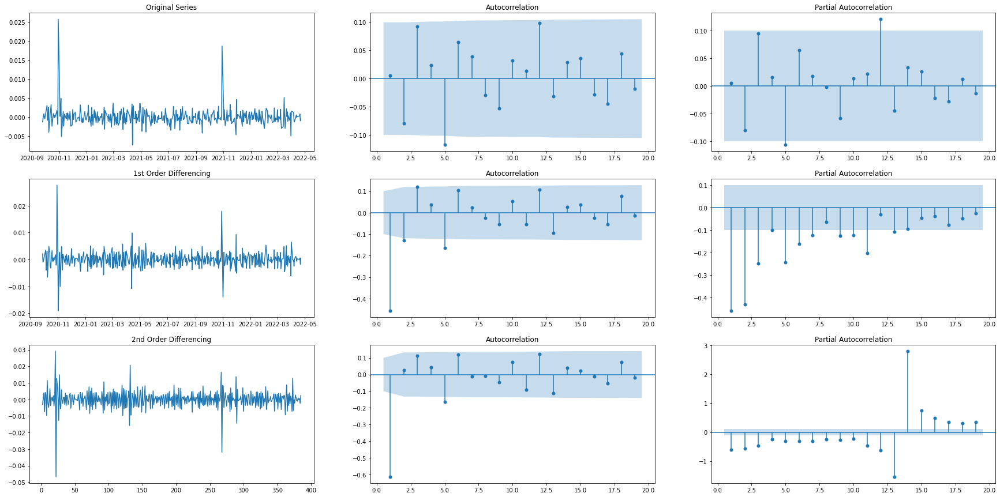

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,0.010979,2.457811,5.801190,6.020119,11.454202,13.116685,13.724425,14.065239,15.185035,15.599469,15.670697,19.591141,19.976139,20.317257,20.850328,21.177638,21.998801,22.794372,22.921529,24.149141
lb_pvalue,0.916550,0.292613,0.121694,0.197651,0.043082,0.041220,0.056306,0.080081,0.085977,0.111687,0.153803,0.075226,0.095807,0.120452,0.141680,0.171783,0.184765,0.198616,0.240816,0.235938


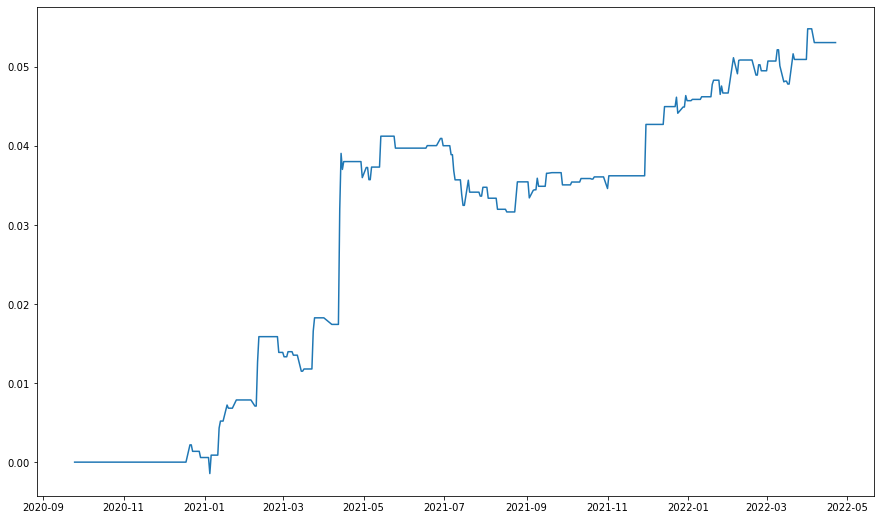

('2828.HK', '3032.HK')
(0, 0, 3)
Hang Seng China Enterprises Index ETF
Hang Seng TECH Index ETF


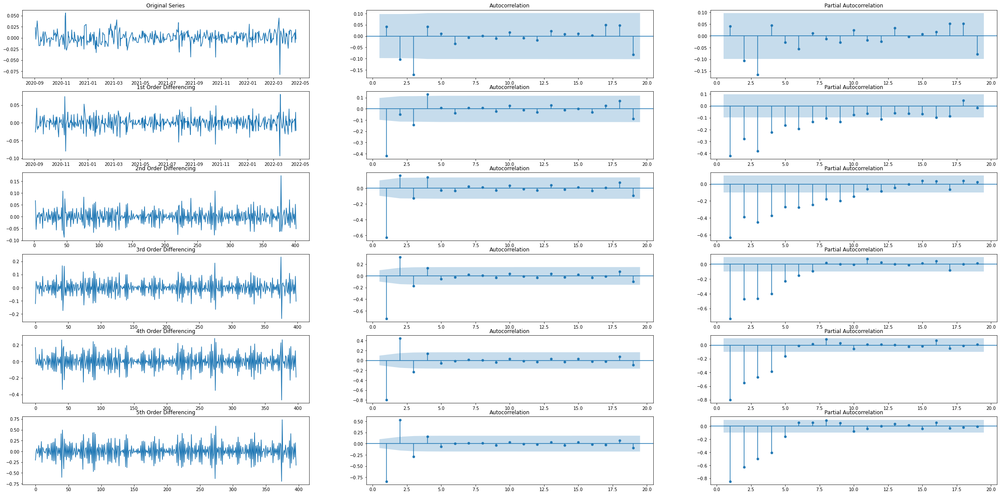

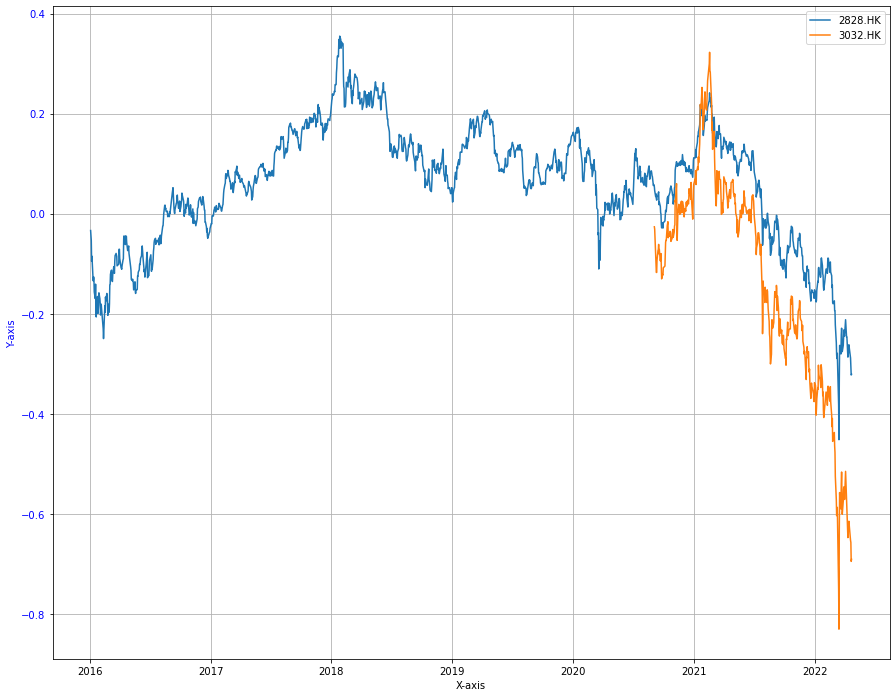

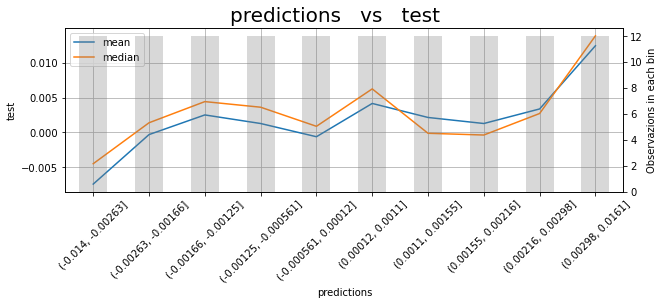

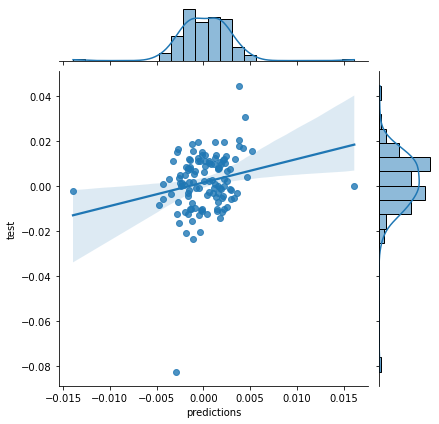

average position: 1.4183615770802487


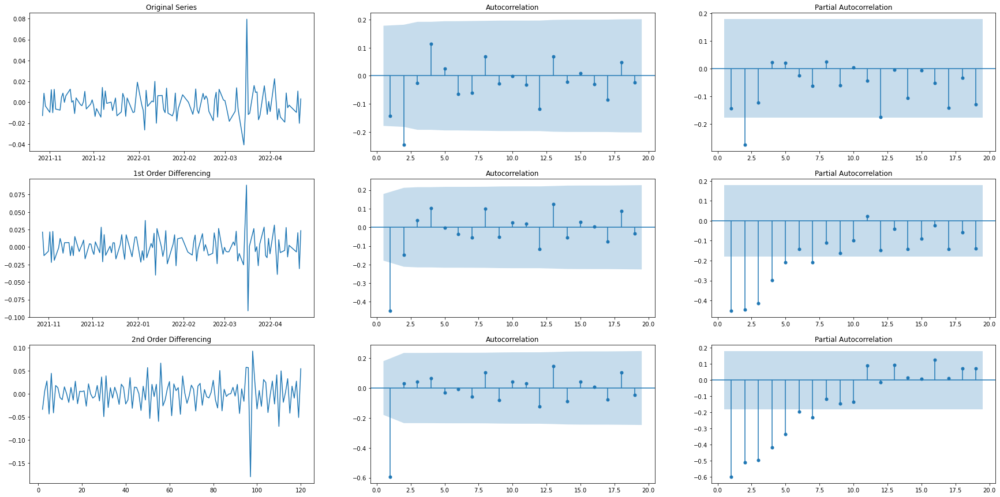

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,2.498785,10.054359,10.134376,11.764146,11.852100,12.397565,12.877994,13.490861,13.595238,13.595702,13.728329,15.650216,16.318036,16.387054,16.398356,16.525784,17.549855,17.872549,17.955523,18.049527
lb_pvalue,0.113934,0.006557,0.017458,0.019194,0.036872,0.053665,0.075137,0.096040,0.137469,0.192244,0.248392,0.207787,0.232382,0.290313,0.356082,0.416905,0.417756,0.464078,0.525411,0.584146


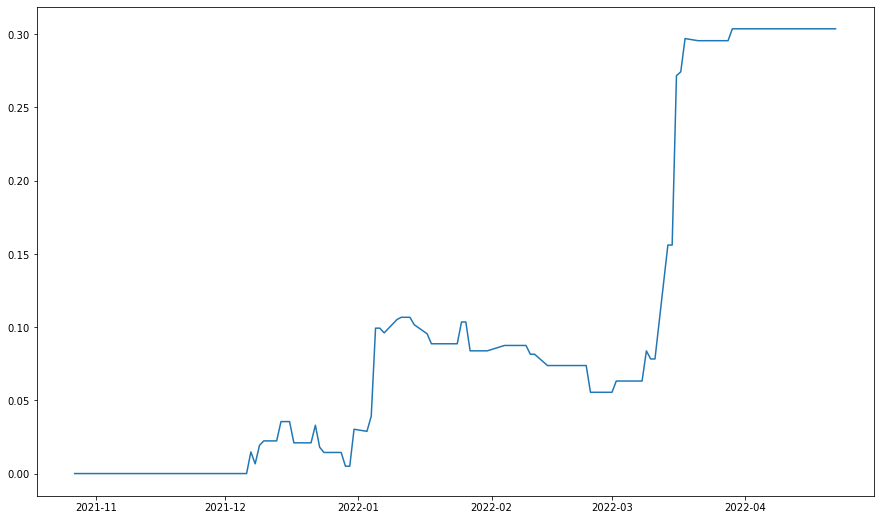

('2828.HK', '3033.HK')
(0, 0, 3)
Hang Seng China Enterprises Index ETF
CSOP Hang Seng TECH Index ETF


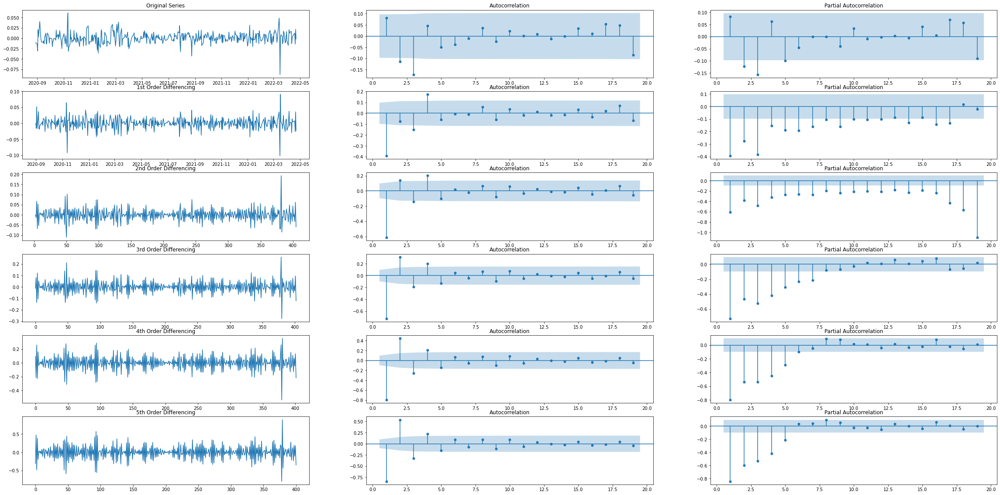

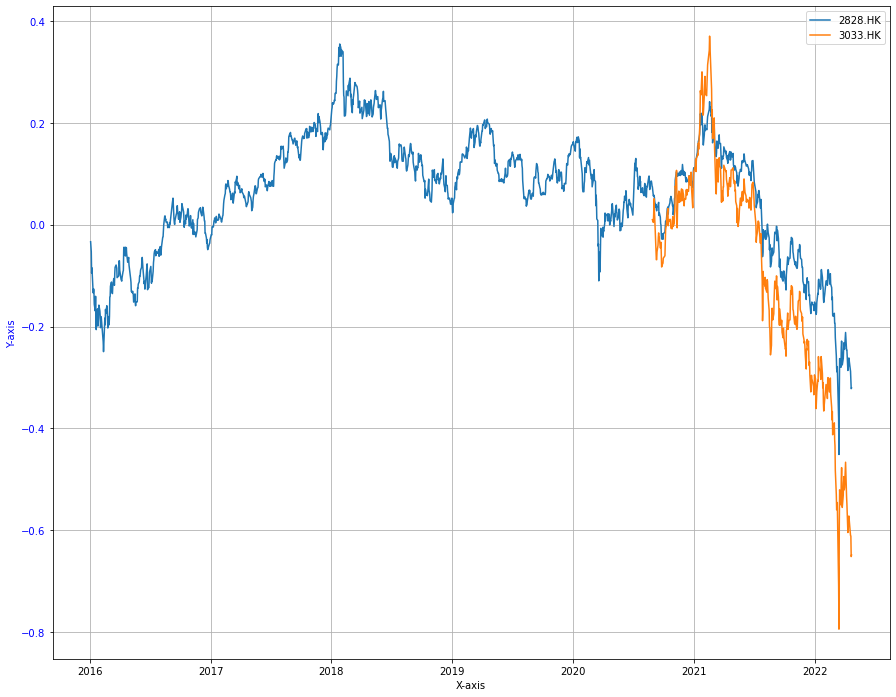

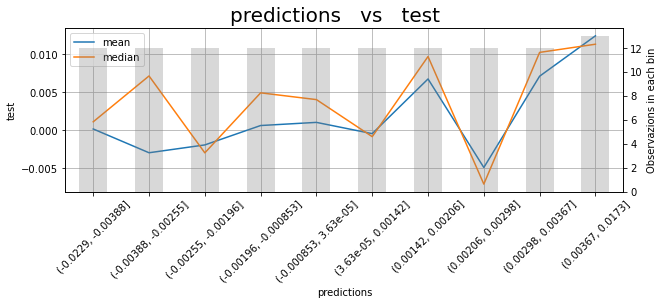

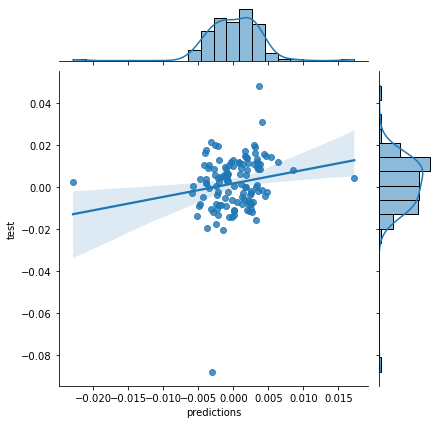

average position: 1.3934443334551534


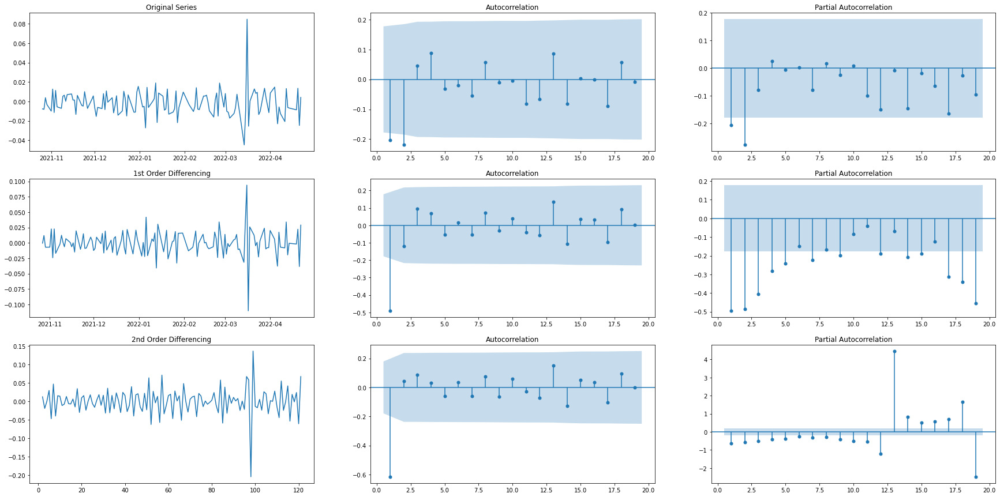

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,5.208244,11.265048,11.527356,12.526669,12.661954,12.715808,13.107903,13.541159,13.555259,13.557972,14.460323,15.068384,16.078772,17.016004,17.018342,17.018534,18.147089,18.622764,18.633447,19.804550
lb_pvalue,0.022480,0.003580,0.009191,0.013836,0.026761,0.047778,0.069523,0.094537,0.139048,0.194125,0.208560,0.237718,0.244902,0.255326,0.317769,0.384399,0.379619,0.415391,0.480567,0.470214


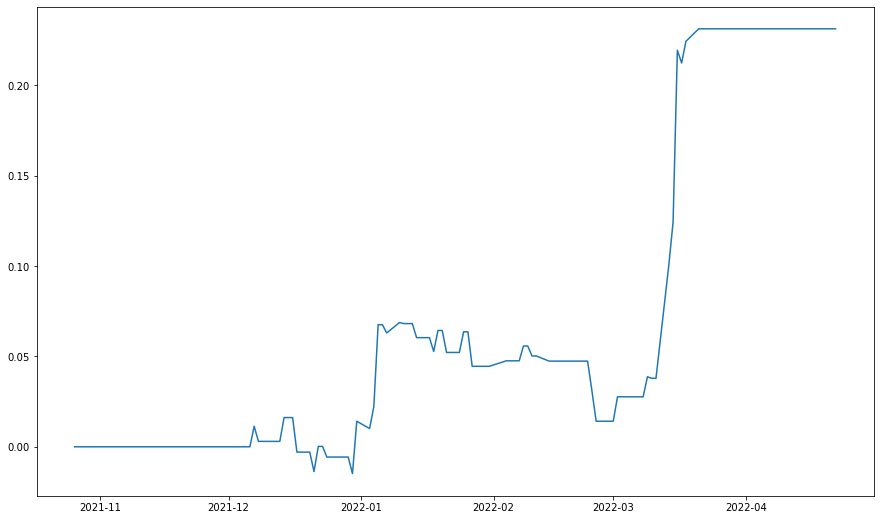

('2828.HK', '3067.HK')
(0, 0, 3)
Hang Seng China Enterprises Index ETF
iShares Hang Seng TECH ETF


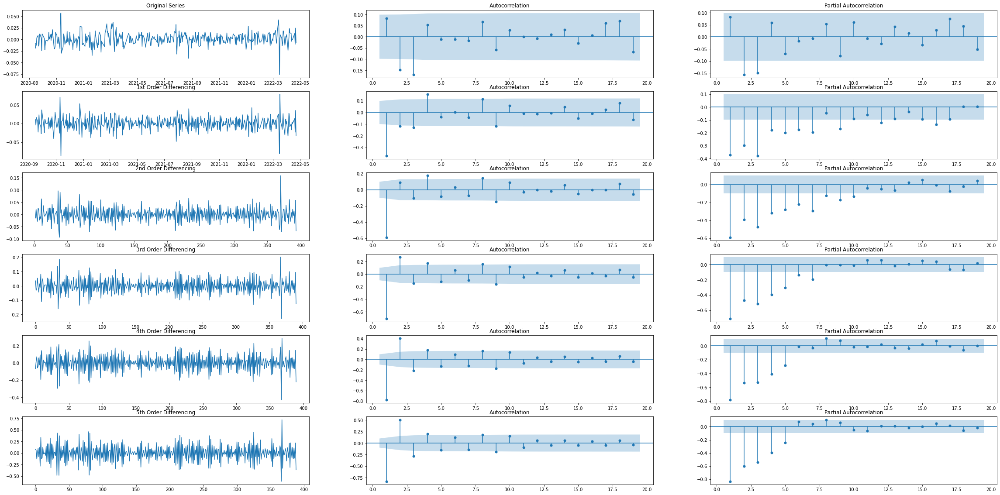

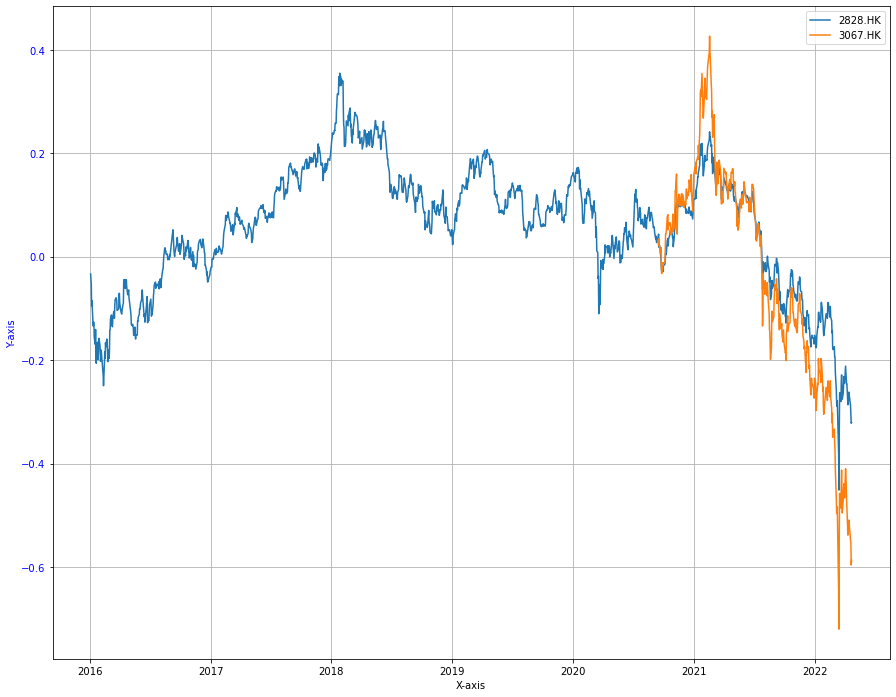

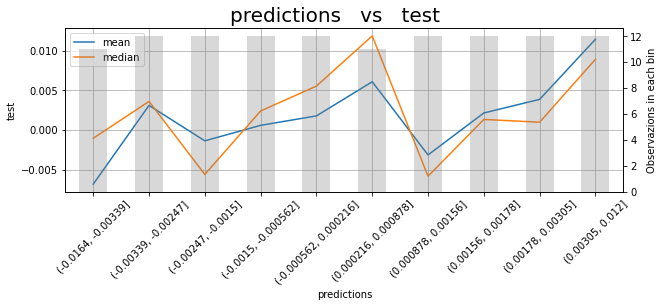

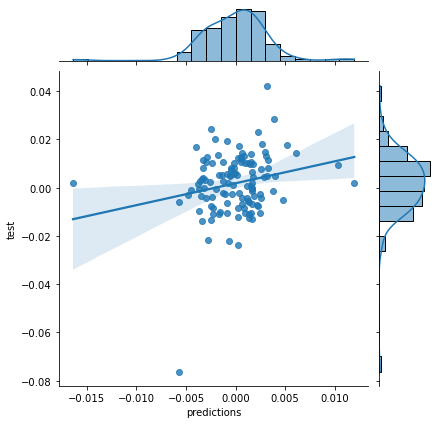

average position: 1.4930500656802497


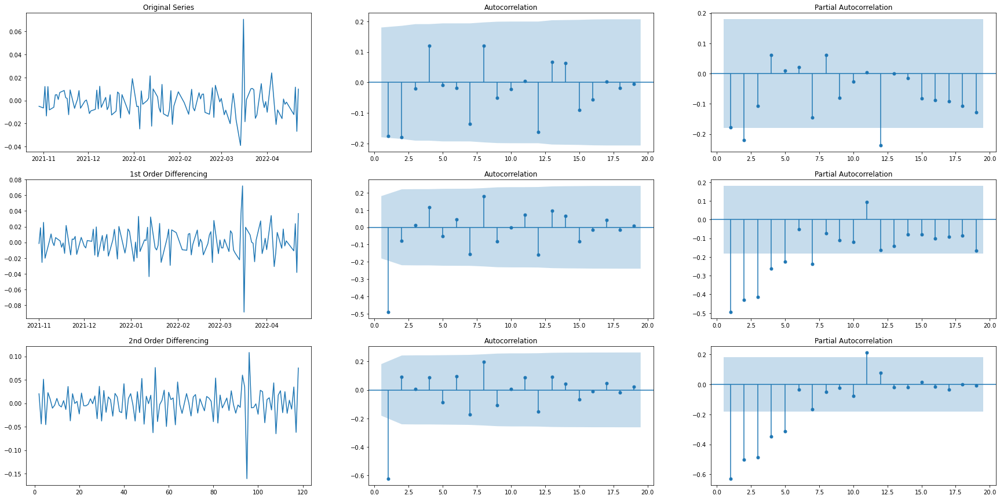

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,3.784711,7.702631,7.751721,9.569961,9.581667,9.622421,11.996413,13.854466,14.194780,14.254646,14.257706,17.772242,18.372110,18.912646,20.059379,20.510875,20.512376,20.565322,20.568504,20.683248
lb_pvalue,0.051723,0.021252,0.051431,0.048329,0.087994,0.141480,0.100677,0.085638,0.115563,0.161690,0.219060,0.122783,0.143895,0.168314,0.169667,0.198087,0.248864,0.301907,0.361125,0.415983


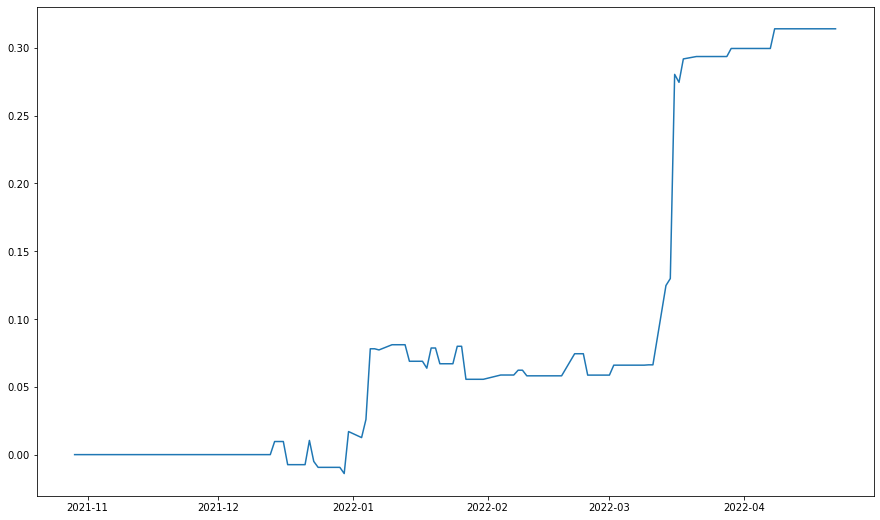

('2828.HK', '^HSCE')
(0, 0, 1)
Hang Seng China Enterprises Index ETF
HANG SENG CHINA ENTERPRISES IND


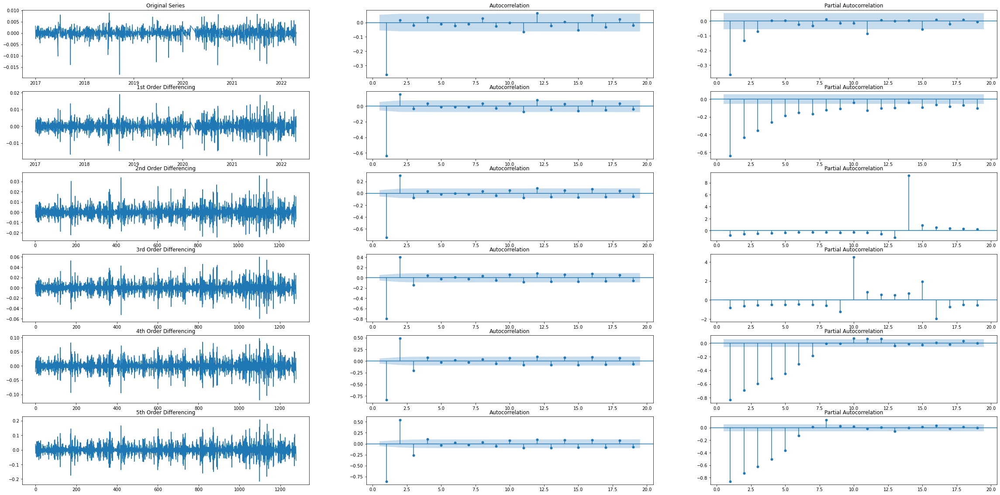

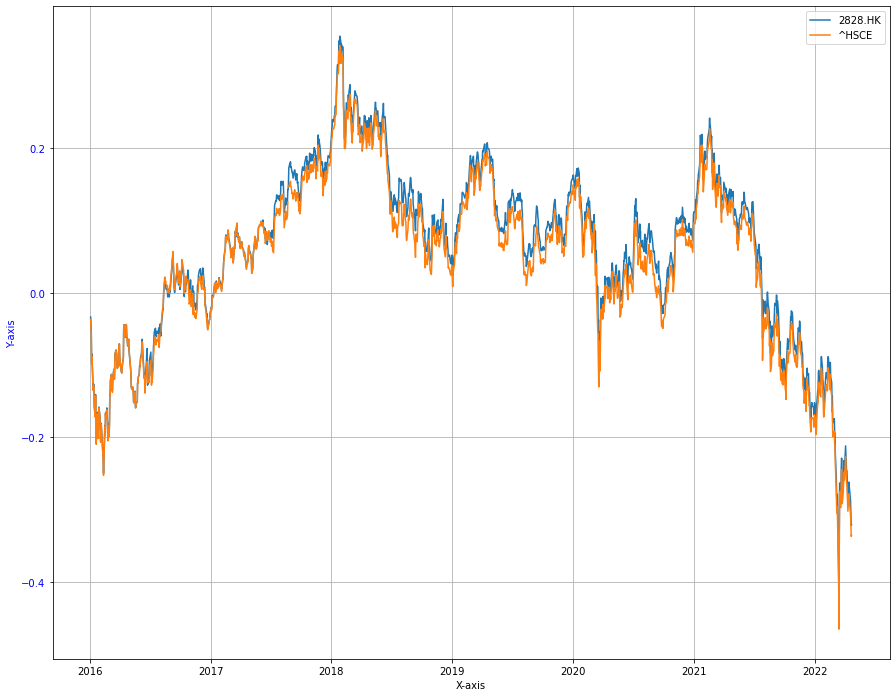

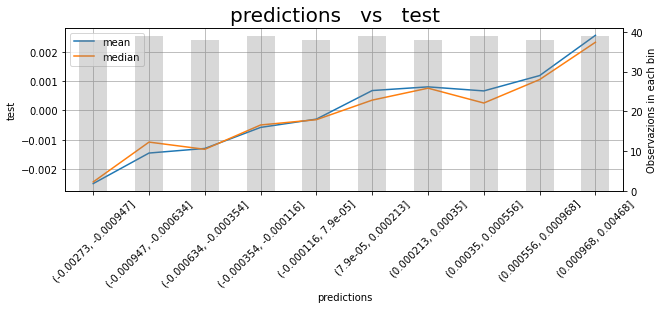

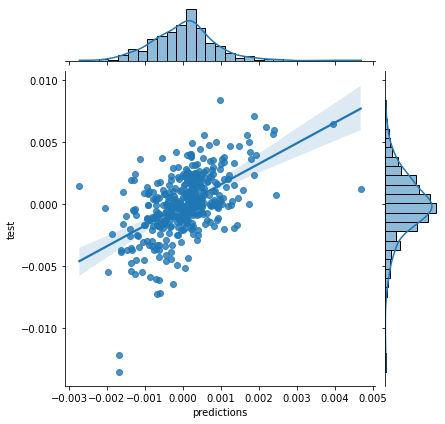

average position: 1.4853404599932571


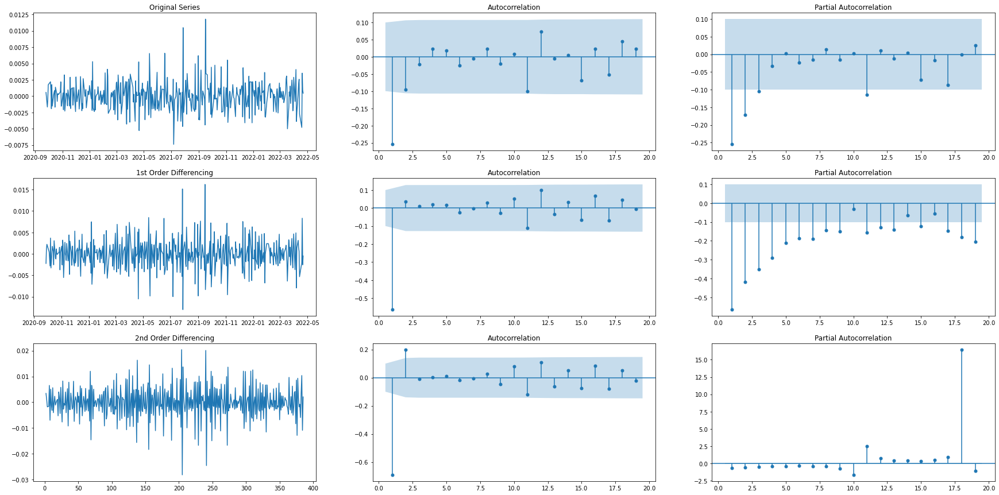

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,2.517247e+01,2.866276e+01,28.853950,29.057031,29.187683,29.449631,29.458873,29.661813,29.814114,29.84073,33.854429,36.008123,36.01642,36.023218,37.906053,38.136480,39.217449,40.013559,40.225249,40.316113
lb_pvalue,5.242512e-07,5.969814e-07,0.000002,0.000008,0.000021,0.000050,0.000119,0.000243,0.000472,0.00091,0.000382,0.000323,0.00059,0.001035,0.000932,0.001447,0.001667,0.002078,0.003057,0.004555


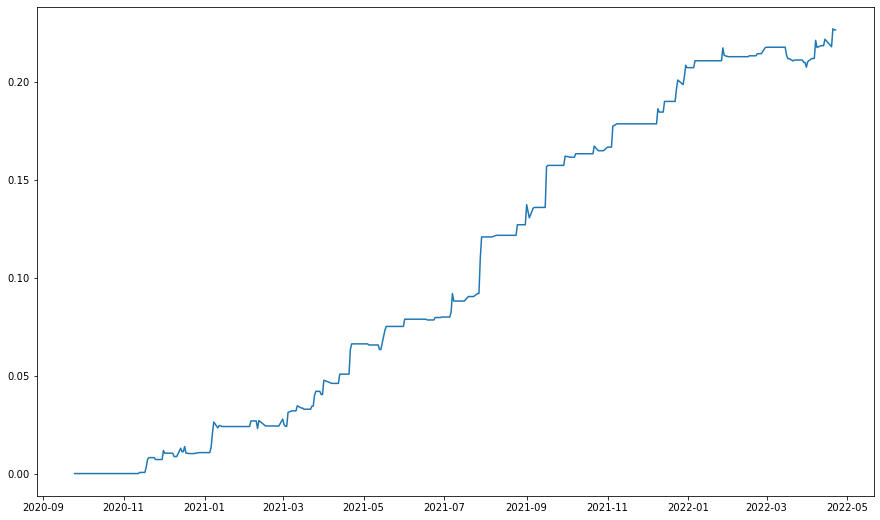

('3032.HK', '3033.HK')
(0, 0, 3)
Hang Seng TECH Index ETF
CSOP Hang Seng TECH Index ETF


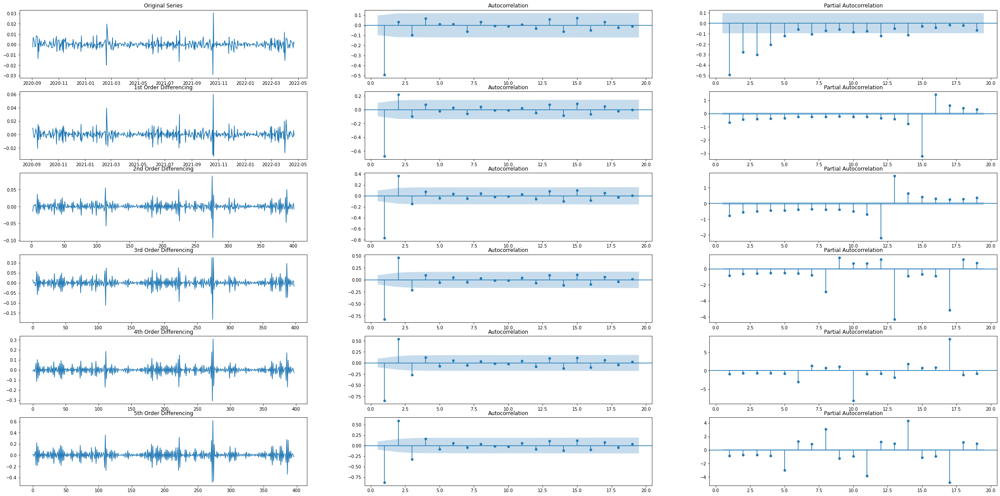

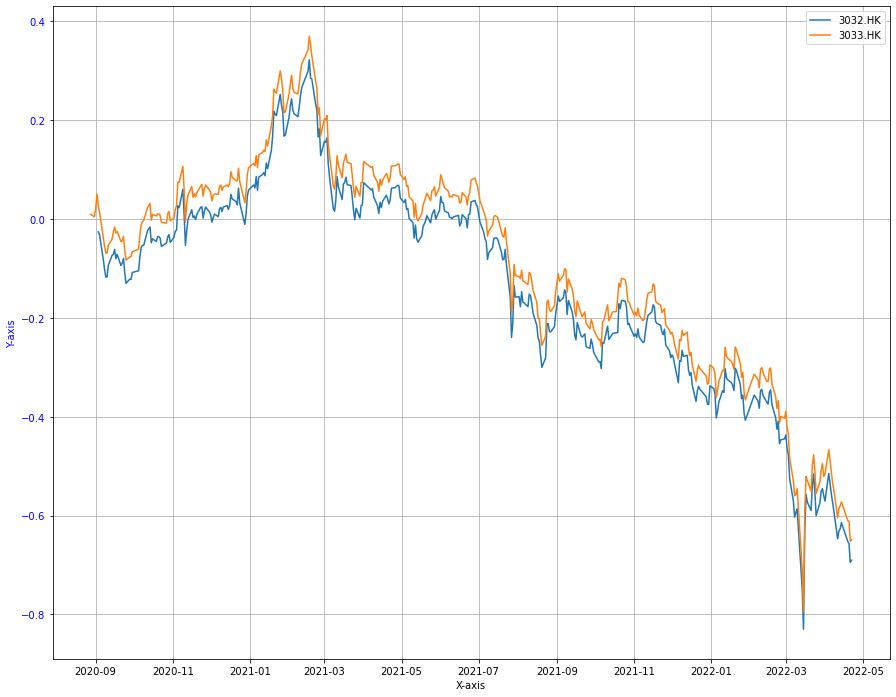

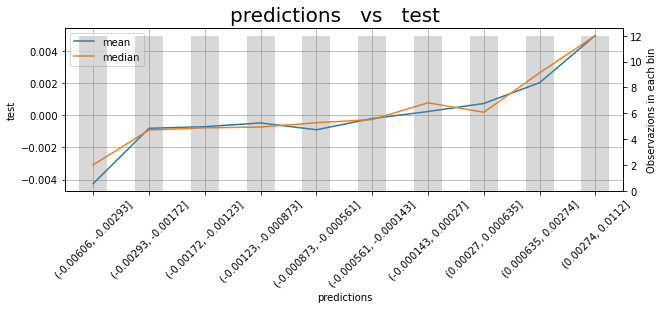

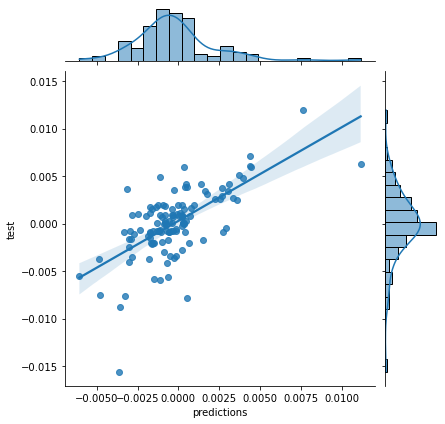

average position: 1.5911656957728315


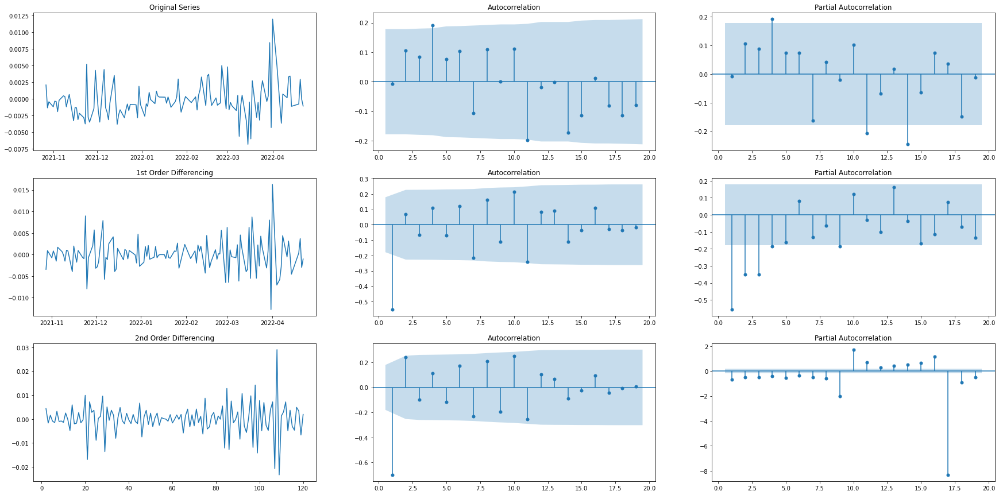

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,0.006755,1.385791,2.263563,6.927626,7.686700,9.089767,10.563586,12.127404,12.127582,13.801879,19.100883,19.149613,19.149793,23.333809,25.137286,25.160622,26.087309,27.978839,28.880983,28.905273
lb_pvalue,0.934498,0.500126,0.519537,0.139763,0.174368,0.168592,0.158820,0.145609,0.206212,0.182222,0.059306,0.084981,0.118532,0.055050,0.048130,0.067043,0.072884,0.062378,0.067880,0.089641


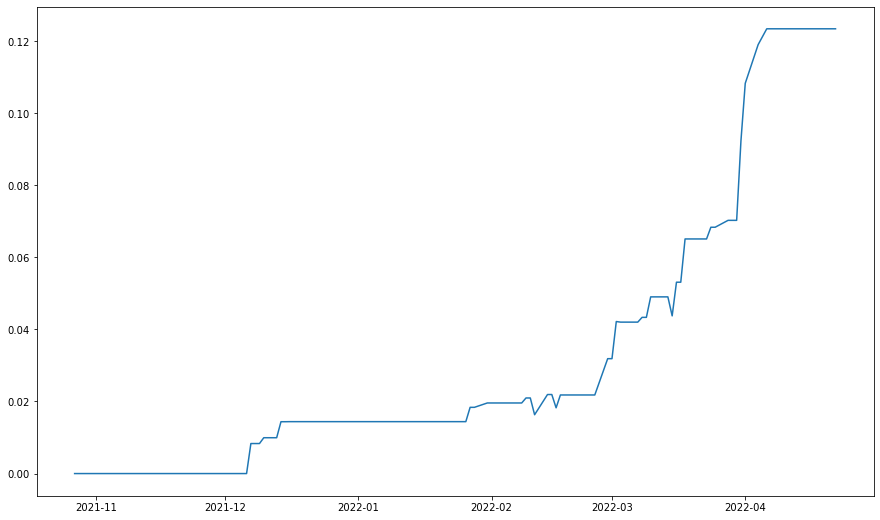

('3032.HK', '3067.HK')
(0, 0, 4)
Hang Seng TECH Index ETF
iShares Hang Seng TECH ETF


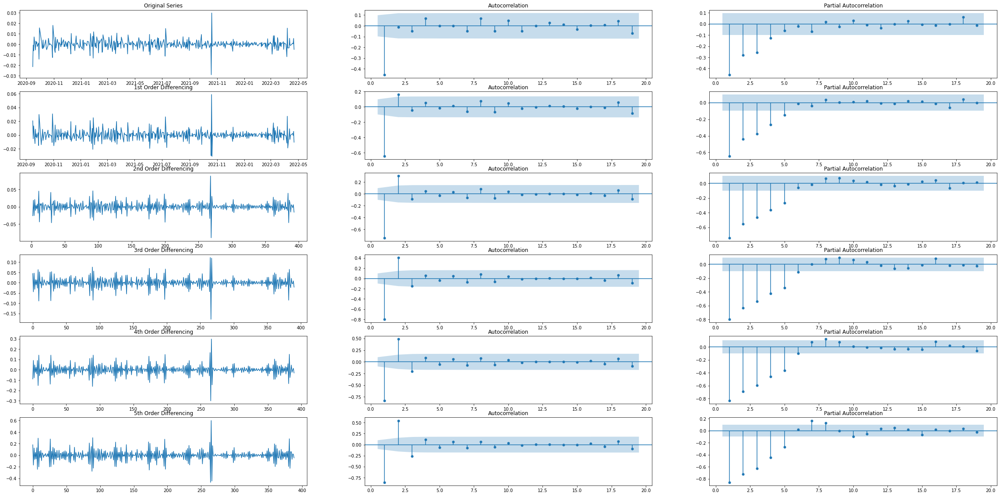

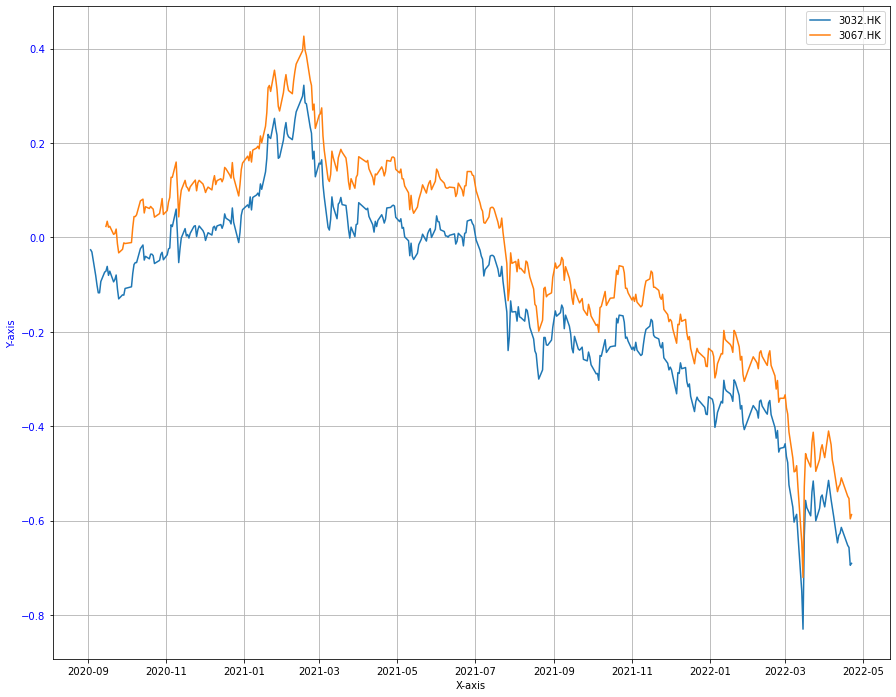

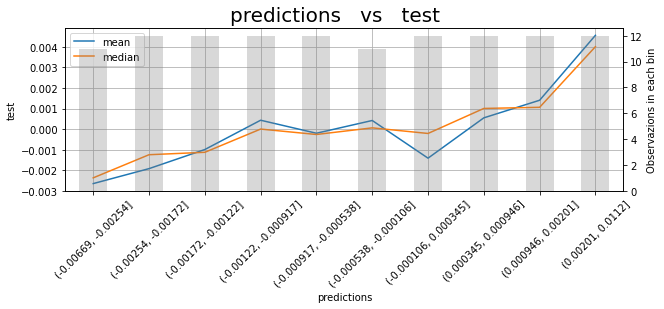

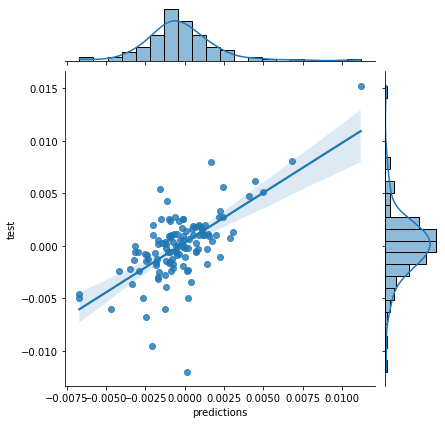

average position: 1.5533649191153243


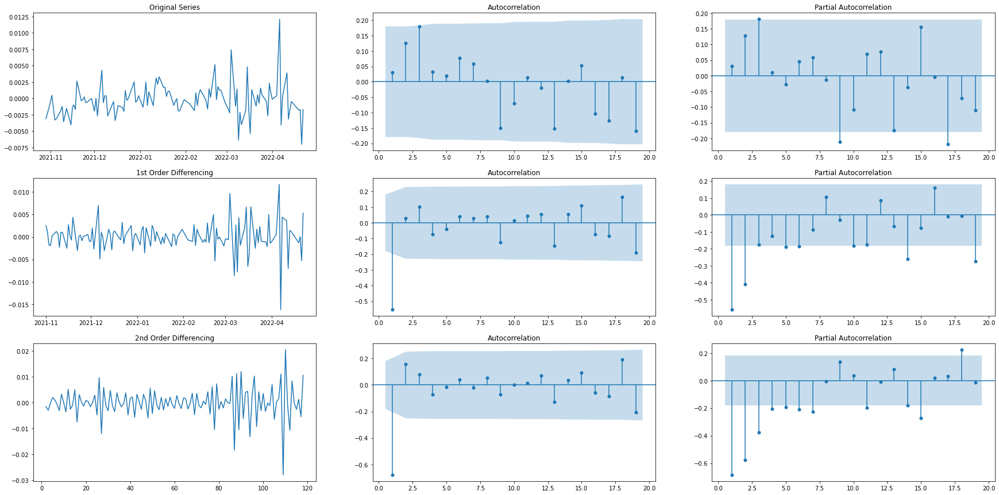

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,0.114545,2.065939,6.097927,6.222823,6.265258,7.037513,7.485959,7.486946,10.418768,11.075444,11.098527,11.153815,14.272883,14.273691,14.650002,16.156719,18.382089,18.410429,22.074336,22.145793
lb_pvalue,0.735028,0.355948,0.106942,0.183114,0.281257,0.317392,0.380091,0.485117,0.317659,0.351671,0.435046,0.515785,0.354911,0.429526,0.476910,0.442077,0.365129,0.428939,0.280572,0.332652


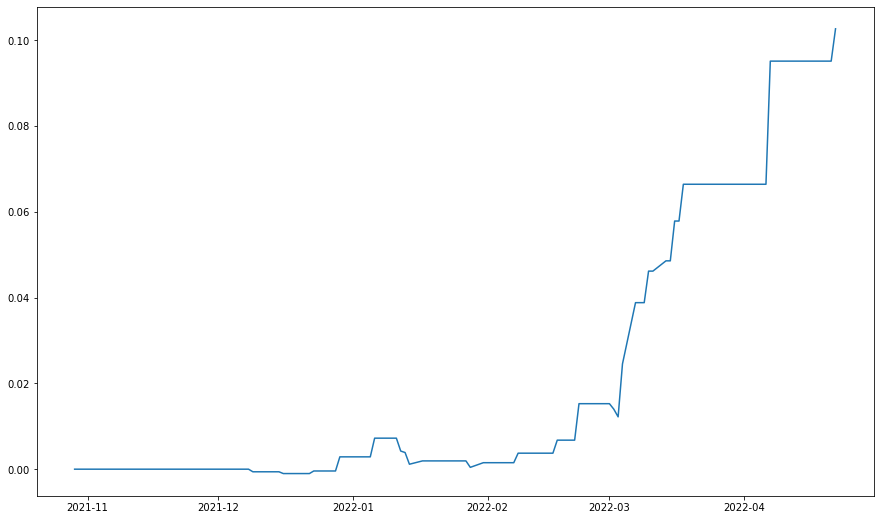

('3032.HK', '7226.HK')
(0, 0, 1)
Hang Seng TECH Index ETF
CSOP Hang Seng TECH Index Daily (2x) Leveraged Product


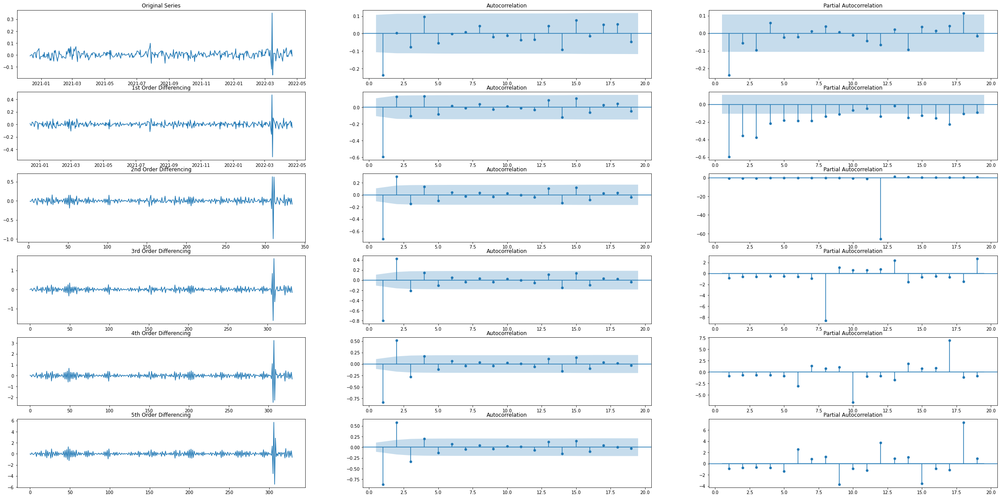

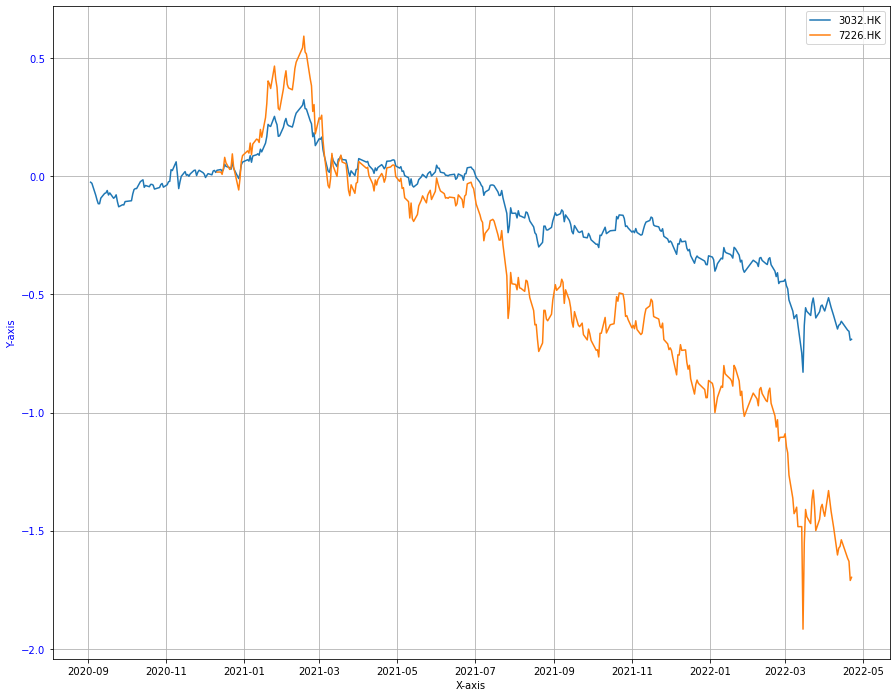

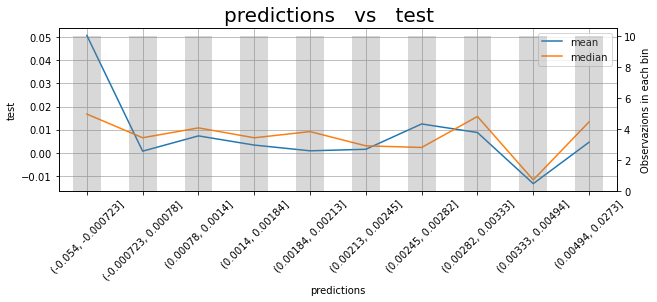

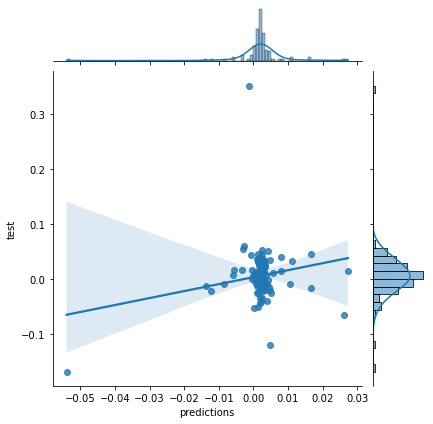

average position: 1.5527933319572227


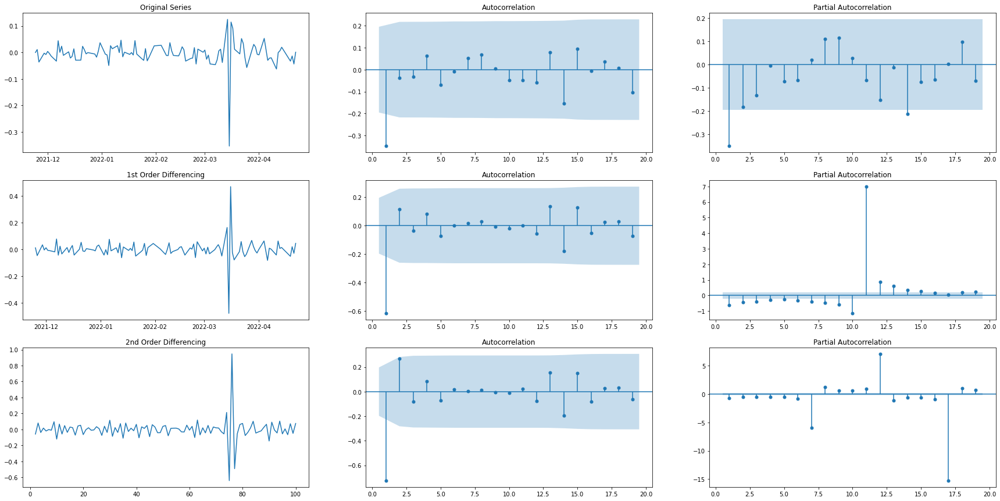

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,12.574257,12.713617,12.82114,13.242229,13.777696,13.784067,14.101843,14.631053,14.633557,14.887988,15.169007,15.570307,16.304103,19.099241,20.169934,20.175086,20.336390,20.341602,21.723319,21.796128
lb_pvalue,0.000391,0.001735,0.00504,0.010151,0.017085,0.032144,0.049399,0.066729,0.101506,0.136199,0.174890,0.211719,0.233098,0.161192,0.165510,0.212438,0.257386,0.313920,0.298242,0.351675


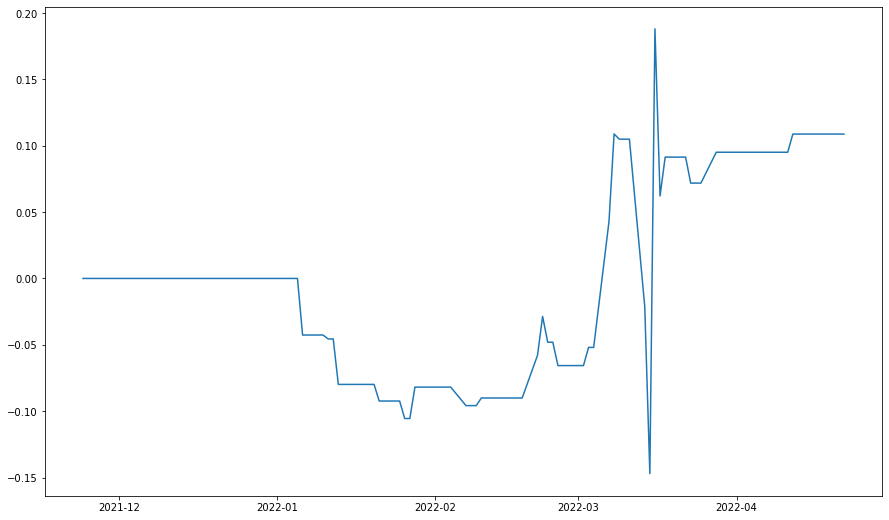

('3032.HK', '^HSCE')
(0, 0, 3)
Hang Seng TECH Index ETF
HANG SENG CHINA ENTERPRISES IND


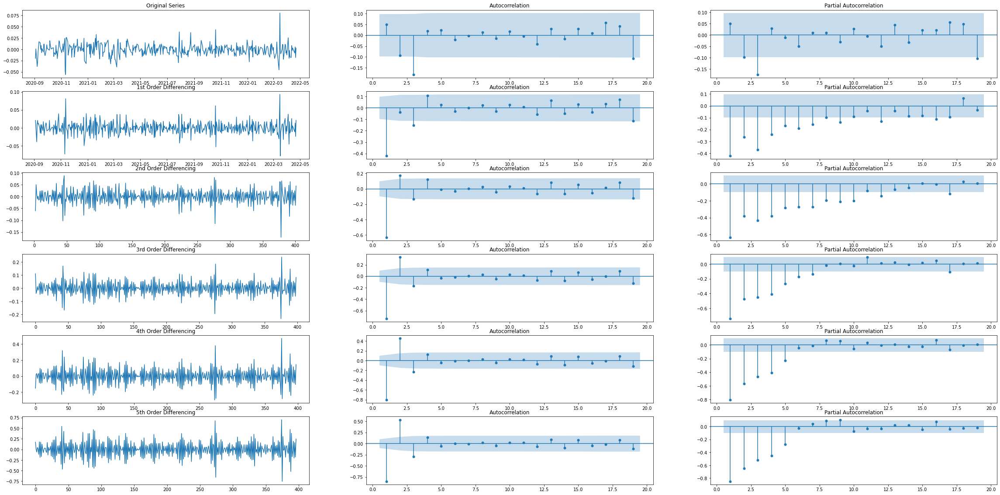

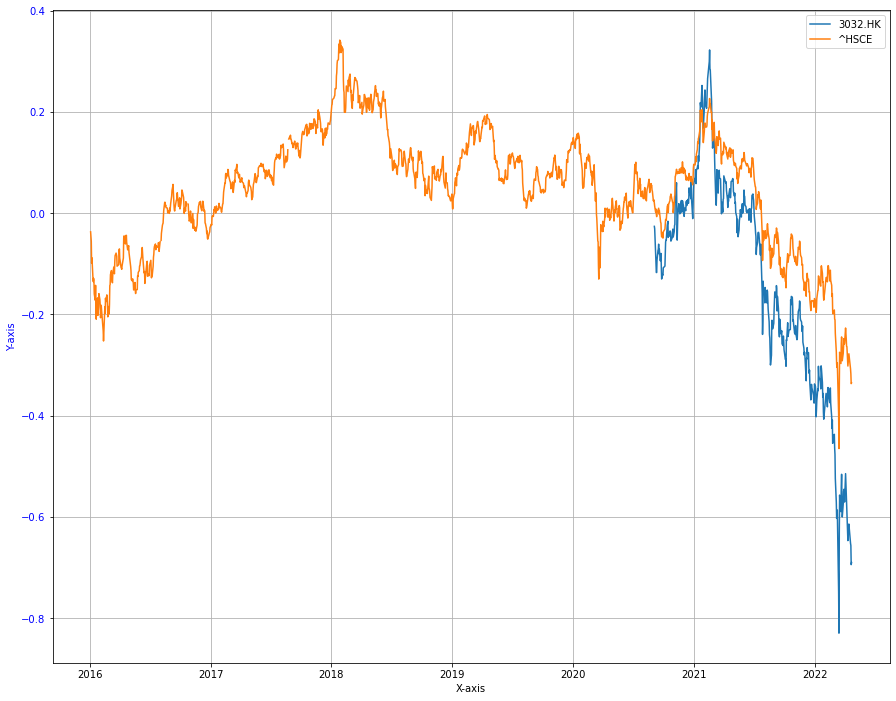

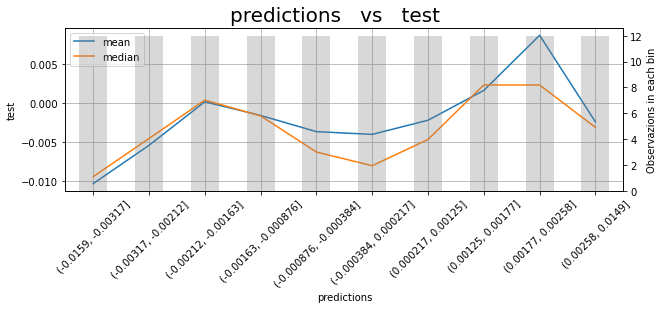

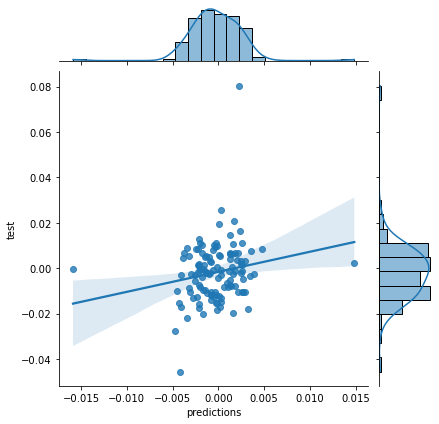

average position: 1.4696845201238917


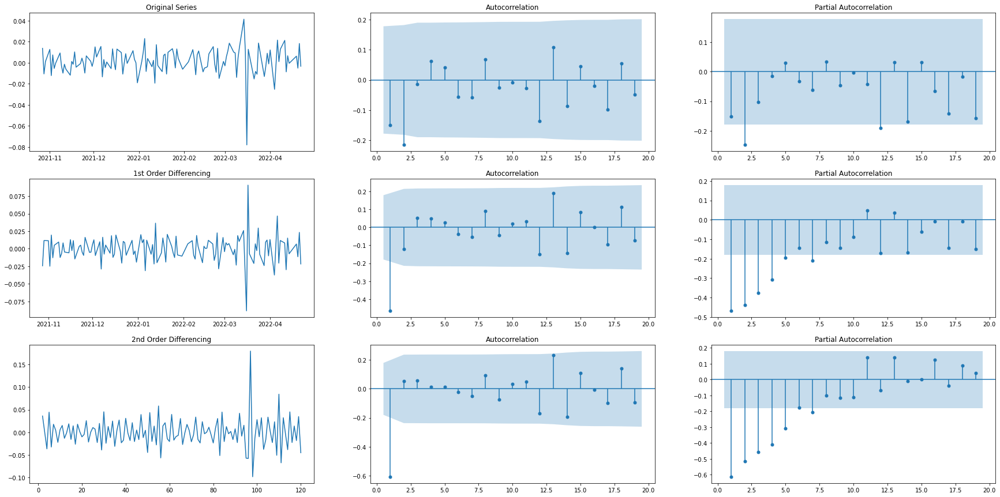

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,2.807950,8.624886,8.652926,9.153407,9.369178,9.764027,10.204742,10.808454,10.890479,10.900012,11.004264,13.549783,15.149051,16.183702,16.483462,16.539408,17.939842,18.389440,18.740846,18.741344
lb_pvalue,0.093798,0.013401,0.034280,0.057377,0.095214,0.134948,0.177265,0.212790,0.283291,0.365361,0.442906,0.330377,0.298141,0.302285,0.350668,0.415989,0.392646,0.430288,0.473571,0.538692


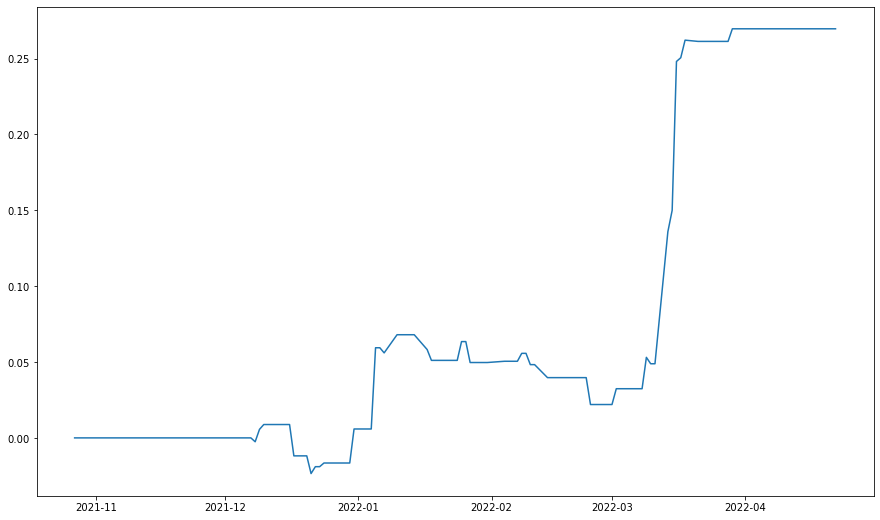

('3033.HK', '3067.HK')
(1, 0, 1)
CSOP Hang Seng TECH Index ETF
iShares Hang Seng TECH ETF


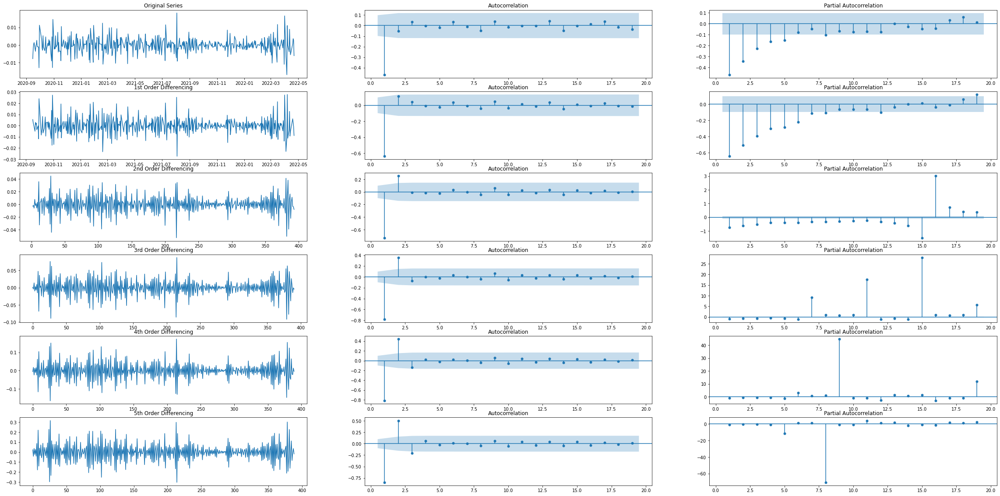

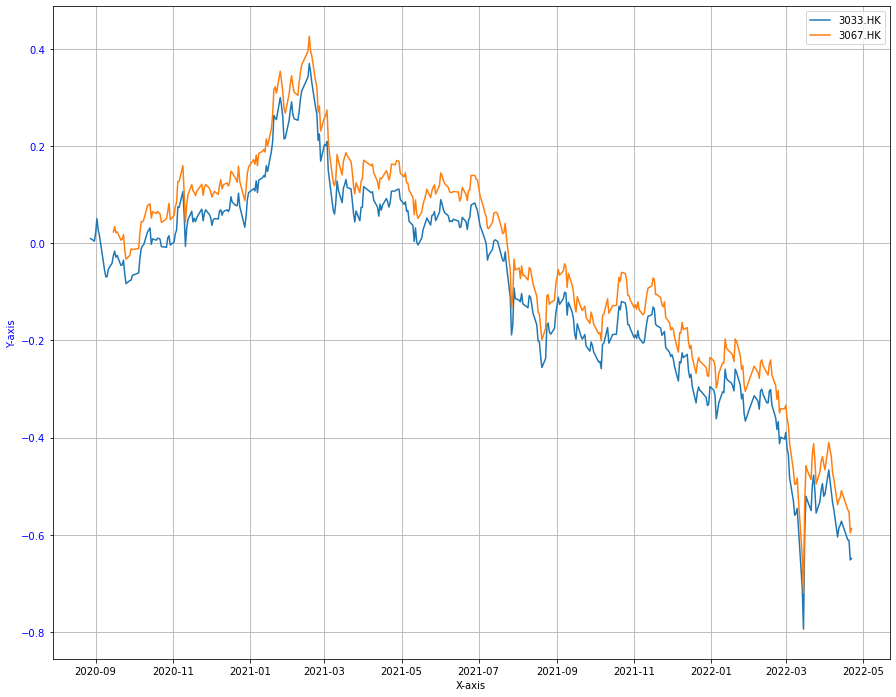

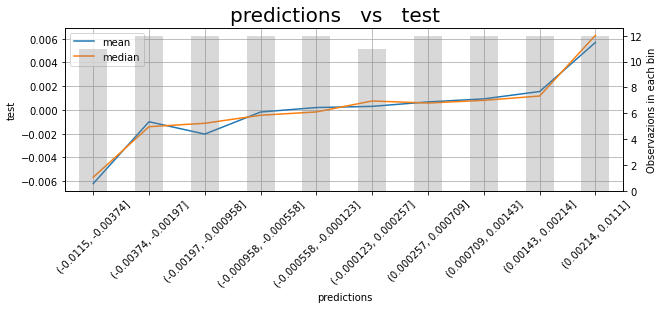

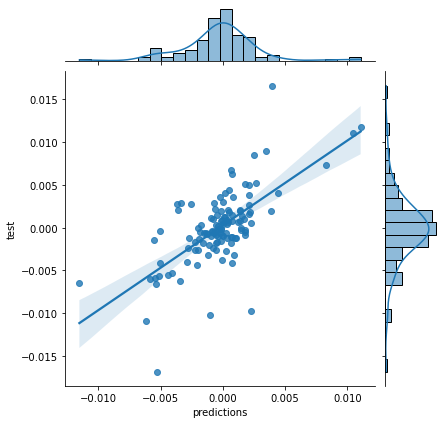

average position: 1.4915794833747695


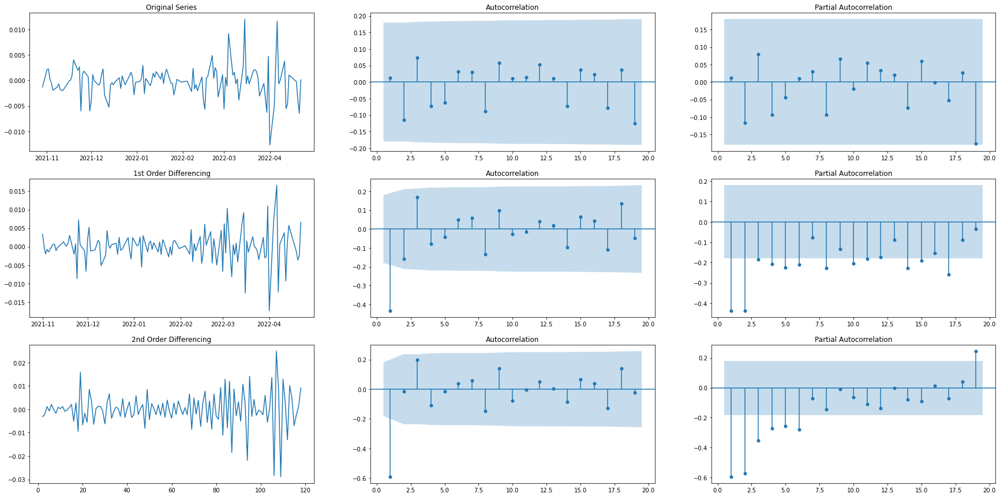

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,0.018271,1.608278,2.289937,2.953741,3.452431,3.579204,3.693218,4.719137,5.171010,5.188139,5.217730,5.590589,5.608080,6.324184,6.524079,6.599268,7.463344,7.661157,9.927502,15.153555
lb_pvalue,0.892478,0.447473,0.514451,0.565596,0.630597,0.733404,0.814357,0.787130,0.819153,0.878261,0.920165,0.935299,0.959262,0.957647,0.969538,0.980234,0.976718,0.983265,0.954712,0.767555


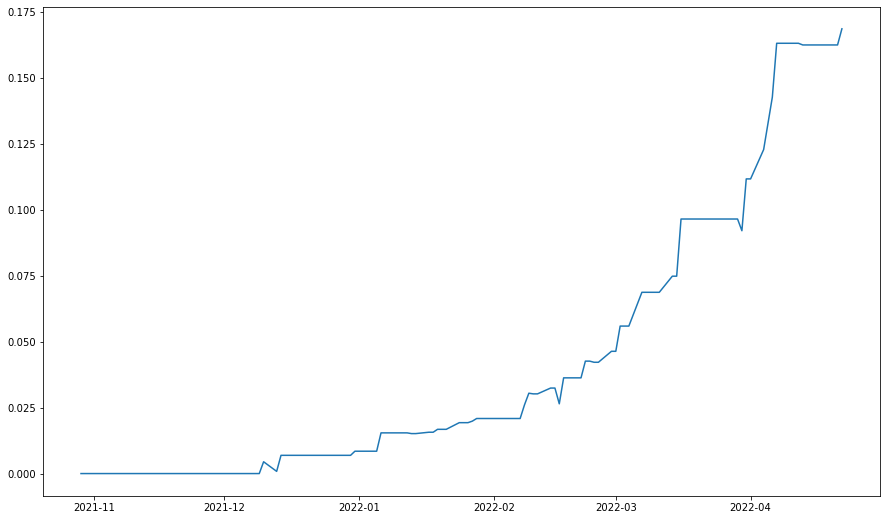

('3033.HK', '7226.HK')
(0, 0, 1)
CSOP Hang Seng TECH Index ETF
CSOP Hang Seng TECH Index Daily (2x) Leveraged Product


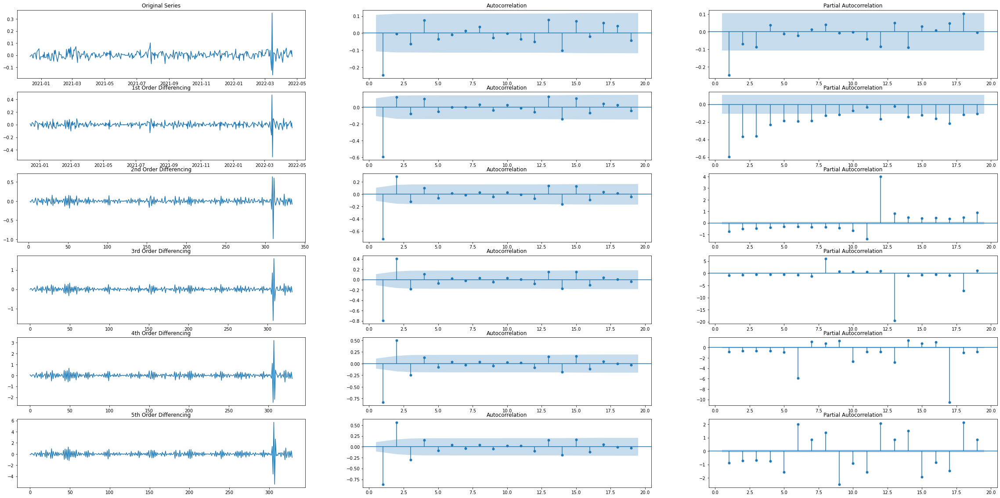

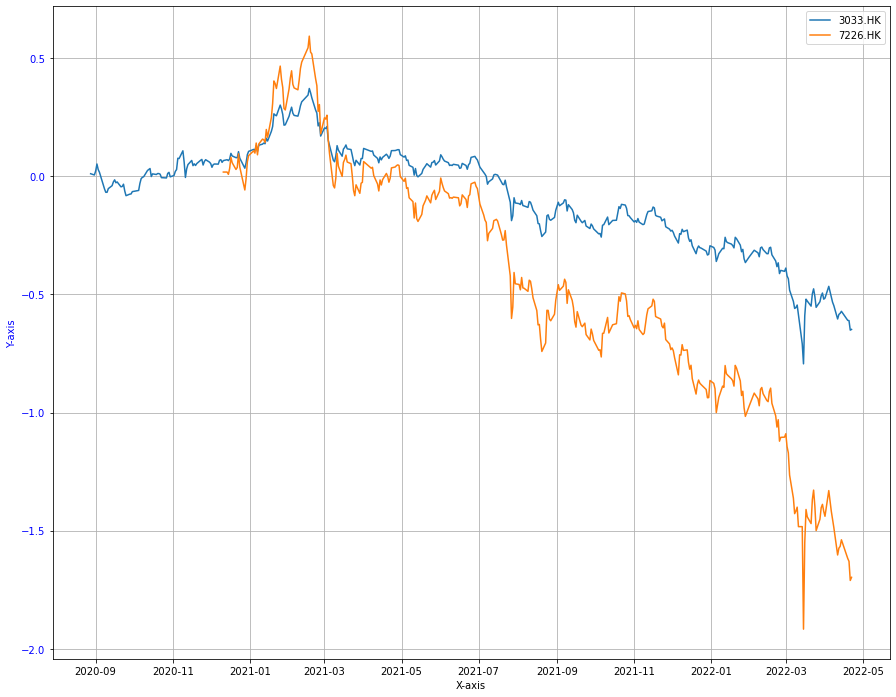

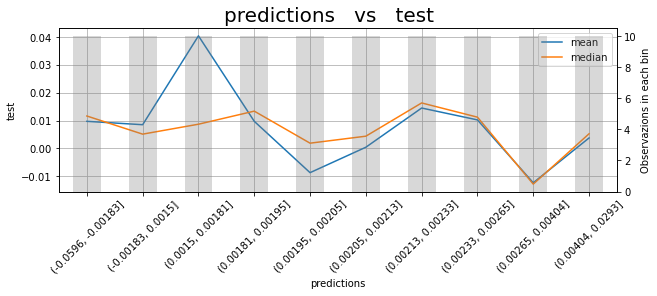

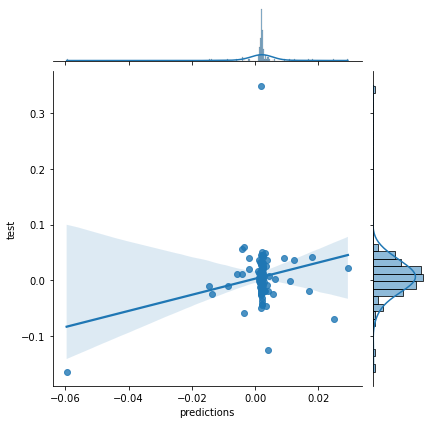

average position: 1.5453465368843002


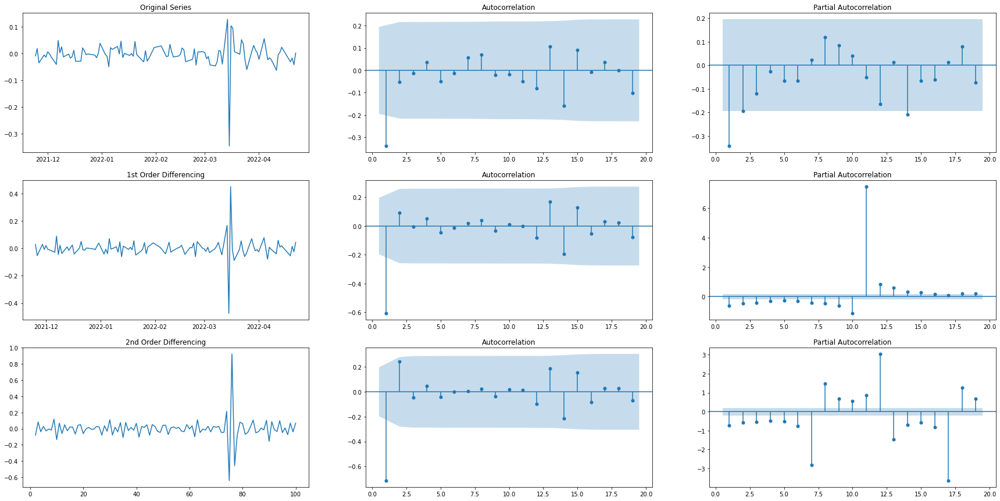

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,12.005419,12.289818,12.309319,12.457497,12.736322,12.754184,13.116718,13.679981,13.727596,13.764263,14.063095,14.802723,16.122457,19.145857,20.160178,20.165776,20.335257,20.335343,21.655977,21.657400
lb_pvalue,0.000530,0.002144,0.006395,0.014255,0.025979,0.047110,0.069315,0.090497,0.132350,0.184018,0.229522,0.252403,0.242580,0.159451,0.165874,0.212847,0.257442,0.314260,0.301711,0.359387


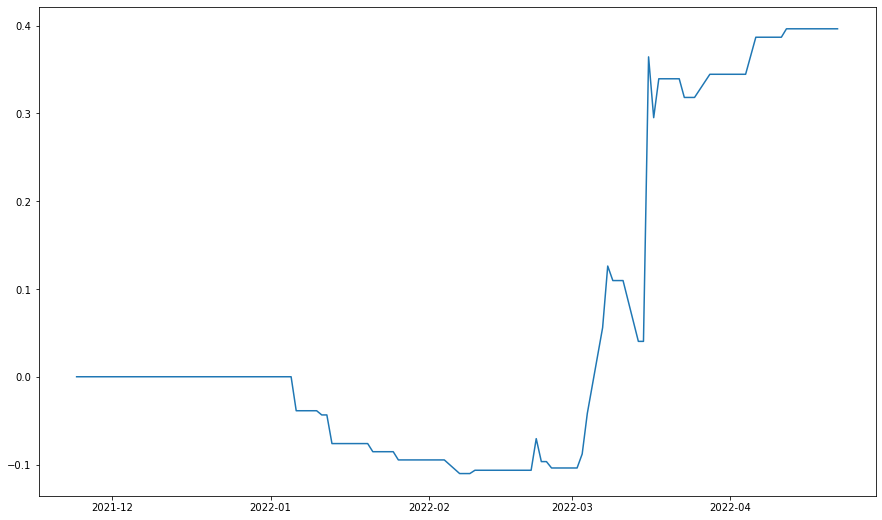

('3033.HK', '^HSCE')
(0, 0, 3)
CSOP Hang Seng TECH Index ETF
HANG SENG CHINA ENTERPRISES IND


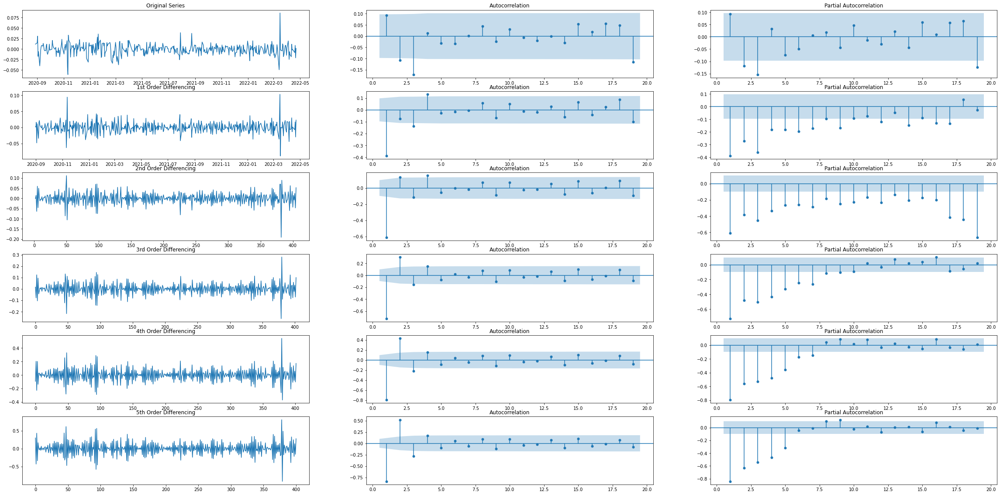

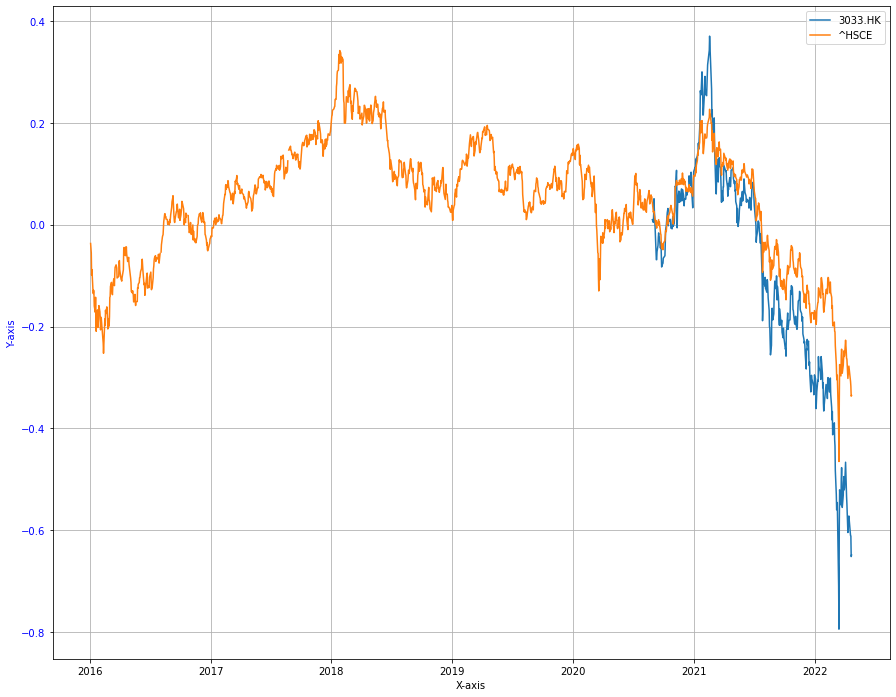

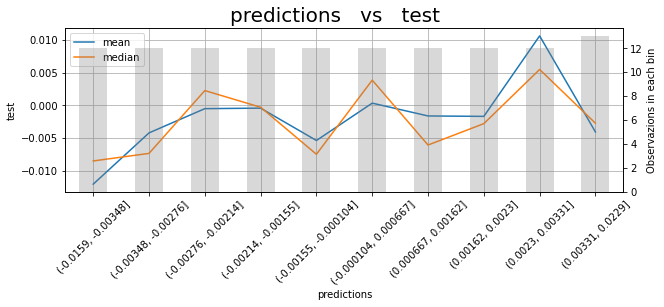

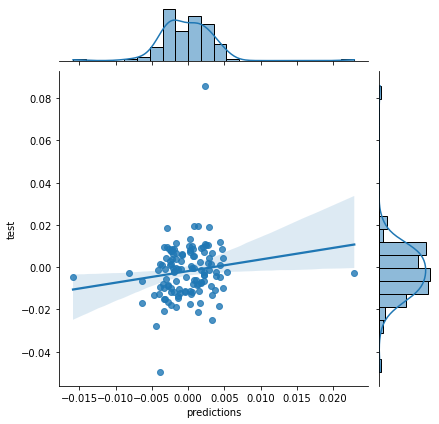

average position: 1.4004530038199636


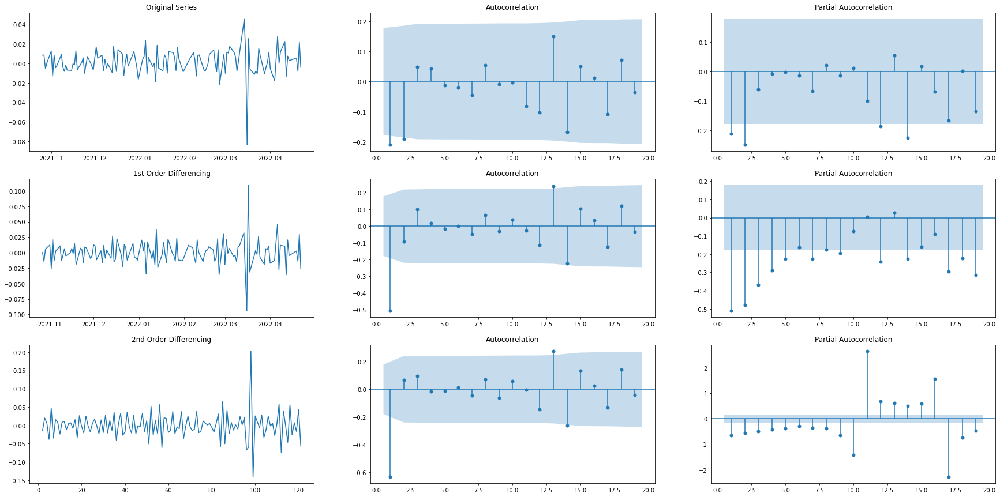

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,5.515052,10.063506,10.353416,10.589313,10.612001,10.668574,10.944368,11.339049,11.348073,11.349574,12.243467,13.670358,16.801189,20.717909,21.076053,21.099226,22.808262,23.548638,23.730496,24.472204
lb_pvalue,0.018854,0.006527,0.015789,0.031589,0.059639,0.099176,0.141064,0.183218,0.252603,0.330939,0.345624,0.322252,0.208553,0.109083,0.134417,0.174728,0.155597,0.170378,0.206694,0.222374


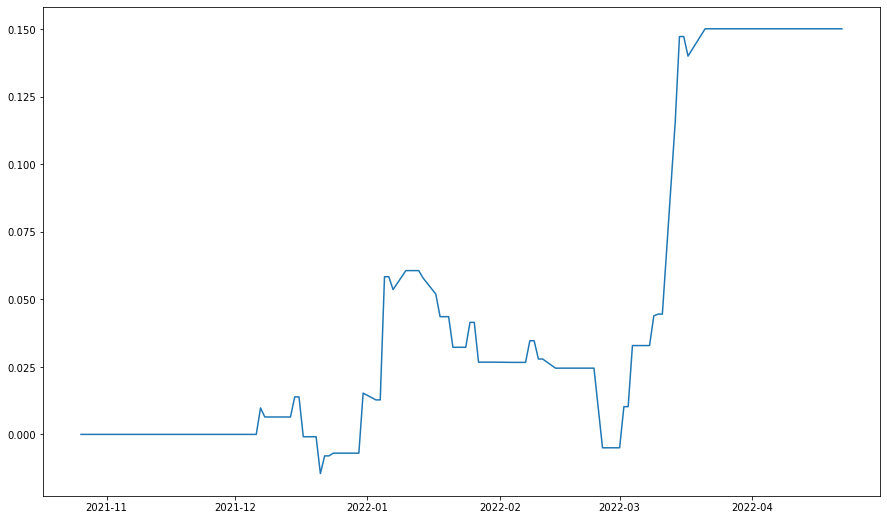

('3067.HK', '7226.HK')
(0, 0, 1)
iShares Hang Seng TECH ETF
CSOP Hang Seng TECH Index Daily (2x) Leveraged Product


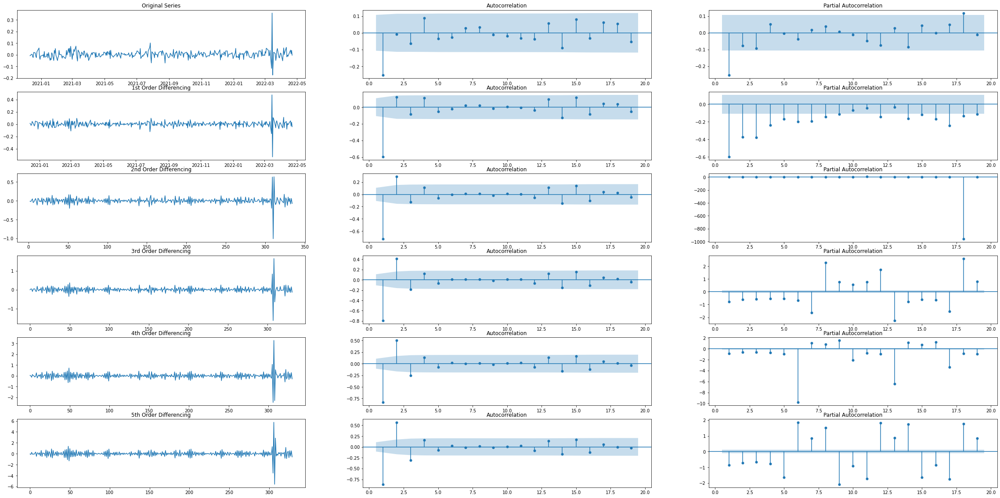

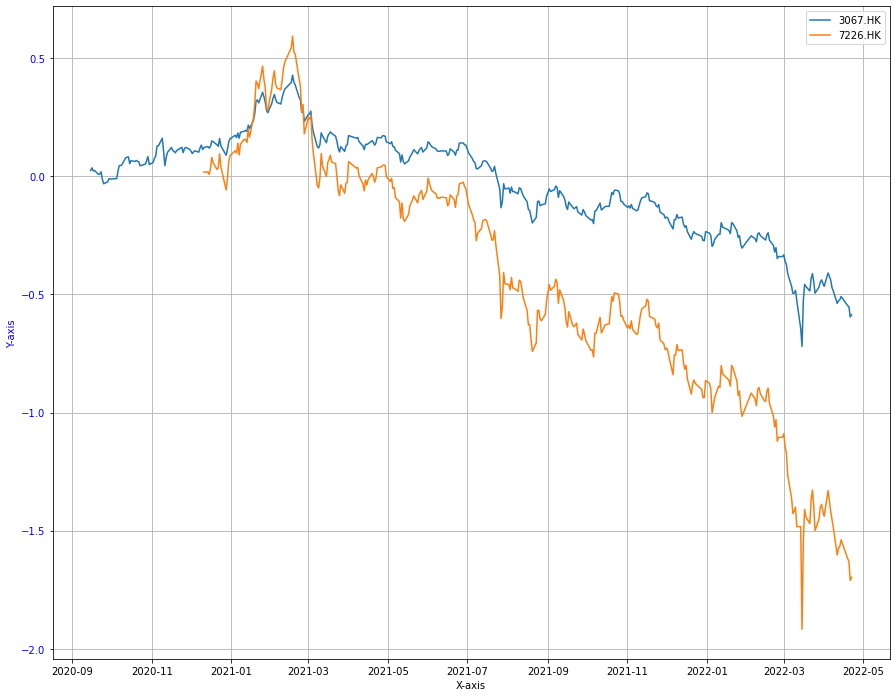

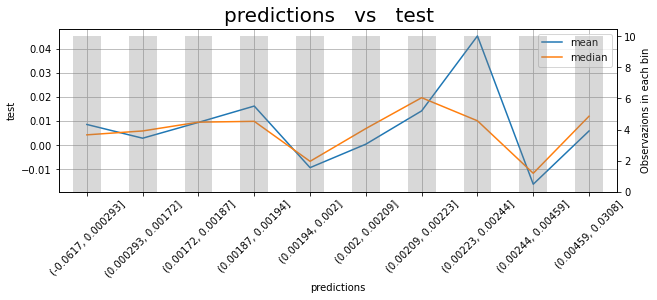

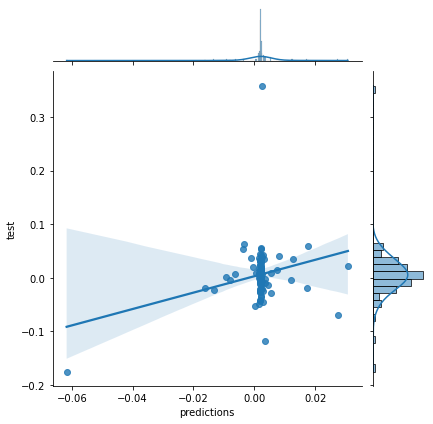

average position: 1.7079007700687852


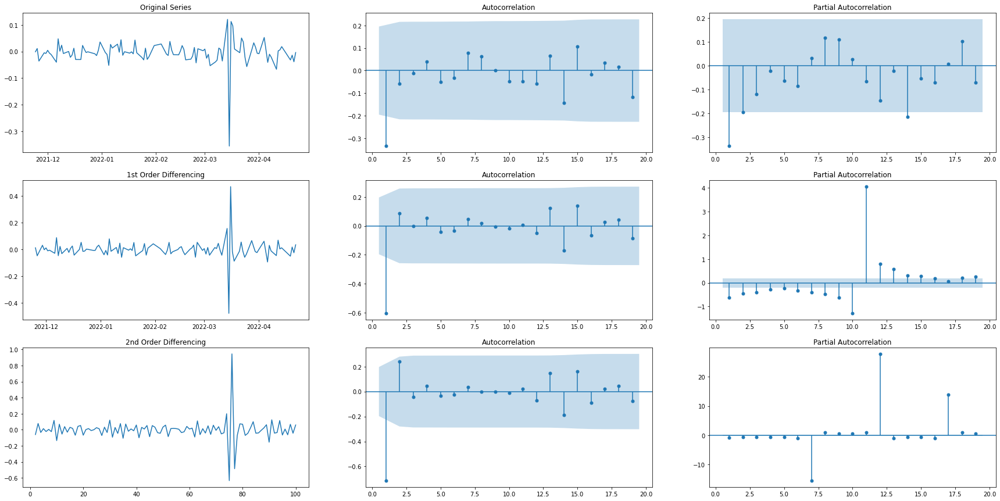

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,11.616013,11.972901,11.987461,12.162776,12.441410,12.548189,13.213568,13.671910,13.671971,13.935591,14.187690,14.579192,15.087194,17.526444,18.887684,18.922532,19.062446,19.101998,20.834708,20.877781
lb_pvalue,0.000654,0.002513,0.007426,0.016181,0.029215,0.050799,0.067073,0.090728,0.134482,0.175950,0.222781,0.265259,0.301941,0.229207,0.218869,0.272701,0.324960,0.385568,0.346006,0.404357


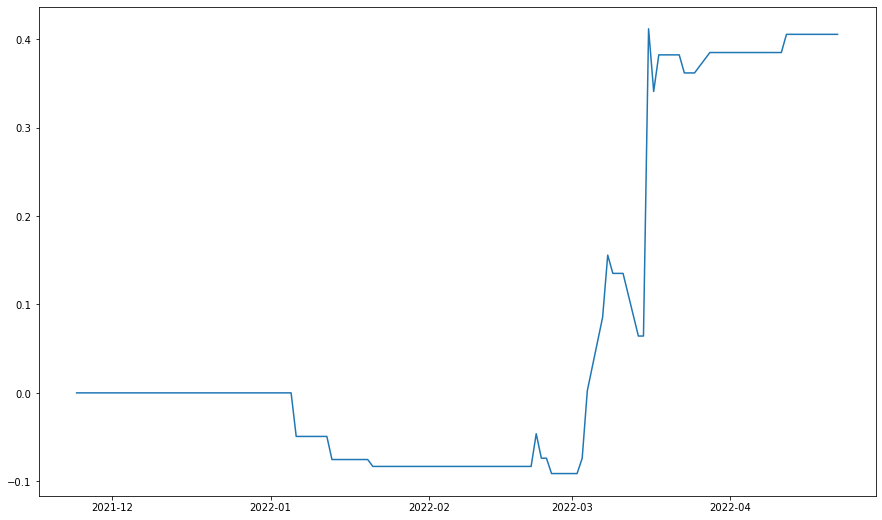

('3067.HK', '^HSCE')
(0, 0, 3)
iShares Hang Seng TECH ETF
HANG SENG CHINA ENTERPRISES IND


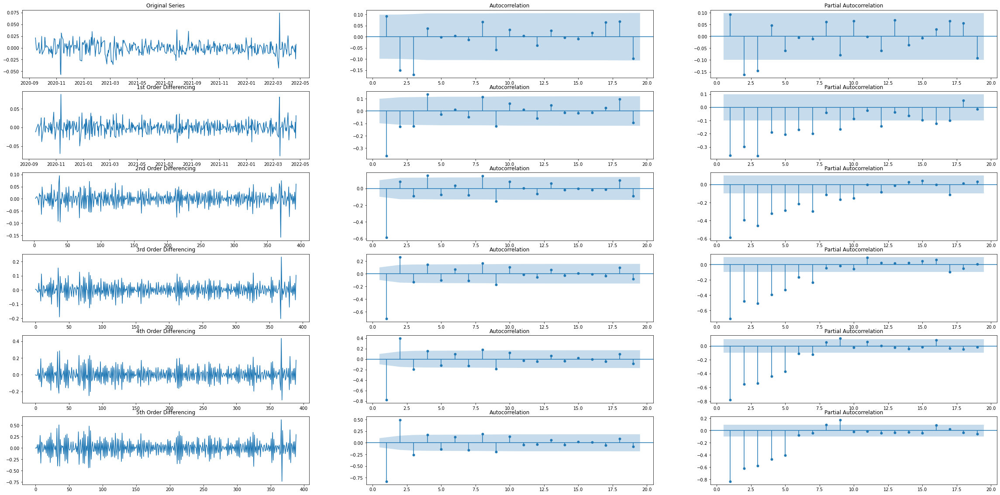

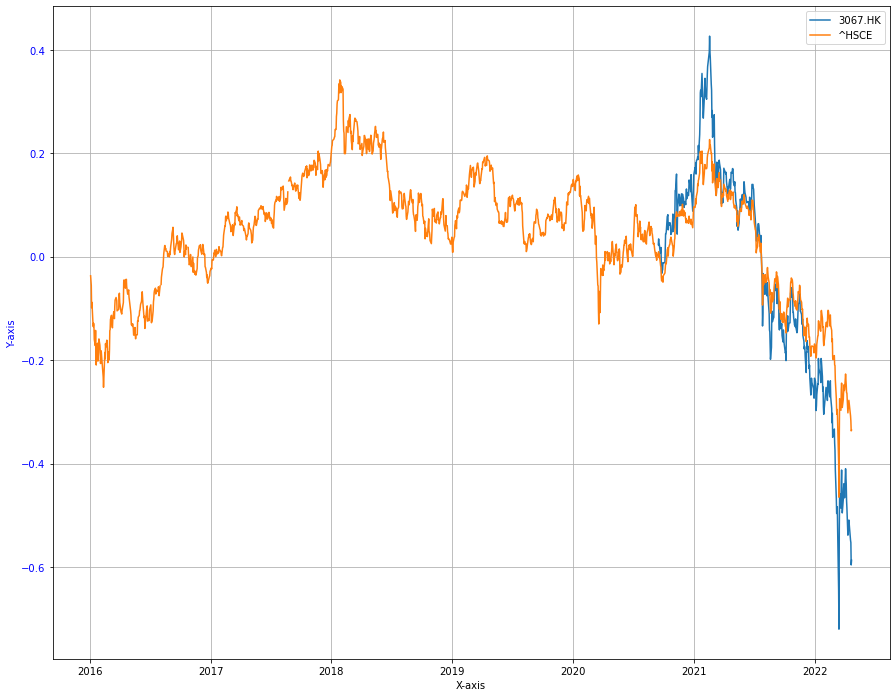

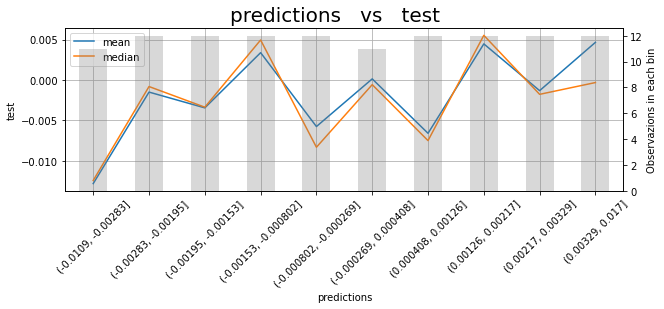

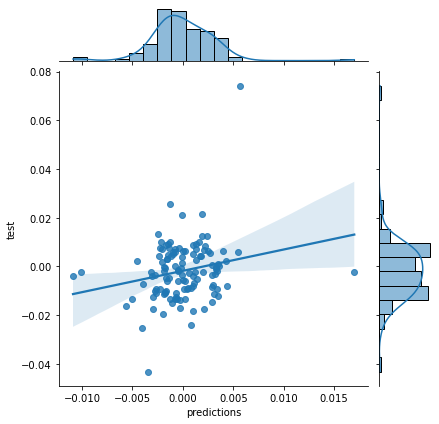

average position: 1.4811399327011525


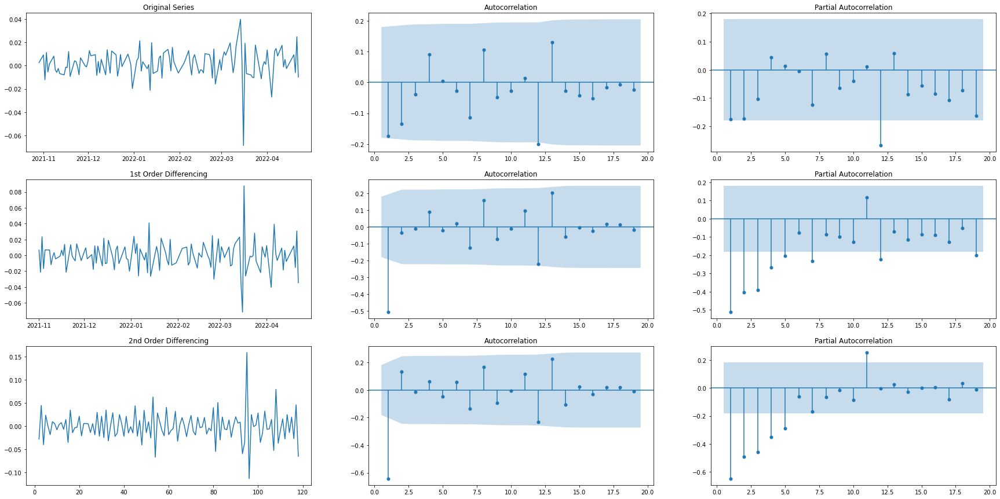

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,3.670110,5.929266,6.109424,7.158298,7.161365,7.254055,8.942065,10.396122,10.691499,10.785796,10.809983,16.188766,18.484335,18.582217,18.823217,19.201735,19.238053,19.246839,19.326685,19.366858
lb_pvalue,0.055397,0.051579,0.106406,0.127756,0.208913,0.297990,0.256842,0.238316,0.297449,0.374448,0.459317,0.182742,0.139980,0.181535,0.221857,0.258341,0.315041,0.376774,0.436066,0.498108


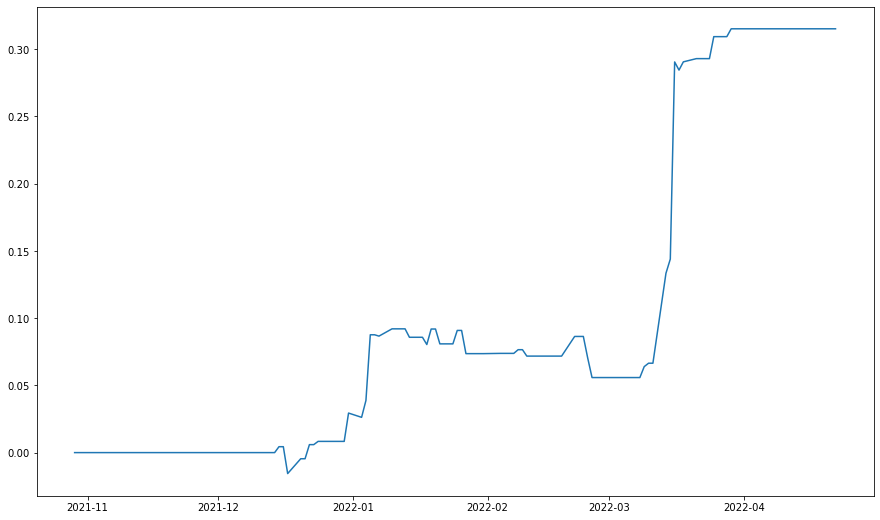

('7200.HK', '^HSI')
(0, 0, 0)
CSOP Hang Seng Index Daily (2x) Leveraged Product
HANG SENG INDEX


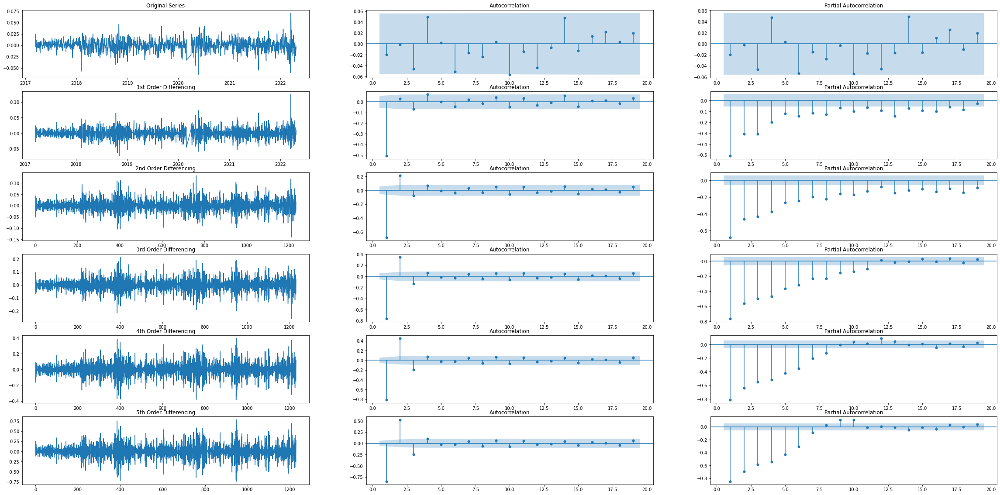

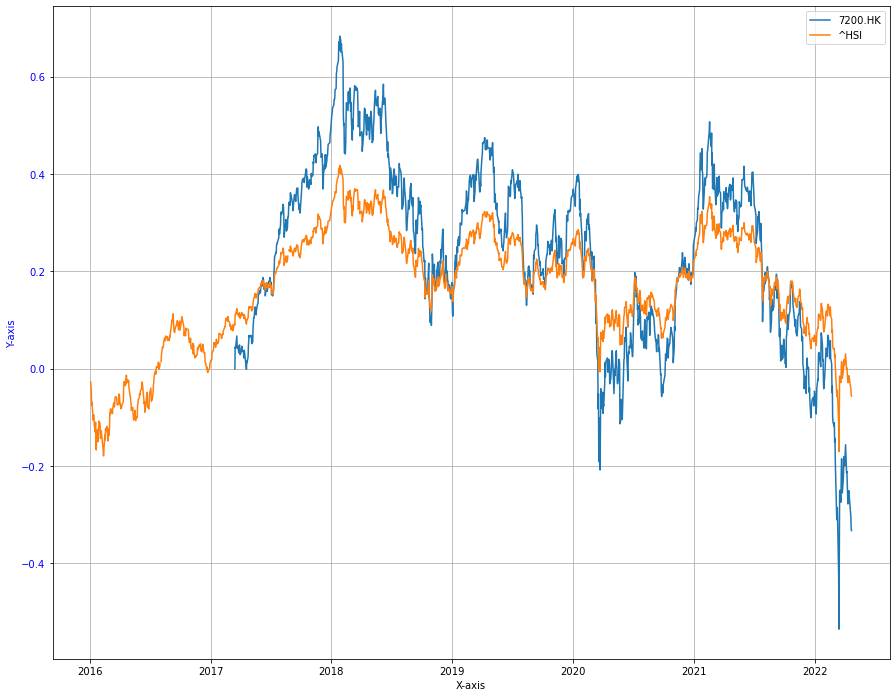

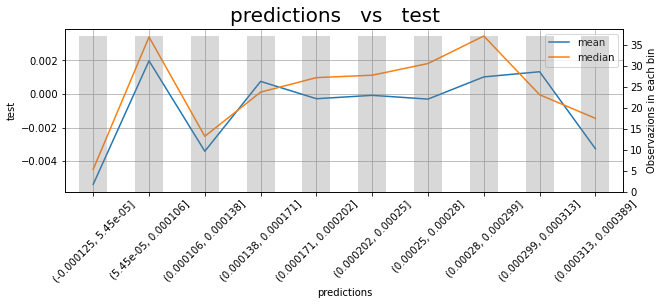

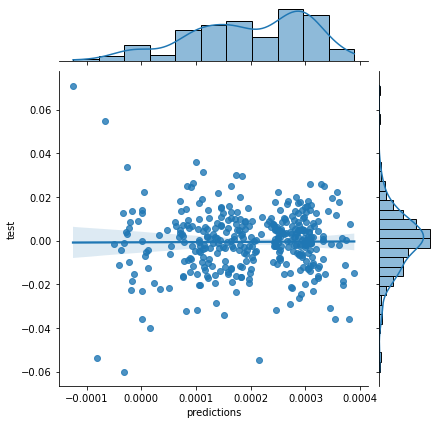

average position: 1.5926678032006836


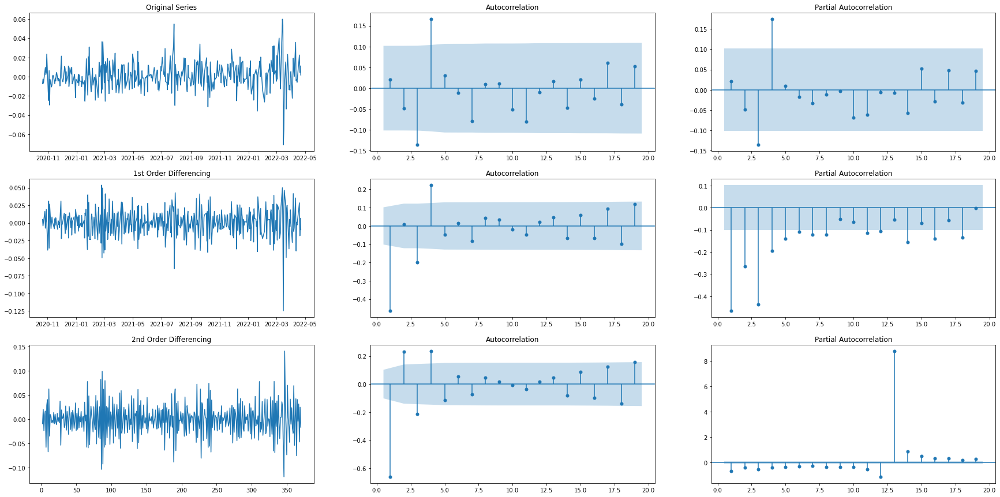

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
lb_stat,0.165576,1.051190,8.054409,18.419963,18.782205,18.829729,21.241806,21.272897,21.323809,22.358432,24.829069,24.866527,24.968393,25.856500,26.027685,26.278216,27.747572,28.361911,29.444132,32.484204
lb_pvalue,0.684073,0.591203,0.044901,0.001021,0.002110,0.004461,0.003428,0.006457,0.011288,0.013379,0.009657,0.015468,0.023305,0.026995,0.037733,0.050237,0.047976,0.056757,0.059313,0.038404


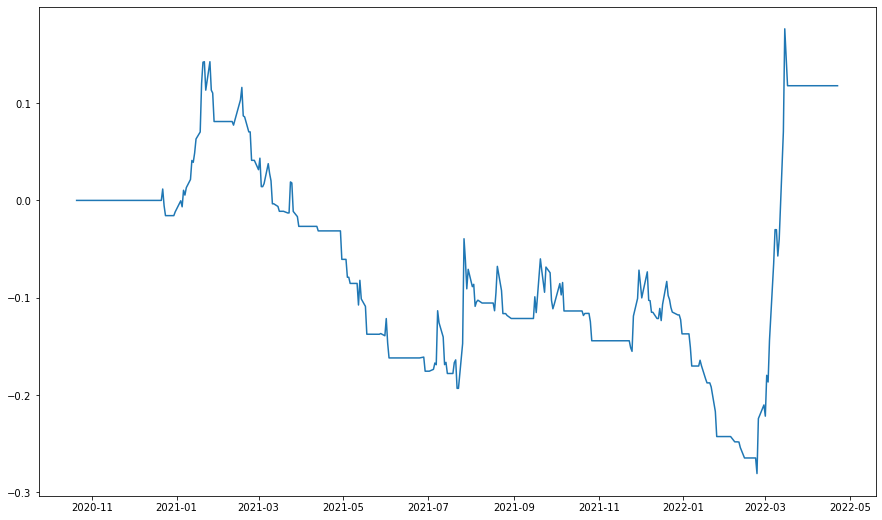

In [417]:
period=30
# for keys in [('2828.HK', '^HSCE'),]:
for keys in pairs_list:
# for keys in result_dic.keys():
    lags=20
    print(keys)
    print(param_dic[keys])
    name1,name2=keys
    print(name_dic[name1])
    print(name_dic[name2])
    temp=log_ret[[name1,name2]]
    diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
    diff=diff.loc[diff.index.year>2016]
    diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
    df = diff.dropna()
    df = diff.dropna()

    fig, axes = plt.subplots(6, 3,figsize=(40,20))
    axes[0, 0].plot(df); axes[0, 0].set_title('Original Series')
    plot_acf(df.dropna().values, ax=axes[0, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.dropna().values, ax=axes[0, 2],zero=False,lags=np.arange(1,lags))
    
    axes[1, 0].plot(df.diff()); axes[1, 0].set_title('1st Order Differencing')
    plot_acf(df.diff().dropna().values, ax=axes[1, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().dropna(), ax=axes[1, 2],zero=False,lags=np.arange(1,lags))

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values); axes[2, 0].set_title('2nd Order Differencing')
    plot_acf(df.diff().diff().dropna().values, ax=axes[2, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().diff().dropna(), ax=axes[2, 2],zero=False,lags=np.arange(1,lags))

    axes[3, 0].plot(df.diff().diff().diff().dropna().values); axes[3, 0].set_title('3rd Order Differencing')
    plot_acf(df.diff().diff().diff().dropna().values, ax=axes[3, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().diff().diff().dropna(), ax=axes[3, 2],zero=False,lags=np.arange(1,lags))

    axes[4, 0].plot(df.diff().diff().diff().diff().dropna().values); axes[4, 0].set_title('4th Order Differencing')
    plot_acf(df.diff().diff().diff().diff().dropna().values, ax=axes[4, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().diff().diff().diff().dropna(), ax=axes[4, 2],zero=False,lags=np.arange(1,lags))

    axes[5, 0].plot(df.diff().diff().diff().diff().diff().dropna().values); axes[5, 0].set_title('5th Order Differencing')
    plot_acf(df.diff().diff().diff().diff().diff().dropna().values, ax=axes[5, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().diff().diff().diff().diff().dropna(), ax=axes[5, 2],zero=False,lags=np.arange(1,lags))
    
    plt.show()
    plot_line(temp.cumsum(),figsize=(15,12))
    result=result_dic[keys].copy()
    result.dropna(inplace=True)
    # split into train and test sets
    bivariate_plot(result)
    series= diff.dropna()
    # split into train and test sets
    X = series.values
    size = int(len(X) * 0.7)
    if size<100:
        size = int(len(X) * 0.5)
    train, test = X[0:size], X[size:len(X)]
    result.index=series.iloc[size:len(X)].index
    result['position']=(result['predictions']-result['predictions'].rolling(period).mean())/result['predictions'].rolling(period).std()
    result['position']=result['position'].apply(lambda x:x if abs(x)>1 else 0)
    result['position']=result['position'].apply(lambda x:np.sign(x)*2 if abs(x)>2 else x)
    # result['position']/=2
    result['profit']=result['position']*result['test']-abs(result['position'])*transcost*3
    print('average position: '+str(abs(result['position']).replace(0,np.nan).mean()))
    stoploss=-1.5*abs(result['profit'].std())
    result['profit']=result['profit'].apply(lambda x:stoploss if x<stoploss else x)
    result['resid']=result['predictions']-result['test']
    resid=result['resid']
    resid_analysis(resid)
    display(acorr_ljungbox(resid,20,return_df=True).T)
    plt.plot(result['profit'].cumsum().dropna())
    plt.show()

In [419]:
len(param_dic.keys())

32

In [418]:
for keys in param_dic.keys():
    print(keys)
    print(param_dic[keys])

('2800.HK', '3032.HK')
(0, 0, 3)
('2800.HK', '3033.HK')
(0, 0, 3)
('2800.HK', '3067.HK')
(0, 0, 3)
('2800.HK', '7200.HK')
(0, 0, 4)
('2800.HK', '7226.HK')
(0, 0, 4)
('2800.HK', '^HSI')
(2, 0, 0)
('2828.HK', '3032.HK')
(0, 0, 3)
('2828.HK', '3033.HK')
(0, 0, 3)
('2828.HK', '3067.HK')
(0, 0, 3)
('2828.HK', '7226.HK')
(0, 0, 1)
('2828.HK', '^HSCE')
(0, 0, 1)
('3032.HK', '3033.HK')
(0, 0, 3)
('3032.HK', '3067.HK')
(0, 0, 4)
('3032.HK', '7200.HK')
(2, 0, 3)
('3032.HK', '7226.HK')
(0, 0, 1)
('3032.HK', '^HSCE')
(0, 0, 3)
('3032.HK', '^HSI')
(0, 0, 3)
('3033.HK', '3067.HK')
(1, 0, 1)
('3033.HK', '7200.HK')
(2, 0, 2)
('3033.HK', '7226.HK')
(0, 0, 1)
('3033.HK', '^HSCE')
(0, 0, 3)
('3033.HK', '^HSI')
(0, 0, 3)
('3067.HK', '7200.HK')
(0, 0, 0)
('3067.HK', '7226.HK')
(0, 0, 1)
('3067.HK', '^HSCE')
(0, 0, 3)
('3067.HK', '^HSI')
(0, 0, 3)
('7200.HK', '7226.HK')
(0, 0, 1)
('7200.HK', '^HSCE')
(3, 0, 2)
('7200.HK', '^HSI')
(0, 0, 0)
('7226.HK', '7500.HK')
(4, 0, 0)
('7226.HK', '^HSCE')
(0, 0, 1)
('72

In [93]:
name_dic={}

In [94]:
for keys in result_dic.keys():
    name1,name2=keys
    if name1 not in name_dic.keys():
        name_dic.update({name1:yf.Ticker(name1).info['longName']})
    if name2 not in name_dic.keys():
        name_dic.update({name2:yf.Ticker(name2).info['longName']})

('2828.HK', '^HSCE')
(5, 0, 0)
Hang Seng China Enterprises Index ETF
HANG SENG CHINA ENTERPRISES IND


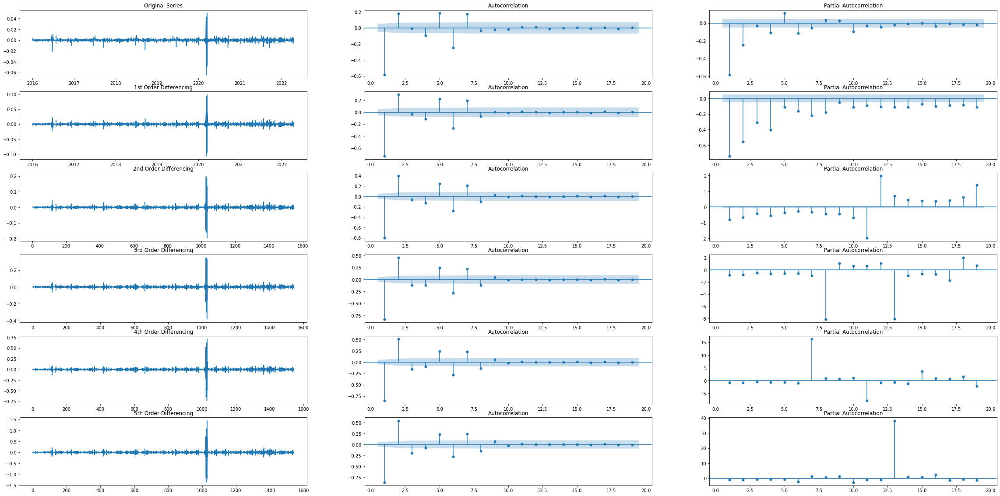

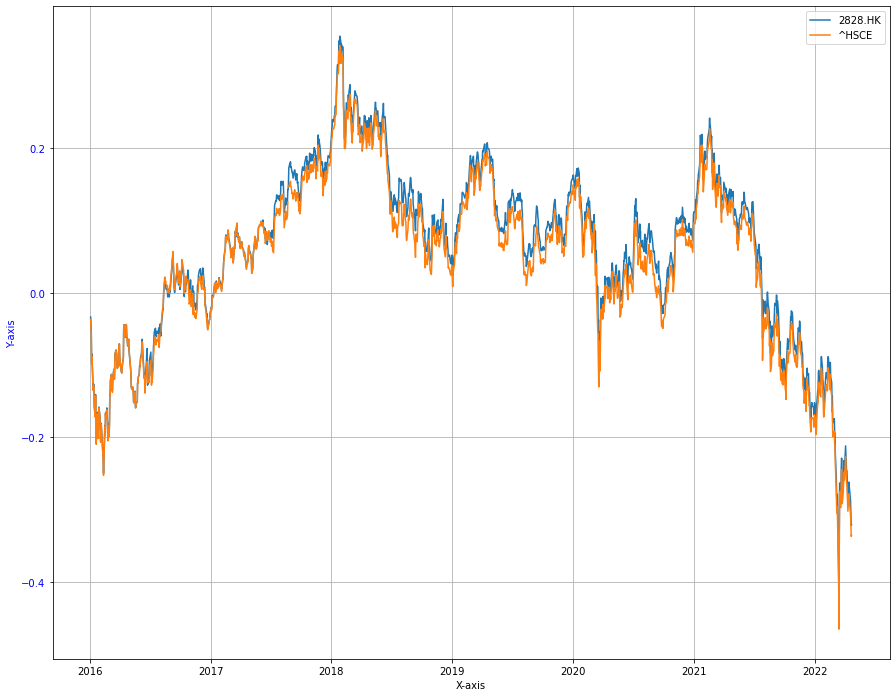

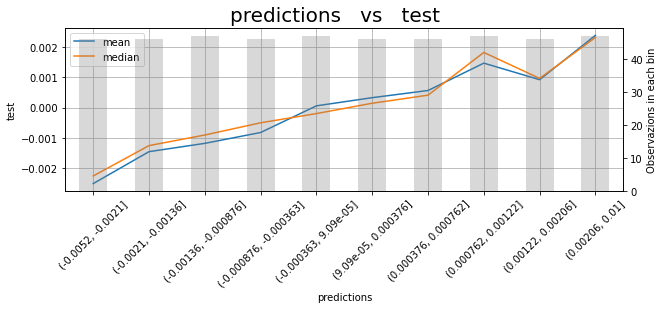

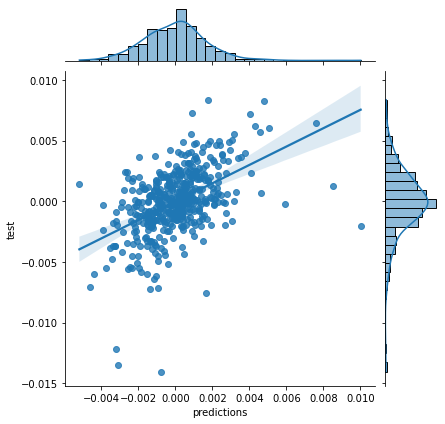

average position: 1.494460631368945


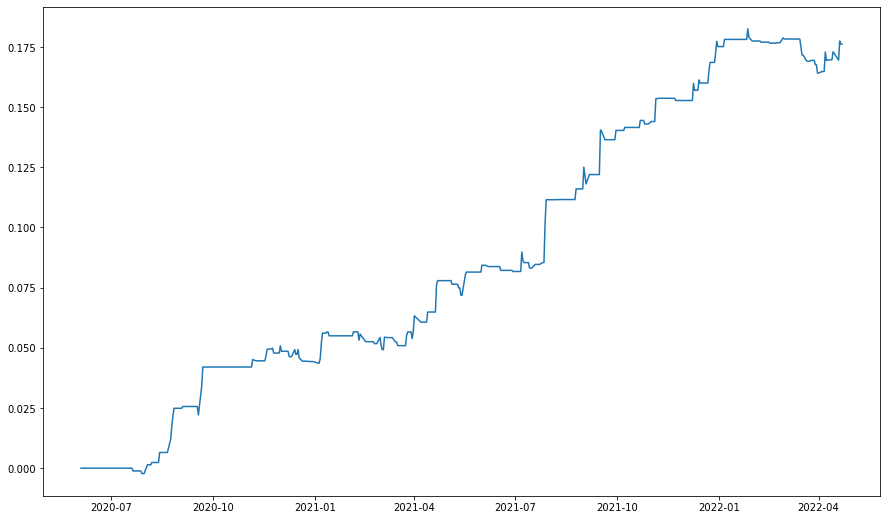

In [134]:
result_original_dic=result_dic.copy()

In [272]:
from statsmodels.graphics.gofplots import qqplot

## Start testing multiple models on this time series

In [ ]:
def resid_analysis(resid,lags=20):
    from scipy.stats import shapiro
    df = resid.dropna()
    fig, axes = plt.subplots(3, 3,figsize=(25,13))
    axes[0, 0].plot(df); axes[0, 0].set_title('Original Series')
    plot_acf(df.dropna().values, ax=axes[0, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.dropna().values, ax=axes[0, 2],zero=False,lags=np.arange(1,lags))
    
    axes[1, 0].plot(df.diff()); axes[1, 0].set_title('1st Order Differencing')
    plot_acf(df.diff().dropna().values, ax=axes[1, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().dropna(), ax=axes[1, 2],zero=False,lags=np.arange(1,lags))

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values); axes[2, 0].set_title('2nd Order Differencing')
    plot_acf(df.diff().diff().dropna().values, ax=axes[2, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().diff().dropna(), ax=axes[2, 2],zero=False,lags=np.arange(1,lags))
    plt.show()
    fig, axes = plt.subplots(1, 2,figsize=(23,7))
    resid.hist(ax=axes[0])
    resid.plot.kde(ax=axes[0])
    qqplot(resid.dropna(),line='s',ax=axes[1])
    resid.plot(ax=axes[2])
    plt.show()
    print('Shapiro-Wilk test result: '+str(shapiro(resid.dropna()).statistic)+' /  '+str(shapiro(resid.dropna()).pvalue))
    

Date
2016-01-04    0.012623
2016-01-05    0.011980
2016-01-06    0.011543
2016-01-07    0.012909
2016-01-08    0.012593
                ...   
2022-04-14    0.017040
2022-04-19    0.020718
2022-04-20    0.015236
2022-04-21    0.015750
2022-04-22    0.015708
Length: 1549, dtype: float64

('3033.HK', '3067.HK')
(1, 1, 1)
CSOP Hang Seng TECH Index ETF
iShares Hang Seng TECH ETF


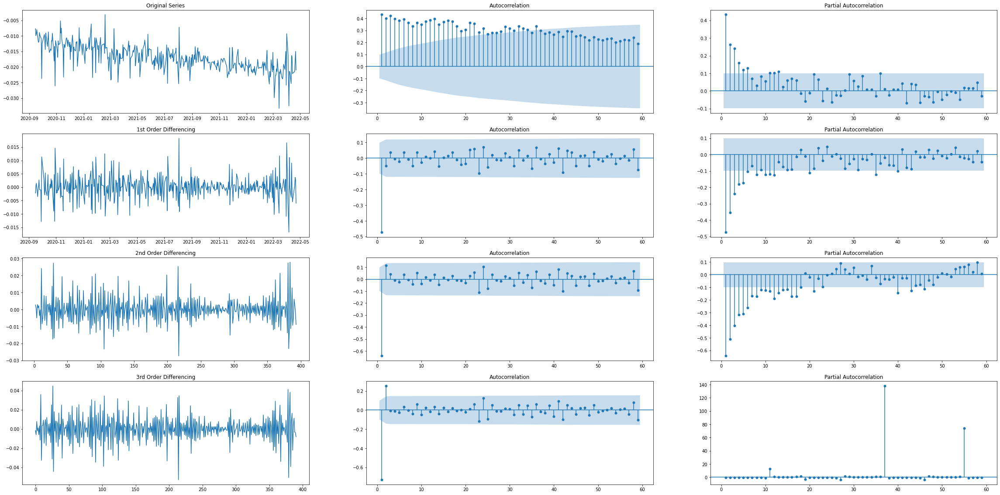

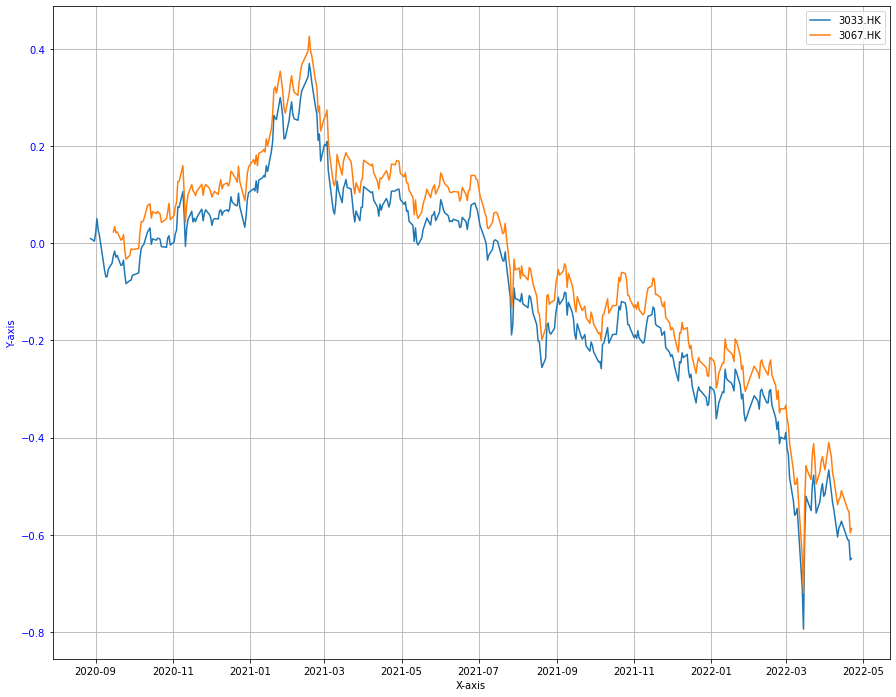

In [420]:
period=30
# for keys in [('2828.HK', '^HSCE'),]:
for keys in [('3033.HK', '3067.HK'),]:    
# for keys in pairs_list:
# for keys in result_dic.keys():
    lags=60
    print(keys)
    print((param_dic[keys][0],param_dic[keys][1]+1,param_dic[keys][2]))
    name1,name2=keys
    print(name_dic[name1])
    print(name_dic[name2])
    temp=log_ret[[name1,name2]]
    # diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna().cumsum()
    diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
    diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
    diff=diff.loc[diff.index.year>2015]
    df = diff.dropna().cumsum()

    fig, axes = plt.subplots(4, 3,figsize=(40,20))
    axes[0, 0].plot(df); axes[0, 0].set_title('Original Series')
    plot_acf(df.dropna().values, ax=axes[0, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.dropna().values, ax=axes[0, 2],zero=False,lags=np.arange(1,lags))
    
    axes[1, 0].plot(df.diff()); axes[1, 0].set_title('1st Order Differencing')
    plot_acf(df.diff().dropna().values, ax=axes[1, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().dropna(), ax=axes[1, 2],zero=False,lags=np.arange(1,lags))

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values); axes[2, 0].set_title('2nd Order Differencing')
    plot_acf(df.diff().diff().dropna().values, ax=axes[2, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().diff().dropna(), ax=axes[2, 2],zero=False,lags=np.arange(1,lags))

    axes[3, 0].plot(df.diff().diff().diff().dropna().values); axes[3, 0].set_title('3rd Order Differencing')
    plot_acf(df.diff().diff().diff().dropna().values, ax=axes[3, 1],zero=False,lags=np.arange(1,lags))
    plot_pacf(df.diff().diff().diff().dropna(), ax=axes[3, 2],zero=False,lags=np.arange(1,lags))

    plt.show()
    # axes[4, 0].plot(df.diff().diff().diff().diff().dropna().values); axes[4, 0].set_title('4th Order Differencing')
    # plot_acf(df.diff().diff().diff().diff().dropna().values, ax=axes[4, 1],zero=False,lags=np.arange(1,lags))
    # plot_pacf(df.diff().diff().diff().diff().dropna(), ax=axes[4, 2],zero=False,lags=np.arange(1,lags))

    # axes[5, 0].plot(df.diff().diff().diff().diff().diff().dropna().values); axes[5, 0].set_title('5th Order Differencing')
    # plot_acf(df.diff().diff().diff().diff().diff().dropna().values, ax=axes[5, 1],zero=False,lags=np.arange(1,lags))
    # plot_pacf(df.diff().diff().diff().diff().diff().dropna(), ax=axes[5, 2],zero=False,lags=np.arange(1,lags))
    
    plot_line(temp.cumsum(),figsize=(15,12))
    

In [483]:
#check for cointegration

In [484]:
from statsmodels.tsa.stattools import coint

In [ ]:
#pvalue for the augmented Engle-Granger two-step cointegration test.
#The Null hypothesis is that there is no cointegration, the alternative hypothesis is that there is cointegrating relationship. If the pvalue is small, below a critical size, then we can reject the hypothesis that there is no cointegrating relationship.

In [487]:
coint(temp.dropna().iloc[:,0],temp.dropna().iloc[:,1])[1]

4.281503678750848e-17

## Examine the selected pair 2828.HK and HSCE

In [414]:
target_result_dic1=target_result_dic.copy()
name1,name2=('2828.HK', '^HSCE')
keys=(name1,name2)

In [421]:
name1,name2=('3033.HK', '3067.HK')
keys=(name1,name2)

In [429]:
target_result_dic={}

In [430]:
target_result_dic.update({param_dic[keys]:result_dic[keys]})

## Model 1: Testing ARIMA (0,0,0)

params: (1, 0, 1)


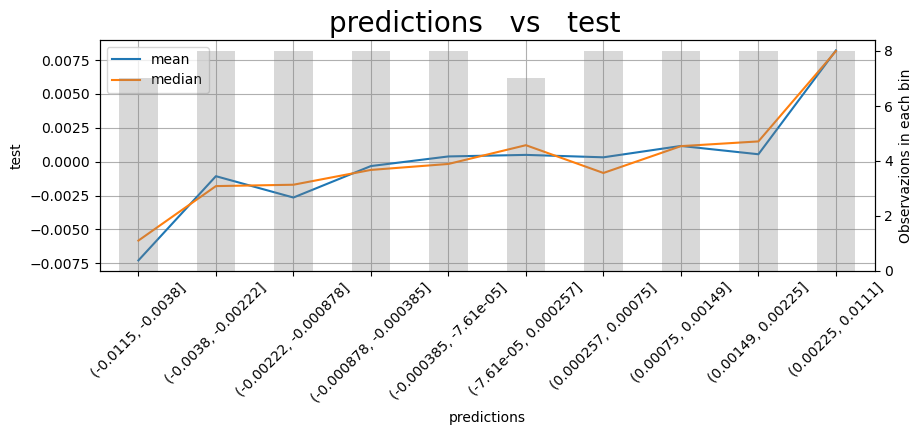

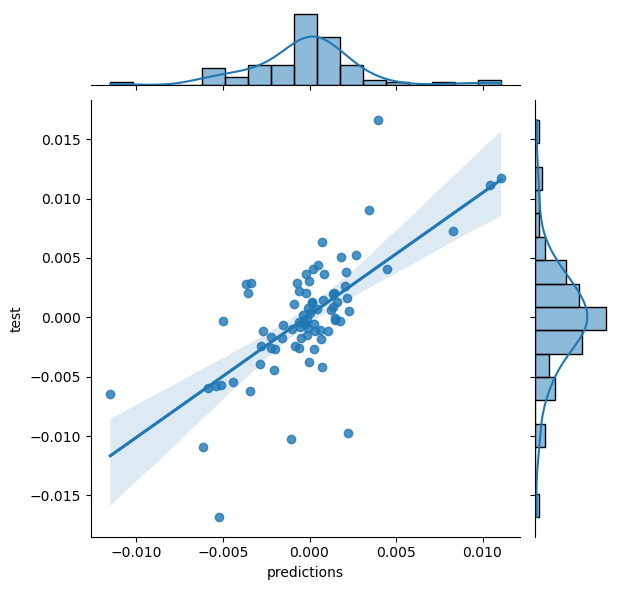

average position: 1.5933891839748675


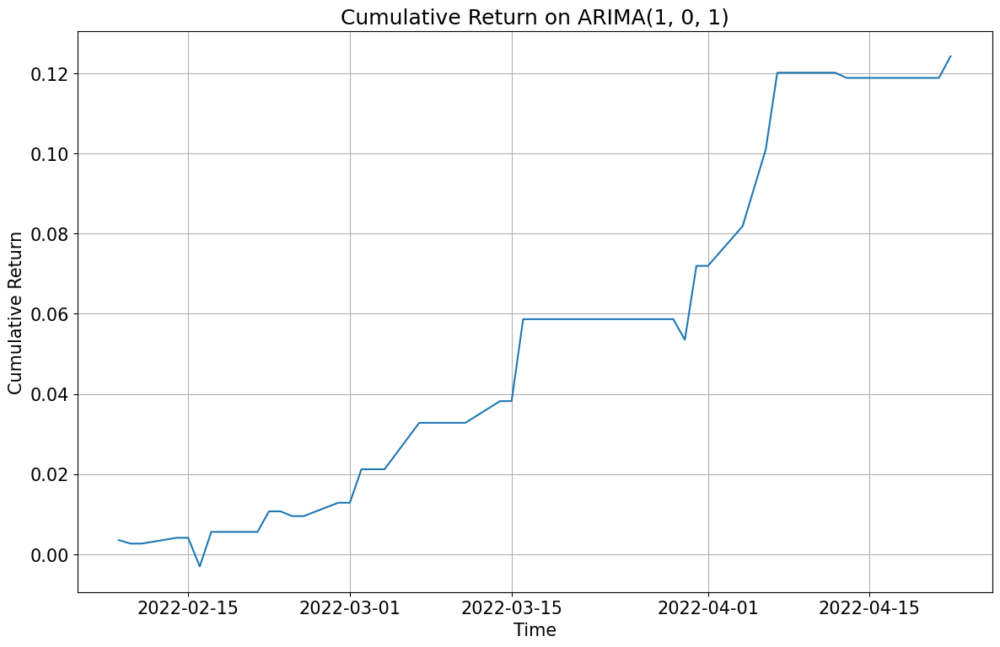

Ljung-Box Test Tatistics


,1,2,3,4,5,6,7,8,9,10
lb_stat,0.046167,0.838371,2.066763,3.489108,4.051014,4.871887,5.742557,6.962711,7.072271,7.251297
lb_pvalue,0.829873,0.657582,0.558666,0.479536,0.542095,0.560347,0.570111,0.540661,0.629595,0.701527


R2 (explained variance): -0.19
Mean Absolute Perc Error (Σ(|y-pred|/y)/n): 1.51
Mean Absolute Error (Σ|y-pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y-pred)^2/n)): 0
Max Error: -0


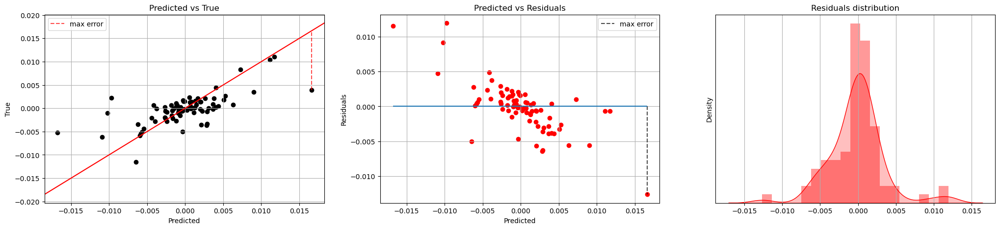

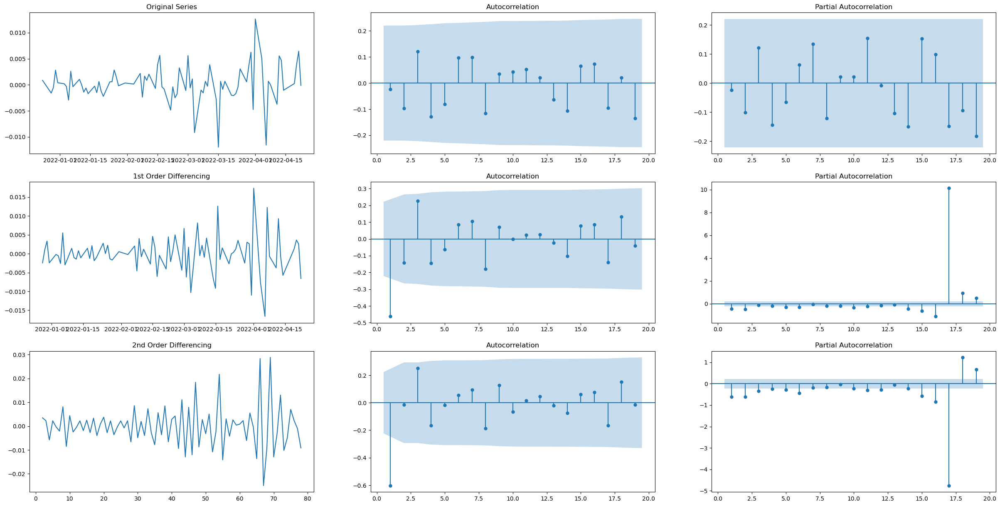

,Parameter
correlation,0.686843
rmse,0.003547
ljung-box test(1)-pvalue,0.829873
Shapiro-Wilk Test pvalue,0.000022
R-squared,0.469956
Annualized Return,0.401236
Sharpe Ratio,3.015780
winrate,0.736842


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  389
Model:                     ARMA(1, 1)   Log Likelihood                1670.624
Method:                       css-mle   S.D. of innovations              0.003
Date:                Tue, 26 Apr 2022   AIC                          -3333.249
Time:                        13:13:47   BIC                          -3317.395
Sample:                             0   HQIC                         -3326.963
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.567e-05   5.03e-06     -5.104      0.000   -3.55e-05   -1.58e-05
ar.L1.y        0.0916      0.054      1.706      0.088      -0.014       0.197
ma.L1.y       -0.9775      0.027    -36.058      0.000      -1.031      -0.924
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           10.9147           +0.0000j           10.9147            0.0000
MA.1            1.0230           +0.0000j            1.0230            0.0000
-----------------------------------------------------------------------------
"""

In [632]:

params=(1,0,1)

diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
diff=diff.loc[diff.index.year>2016].iloc[:-5]
series= diff.dropna().reset_index(drop=True)
X = series.values
size = int(len(X) * 0.7)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
count=0

print('params: '+str(params))
if params not in target_result_dic.keys():
    for t in range(len(test)):
        count+=1
        print("{:2%}".format(count/len(test)))
        model_fit = ARIMA(history,order=params).fit(disp=0)
        yhat = model_fit.forecast()[0]
        predictions.append(yhat[0])
        obs = test[t]
        history.append(obs)
        clear_output(wait=False)
    print(pairs)
    print(params)
    result=pd.DataFrame([predictions,test],index=['predictions','test']).T.dropna()
    result.index=diff.dropna().iloc[size:len(X)].index
    target_result_dic.update({params:result})
else:
    result=target_result_dic[params]
result=target_result_dic[params]
bivariate_plot(result)
series= diff.dropna()
X = series.values
size = int(len(X) * 0.7)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
# result.index=series.iloc[size:len(X)].index
result['position']=(result['predictions']-result['predictions'].rolling(period).mean())/result['predictions'].rolling(period).std()
result['position']=result['position'].apply(lambda x:x if abs(x)>1 else 0)
result['position']=result['position'].apply(lambda x:np.sign(x)*2 if abs(x)>2 else x)
# result['position']/=2
result['profit']=result['position']*result['test']-abs(result['position'])*transcost*5

print('average position: '+str(abs(result['position']).replace(0,np.nan).mean()))
stoploss=-1.5*abs(result['profit'].std())
result['profit']=result['profit'].apply(lambda x:stoploss if x<stoploss else x)
result['resid']=result['predictions']-result['test']
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(20*0.7,20*0.618*0.7))
plt.title('Cumulative Return on ARIMA'+str(params))
plt.xlabel('Time')
plt.ylabel('Cumulative Return')
plt.grid()
plt.plot(result['profit'].cumsum().replace(0,np.nan).dropna())
plt.show()
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
print('Ljung-Box Test Tatistics')
resid=result['test']-result['predictions']
pd.options.display.max_columns=None
display(acorr_ljungbox(resid,10,return_df=True).T)
evaluate_regr_model(result.iloc[:,0], result.iloc[:,1], figsize=(25,5))
resid_analysis(resid)
from sklearn.metrics import r2_score
corr=result.corr().iloc[0,1]
rmse=sqrt(mean_squared_error(result.iloc[:,0],result.iloc[:,1]))
def r_squared(y, y_hat):
    y_bar = y.mean()
    ss_tot = ((y-y_bar)**2).sum()
    ss_res = ((y-y_hat)**2).sum()
    return 1 - (ss_res/ss_tot)
r2=r_squared(result.iloc[:,1],result.iloc[:,0])
annual_profit=result['profit'].cumsum().iloc[-1]/len(result)*255
sharpe=annual_profit/result['profit'].replace(0,np.nan).dropna().std()/(255**0.5)
ljung_1=acorr_ljungbox(resid,1,return_df=True).T.iloc[1,0]
winrate=result['profit'].replace(0,np.nan).dropna().apply(lambda x:1 if x>0 else 0).mean()
shapiro_p=shapiro(resid.dropna()).pvalue
display(pd.DataFrame([corr,rmse,ljung_1,shapiro_p,r2,annual_profit,sharpe,winrate],index=['correlation','rmse','ljung-box test(1)-pvalue','Shapiro-Wilk Test pvalue','R-squared','Annualized Return','Sharpe Ratio','winrate'],columns=['Parameter']))
model_fit = ARIMA(X,order=params).fit(disp=0)
model_fit.summary()



In [622]:
diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)].cumsum()
final_test=diff.loc[diff.index.year>2016].iloc[-5:]


In [618]:
X=pd.Series(X).cumsum().values

In [619]:
model_fit = ARIMA(X,order=(1,1,1)).fit(disp=0)
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  388
Model:                 ARIMA(1, 1, 1)   Log Likelihood                1671.783
Method:                       css-mle   S.D. of innovations              0.003
Date:                Tue, 26 Apr 2022   AIC                          -3335.567
Time:                        13:00:53   BIC                          -3319.723
Sample:                             1   HQIC                         -3329.285
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.495e-05   5.72e-06     -4.363      0.000   -3.62e-05   -1.37e-05
ar.L1.D.y      0.0661      0.055      1.193      0.233      -0.042       0.175
ma.L1.D.y     -0.9715      0.047    -20.687      0.000      -1.064      -0.879
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           15.1173           +0.0000j           15.1173            0.0000
MA.1            1.0294           +0.0000j            1.0294            0.0000
-----------------------------------------------------------------------------
"""

In [ ]:
model_fit = ARIMA(X,order=params).fit(disp=0)
model_fit.summary()

In [625]:
predictions=model_fit.forecast(5)[0]

In [624]:
pd.DataFrame([model_fit.forecast(5)[0],final_test]).T

,0,1
0,-0.021159,-0.022131
1,-0.021479,-0.021429
2,-0.021524,-0.017782
3,-0.021550,-0.014961
4,-0.021575,-0.020946


('3033.HK', '3067.HK')


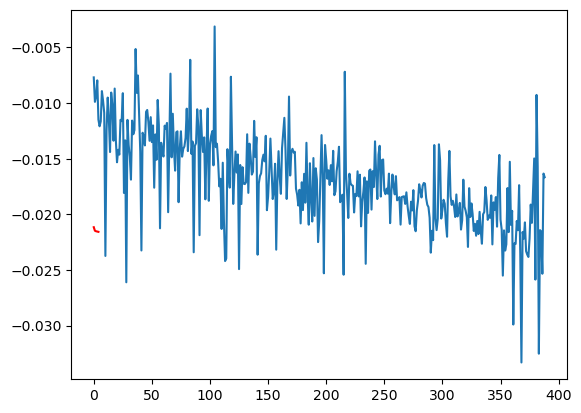

In [629]:
# for t in range(len(test)):
#     count+=1
#     print("{:2%}".format(count/len(test)))
#     model_fit = ARIMA(history,order=params).fit(disp=0)
#     yhat = model_fit.forecast()[0]
#     predictions.append(yhat[0])
#     obs = test[t]
#     history.append(obs)
#     clear_output(wait=False)
# evaluate forecasts
# rmse = sqrt(mean_squared_error(test, predictions))
# print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
print(pairs)
pyplot.plot(X)
pyplot.plot(predictions, color='red')
pyplot.show() 

1.1246269423281774e-05

In [562]:
pd.DataFrame([corr,rmse],index=['correlation','rmse'],columns=['Parameter'])

,Parameter
correlation,-0.612347
rmse,0.004280


In [540]:
import ml_utils

-0.3686985688413836

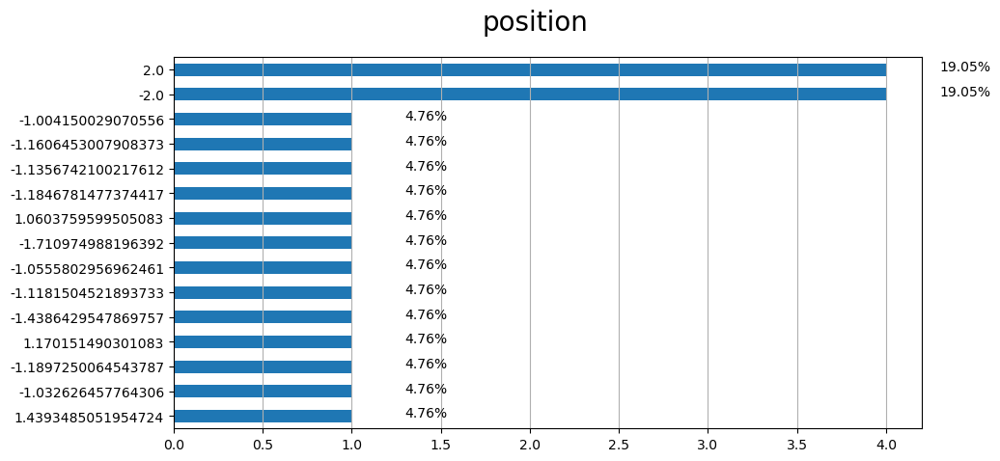

In [548]:
freqdist_plot(result[['position']].replace(0,np.nan).dropna(),'position')

## Model 2: Using Parameter ARIMA (3,0,1)

params: (3, 0, 1)


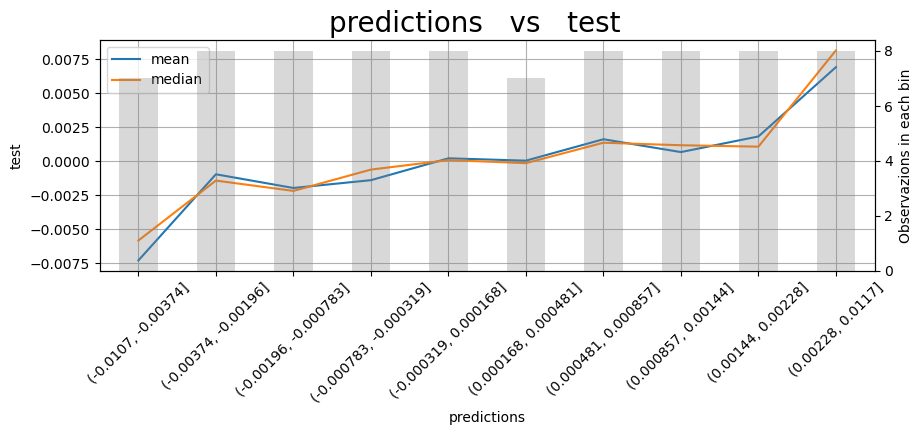

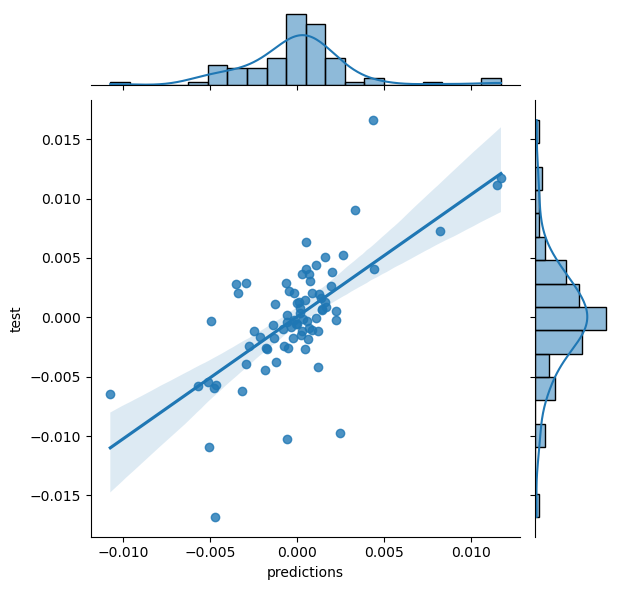

average position: 1.1207738036298873


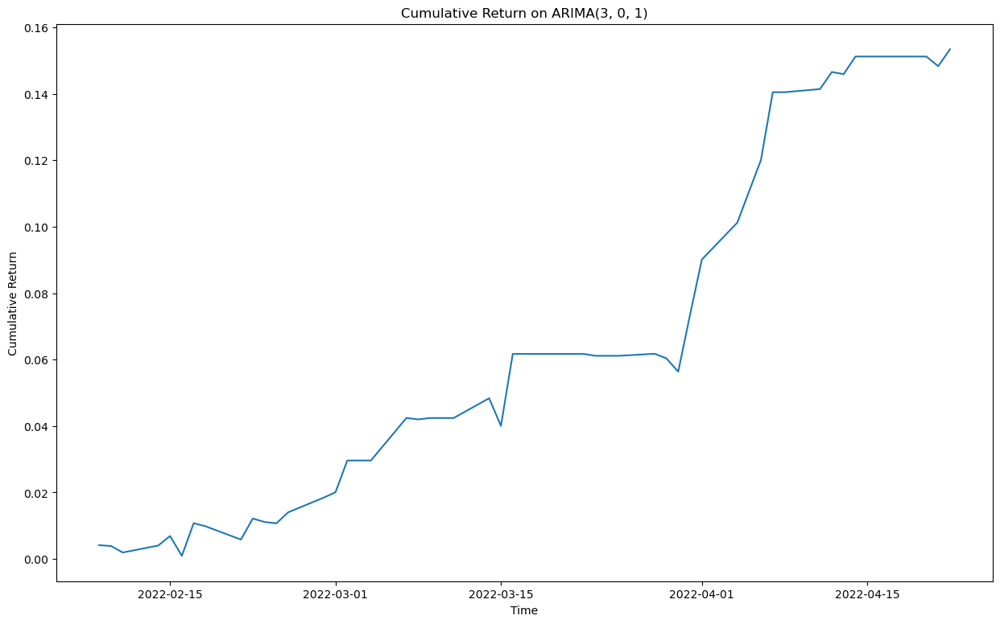

Ljung-Box Test Tatistics


,1,2,3,4,5,6,7,8,9,10
lb_stat,0.108451,1.096536,1.431417,2.787212,3.632203,4.563412,5.617530,6.490622,6.582479,6.688253
lb_pvalue,0.741914,0.577950,0.698187,0.594042,0.603485,0.600896,0.585048,0.592448,0.680499,0.754511


R2 (explained variance): -0.23
Mean Absolute Perc Error (Σ(|y-pred|/y)/n): 1.48
Mean Absolute Error (Σ|y-pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y-pred)^2/n)): 0
Max Error: -0


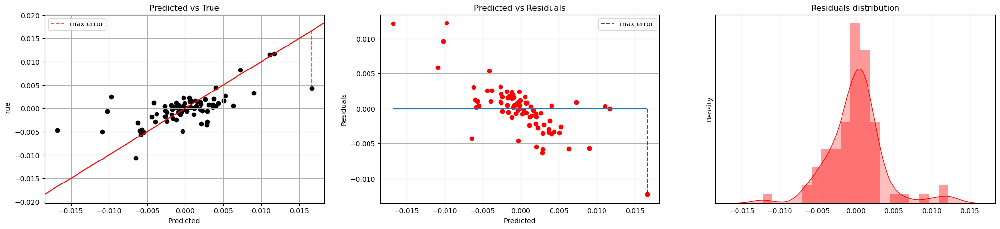

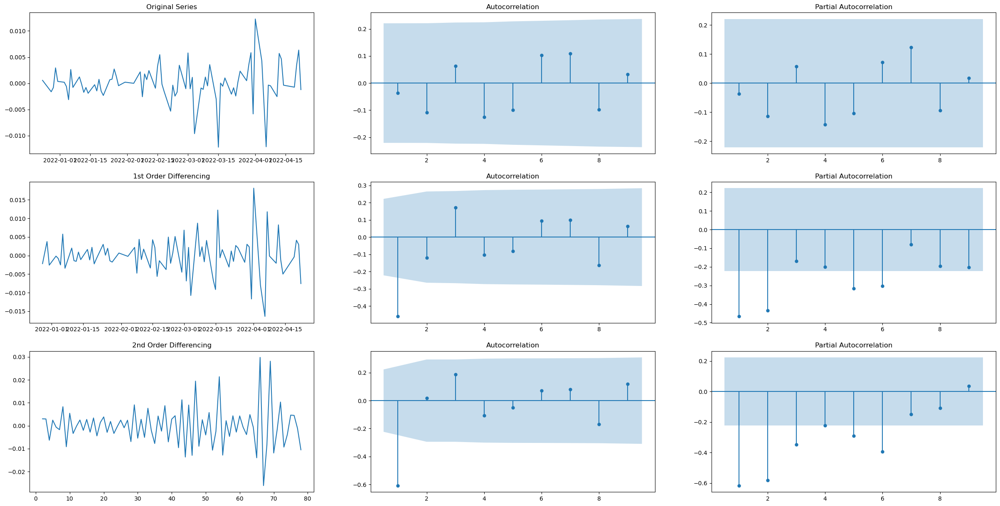

corr:0.6810470769100919
rmse: 0.0035690763711852705


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  394
Model:                     ARMA(3, 1)   Log Likelihood                1691.695
Method:                       css-mle   S.D. of innovations              0.003
Date:                Tue, 26 Apr 2022   AIC                          -3371.390
Time:                        11:27:31   BIC                          -3347.532
Sample:                             0   HQIC                         -3361.937
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -2.44e-05   3.51e-06     -6.961      0.000   -3.13e-05   -1.75e-05
ar.L1.y        0.0691      0.052      1.316      0.188      -0.034       0.172
ar.L2.y        0.0376      0.053      0.715      0.475      -0.066       0.141
ar.L3.y        0.1351      0.053      2.548      0.011       0.031       0.239
ma.L1.y       -0.9890      0.024    -41.164      0.000      -1.036      -0.942
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.7771           -0.0000j            1.7771           -0.0000
AR.2           -1.0278           -1.7628j            2.0406           -0.3340
AR.3           -1.0278           +1.7628j            2.0406            0.3340
MA.1            1.0111           +0.0000j            1.0111            0.0000
-----------------------------------------------------------------------------
"""

In [550]:
# we choose ARIMA(3,0,1) because it seems that approdximately PACF cuts off at 3 and ACF cuts off at 1
params=(3,0,1)
pairs=(name1,name2)
diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
diff=diff.loc[diff.index.year>2017]
series= diff.dropna().reset_index(drop=True)
X = series.values
size = int(len(X) * 0.8)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
count=0

print('params: '+str(params))
if params not in target_result_dic.keys():
    for t in range(len(test)):
        count+=1
        print("{:2%}".format(count/len(test)))
        model_fit = ARIMA(history,order=params).fit(disp=0)
        yhat = model_fit.forecast()[0]
        predictions.append(yhat[0])
        obs = test[t]
        history.append(obs)
        clear_output(wait=True)
    print(pairs)
    print(params)
    result=pd.DataFrame([predictions,test],index=['predictions','test']).T.dropna()
    result.index=diff.dropna().iloc[size:len(X)].index
    target_result_dic.update({params:result})
else:
    result=target_result_dic[params]
result=target_result_dic[params]
bivariate_plot(result)
series= diff.dropna()
X = series.values
size = int(len(X) * 0.8)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
result.index=series.iloc[size:len(X)].index
result['position']=(result['predictions']-result['predictions'].rolling(period).mean())/result['predictions'].rolling(period).std()
result['position']=result['position'].apply(lambda x:x if abs(x)>0.3 else 0)
result['position']=result['position'].apply(lambda x:np.sign(x)*2 if abs(x)>2 else x)
# result['position']/=2
result['profit']=result['position']*result['test']-abs(result['position'])*transcost*3

print('average position: '+str(abs(result['position']).replace(0,np.nan).mean()))
stoploss=-1.5*abs(result['profit'].std())
result['profit']=result['profit'].apply(lambda x:stoploss if x<stoploss else x)
result['resid']=result['predictions']-result['test']
plt.title('Cumulative Return on ARIMA'+str(params))
plt.xlabel('Time')
plt.ylabel('Cumulative Return')
# plt.plot(result['profit'].loc[(result.index.month!=7)&(result.index.month!=9)].cumsum().replace(0,np.nan).dropna())
plt.plot(result['profit'].cumsum().replace(0,np.nan).dropna())
plt.show()
print('Ljung-Box Test Tatistics')
resid=result['test']-result['predictions']
pd.options.display.max_columns=None
display(acorr_ljungbox(resid.iloc[:],10,return_df=True).T)
evaluate_regr_model(result.iloc[:,0], result.iloc[:,1], figsize=(25,5))
resid_analysis(resid.iloc[:],lags=10)
print('corr:'+str(result.corr().iloc[0,1]))
print('rmse: '+str(sqrt(mean_squared_error(result.iloc[:,0],result.iloc[:,1]))))
model_fit = ARIMA(X,order=params).fit(disp=0)
model_fit.summary()

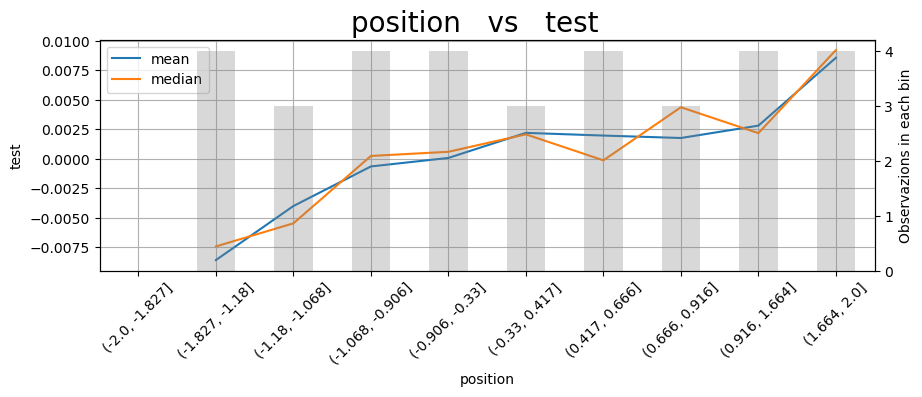

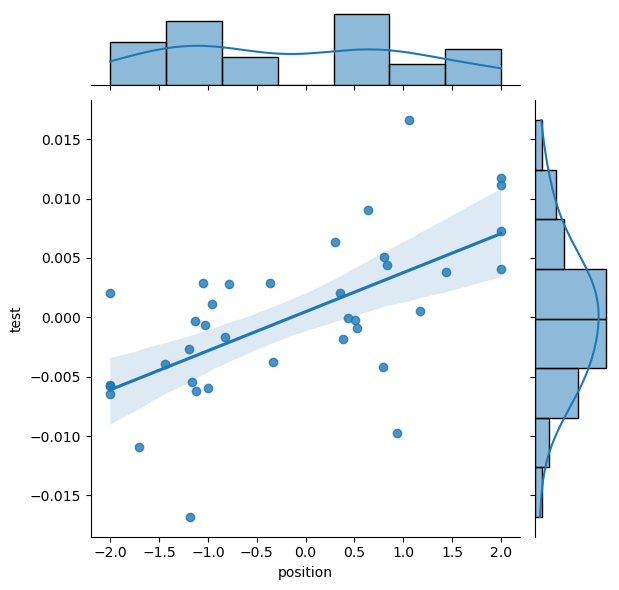

In [554]:
bivariate_plot(result[['position','test']].replace(0,np.nan).dropna())

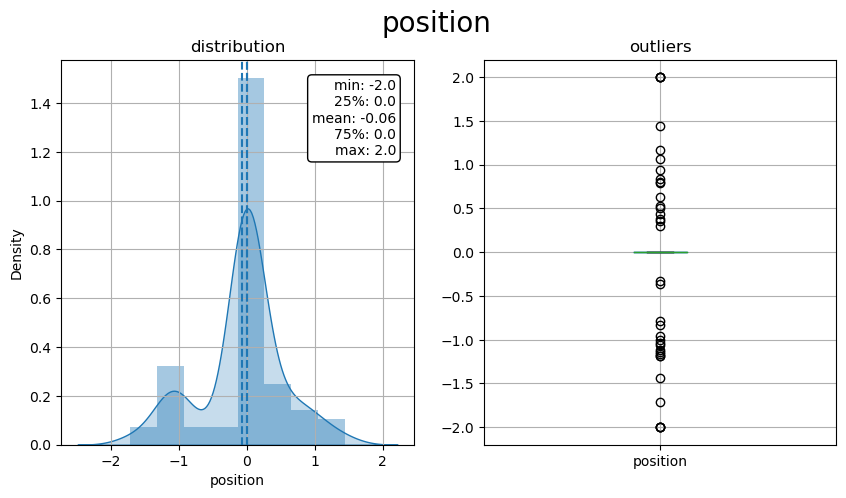

In [552]:
freqdist_plot(result[['position']],'position')

In [443]:
from scipy.stats import shapiro

In [444]:
shapiro(resid.dropna())

ShapiroResult(statistic=0.9048134684562683, pvalue=2.1840120098204352e-05)

In [ ]:
X

In [451]:
model_fit = ARIMA(X[:int(len(X)*3/4)],order=params).fit(disp=0)
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  295
Model:                     ARMA(1, 1)   Log Likelihood                1268.582
Method:                       css-mle   S.D. of innovations              0.003
Date:                Tue, 26 Apr 2022   AIC                          -2529.165
Time:                        08:53:24   BIC                          -2514.417
Sample:                             0   HQIC                         -2523.259
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.559e-05   2.37e-06    -10.807      0.000   -3.02e-05   -2.09e-05
ar.L1.y        0.0663      0.060      1.113      0.266      -0.050       0.183
ma.L1.y       -0.9999      0.016    -61.329      0.000      -1.032      -0.968
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           15.0911           +0.0000j           15.0911            0.0000
MA.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

## Tried parameter (1,0,3) indicated MA not invertible

params: (3, 0, 1)


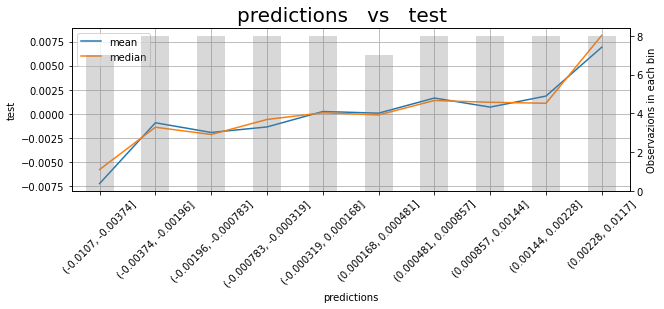

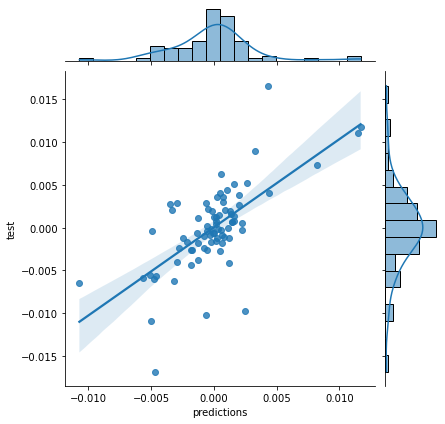

average position: 1.5095582761026347


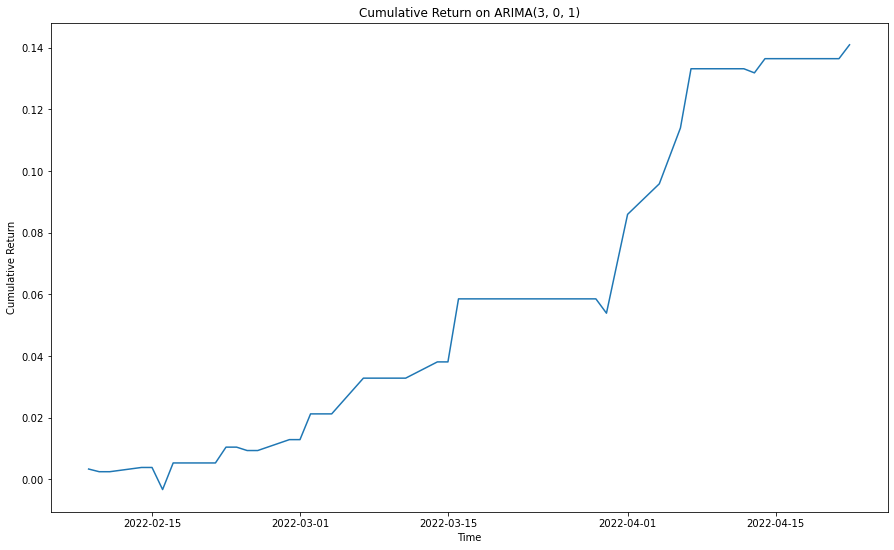

Ljung-Box Test Tatistics


,1,2,3,4,5,6,7,8,9,10
lb_stat,0.108451,1.096536,1.431417,2.787212,3.632203,4.563412,5.617530,6.490622,6.582479,6.688253
lb_pvalue,0.741914,0.577950,0.698187,0.594042,0.603485,0.600896,0.585048,0.592448,0.680499,0.754511


R2 (explained variance): -0.23
Mean Absolute Perc Error (Σ(|y-pred|/y)/n): 1.48
Mean Absolute Error (Σ|y-pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y-pred)^2/n)): 0
Max Error: -0


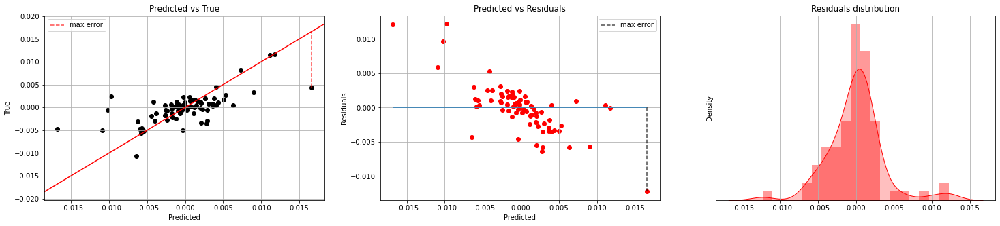

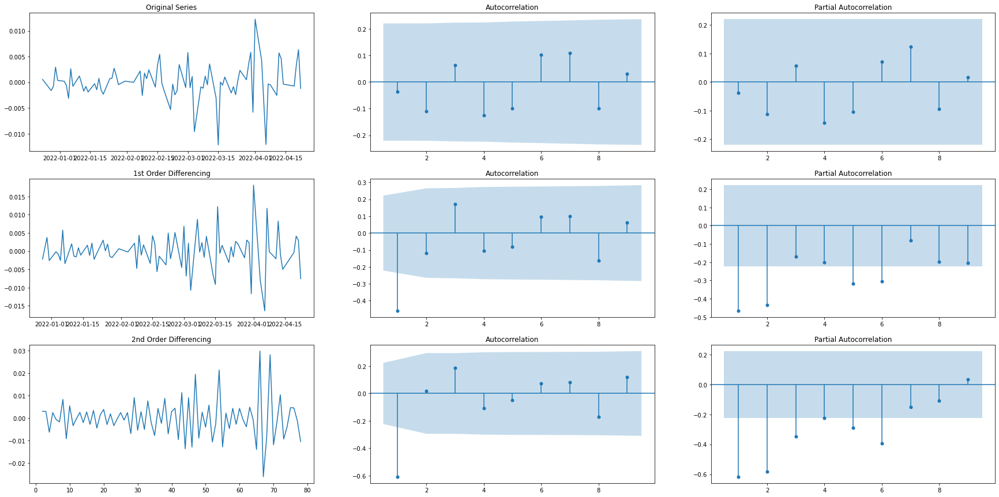

corr:0.6810470769100919
rmse: 0.0035690763711852705


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  394
Model:                     ARMA(3, 1)   Log Likelihood                1691.695
Method:                       css-mle   S.D. of innovations              0.003
Date:                Tue, 26 Apr 2022   AIC                          -3371.390
Time:                        09:26:28   BIC                          -3347.532
Sample:                             0   HQIC                         -3361.937
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -2.44e-05   3.51e-06     -6.961      0.000   -3.13e-05   -1.75e-05
ar.L1.y        0.0691      0.052      1.316      0.188      -0.034       0.172
ar.L2.y        0.0376      0.053      0.715      0.475      -0.066       0.141
ar.L3.y        0.1351      0.053      2.548      0.011       0.031       0.239
ma.L1.y       -0.9890      0.024    -41.164      0.000      -1.036      -0.942
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.7771           -0.0000j            1.7771           -0.0000
AR.2           -1.0278           -1.7628j            2.0406           -0.3340
AR.3           -1.0278           +1.7628j            2.0406            0.3340
MA.1            1.0111           +0.0000j            1.0111            0.0000
-----------------------------------------------------------------------------
"""

In [465]:
# we choose ARIMA(3,0,1) because it seems that approdximately PACF cuts off at 3 and ACF cuts off at 1
params=(3,0,1)


diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
diff=diff.loc[diff.index.year>2017]
series= diff.dropna().reset_index(drop=True)
X = series.values
size = int(len(X) * 0.8)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
count=0

print('params: '+str(params))
if params not in target_result_dic.keys():
    for t in range(len(test)):
        count+=1
        print("{:2%}".format(count/len(test)))
        model_fit = ARIMA(history,order=params).fit(disp=0)
        yhat = model_fit.forecast()[0] 
        predictions.append(yhat[0])
        obs = test[t]
        history.append(obs)
        history.pop(9)
        clear_output(wait=False)
    print(pairs)
    print(params)
    result=pd.DataFrame([predictions,test],index=['predictions','test']).T.dropna()
    result.index=diff.dropna().iloc[size:len(X)].index
    target_result_dic.update({params:result})
else:
    result=target_result_dic[params]
result=target_result_dic[params]
bivariate_plot(result)
series= diff.dropna()
X = series.values
size = int(len(X) * 0.8)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
result.index=series.iloc[size:len(X)].index
result['position']=(result['predictions']-result['predictions'].rolling(period).mean())/result['predictions'].rolling(period).std()
result['position']=result['position'].apply(lambda x:x if abs(x)>1 else 0)
result['position']=result['position'].apply(lambda x:np.sign(x)*2 if abs(x)>2 else x)
# result['position']/=2
result['profit']=result['position']*result['test']-abs(result['position'])*transcost*5

print('average position: '+str(abs(result['position']).replace(0,np.nan).mean()))
stoploss=-1.5*abs(result['profit'].std())
result['profit']=result['profit'].apply(lambda x:stoploss if x<stoploss else x)
result['resid']=result['predictions']-result['test']
plt.title('Cumulative Return on ARIMA'+str(params))
plt.xlabel('Time')
plt.ylabel('Cumulative Return')
# plt.plot(result['profit'].loc[(result.index.month!=7)&(result.index.month!=9)].cumsum().replace(0,np.nan).dropna())
plt.plot(result['profit'].cumsum().replace(0,np.nan).dropna())
plt.show()
print('Ljung-Box Test Tatistics')
resid=result['test']-result['predictions']
pd.options.display.max_columns=None
display(acorr_ljungbox(resid.iloc[:],10,return_df=True).T)
evaluate_regr_model(result.iloc[:,0], result.iloc[:,1], figsize=(25,5))
resid_analysis(resid.iloc[:],lags=20)
print('corr:'+str(result.corr().iloc[0,1]))
print('rmse: '+str(sqrt(mean_squared_error(result.iloc[:,0],result.iloc[:,1]))))
model_fit = ARIMA(X,order=params).fit(disp=0)
model_fit.summary()
shapiro(resid.dropna())


In [480]:
shapiro(np.random.normal(0,1,100))

ShapiroResult(statistic=0.9886459708213806, pvalue=0.5569856762886047)

ShapiroResult(statistic=0.8992505073547363, pvalue=1.2686214176937938e-05)

ShapiroResult(statistic=0.8992505073547363, pvalue=1.2686187801591586e-05)

In [461]:
corr_dic={}
rmse_dic={}

('3033.HK', '3067.HK')
(1, 0, 2)


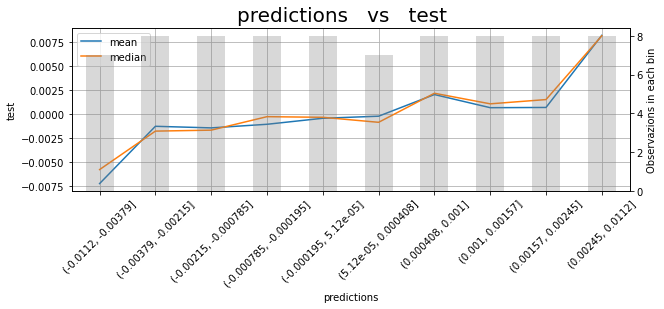

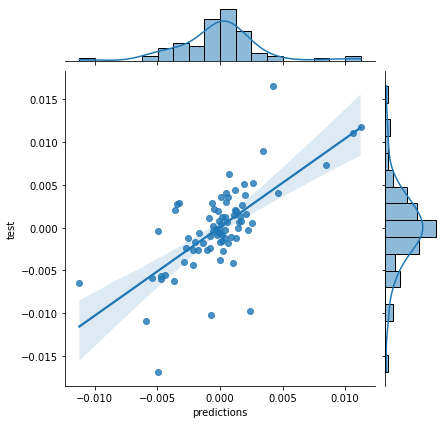

params: (1, 0, 1)


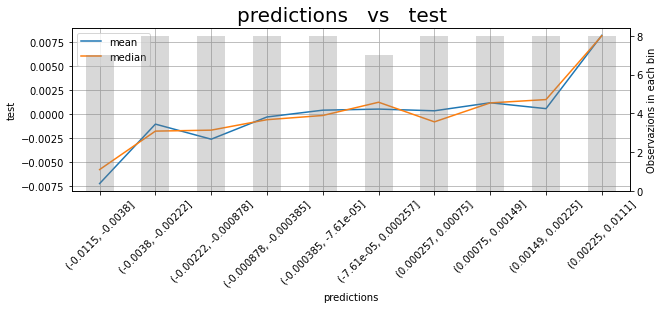

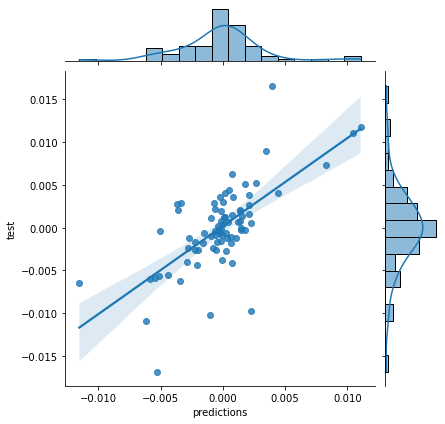

In [462]:
for i in range(4,0,-1):
    for j in range(4,0,-1):
        try:
            params=(i,0,j)
            diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
            diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
            diff=diff.loc[diff.index.year>2017]
            series= diff.dropna().reset_index(drop=True)
            X = series.values
            size = int(len(X) * 0.8)
            if size<100:
                size = int(len(X) * 0.5)
            train, test = X[0:size], X[size:len(X)]
            history = [x for x in train]
            predictions = list()
            # walk-forward validation
            count=0

            print('params: '+str(params))
            if params not in target_result_dic.keys():
                for t in range(len(test)):
                    count+=1
                    print("{:2%}".format(count/len(test)))
                    model_fit = ARIMA(history,order=params).fit(disp=0)
                    yhat = model_fit.forecast()[0]
                    predictions.append(yhat[0])
                    obs = test[t]
                    history.append(obs)
                    history.pop(9)
                    clear_output(wait=False)
                print(pairs)
                print(params)
                result=pd.DataFrame([predictions,test],index=['predictions','test']).T.dropna()
                result.index=diff.dropna().iloc[size:len(X)].index
                target_result_dic.update({params:result})
            else:
                result=target_result_dic[params]
            result=target_result_dic[params]
            bivariate_plot(result)
            series= diff.dropna()
            X = series.values
            size = int(len(X) * 0.8)
            if size<100:
                size = int(len(X) * 0.5)
            train, test = X[0:size], X[size:len(X)]
            result.index=series.iloc[size:len(X)].index
            result['position']=(result['predictions']-result['predictions'].rolling(period).mean())/result['predictions'].rolling(period).std()
            result['position']=result['position'].apply(lambda x:x if abs(x)>1 else 0)
            result['position']=result['position'].apply(lambda x:np.sign(x)*2 if abs(x)>2 else x)
            # result['position']/=2
            result['profit']=result['position']*result['test']-abs(result['position'])*transcost*5
            corr_dic.update({(i,j):result.corr().iloc[0,1]})
            rmse_dic.update({(i,j):sqrt(mean_squared_error(result.iloc[:,0],result.iloc[:,1]))})
        except:
            pass

In [471]:
corr_dic[(4,1)]

0.6601117855885984

In [472]:
pd.DataFrame(rmse_dic,index=[0]).T

0
4 3  0.003709
  2  0.003614
  1  0.003660
3 3  0.003631
  2  0.003558
  1  0.003569
2 2  0.003568
  1  0.003621
1 2  0.003552
  1  0.003547

'3033.HK'

In [591]:
diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[(diff.index.year>2017)&(diff.index.date<pd.to_datetime('2023-07-01',format="%Y-%m-%d"))]

diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
df = diff.dropna()
model_1 = pm.auto_arima(df.dropna(), start_p=10, start_q=10,
                    test='adf',       # use adftest to find optimal 'd'
                    max_p=600, max_q=600, # maximum p and q
                    m=1,              # frequency of series
                    d=None,           # let model determine 'd'
                    seasonal=False,   # No Seasonality
                    trace=True,
                    information_criterion='aic',
                    error_action='ignore',  
                    suppress_warnings=True, 
                    stepwise=False)
model_1.get_params()['order']
model_1.summary()

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-3148.940, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-3342.737, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-3361.306, Time=0.17 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-3358.190, Time=0.14 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-3363.946, Time=0.28 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-3362.835, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-3244.606, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-3368.048, Time=0.28 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-3356.582, Time=0.16 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-3355.375, Time=0.17 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-3358.003, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-3293.917, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-3338.859, Time=0.13 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-3353.276, Time=0.19 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-3355.028, Time=0.35

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  394
Model:               SARIMAX(1, 0, 1)   Log Likelihood                1687.024
Date:                Tue, 26 Apr 2022   AIC                          -3368.048
Time:                        12:33:31   BIC                          -3356.119
Sample:                             0   HQIC                         -3363.321
                                - 394                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0460      0.060      0.769      0.442      -0.071       0.163
ma.L1         -0.9346      0.022    -41.871      0.000      -0.978      -0.891
sigma2      1.109e-05   4.84e-07     22.900      0.000    1.01e-05     1.2e-05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               189.91
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.60   Skew:                            -0.51
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Model 3: Testing ARIMA(0,0,1) chosen by AIC criteria

params: (0, 0, 1)


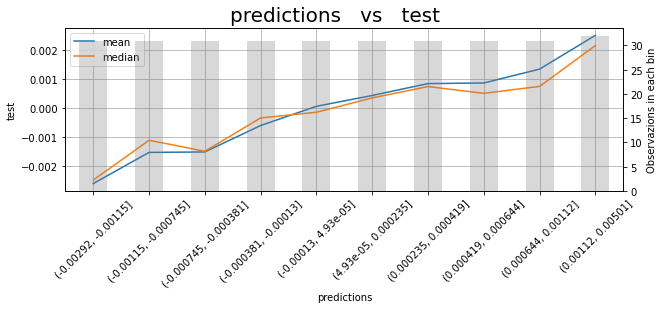

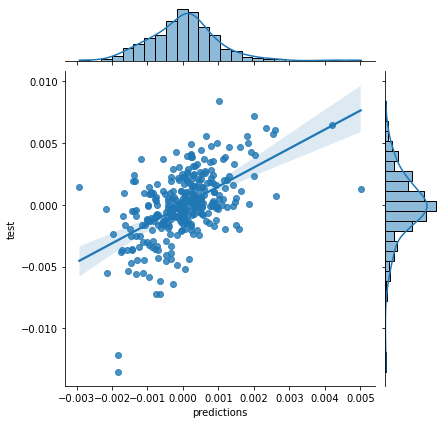

average position: 1.4917458108292587


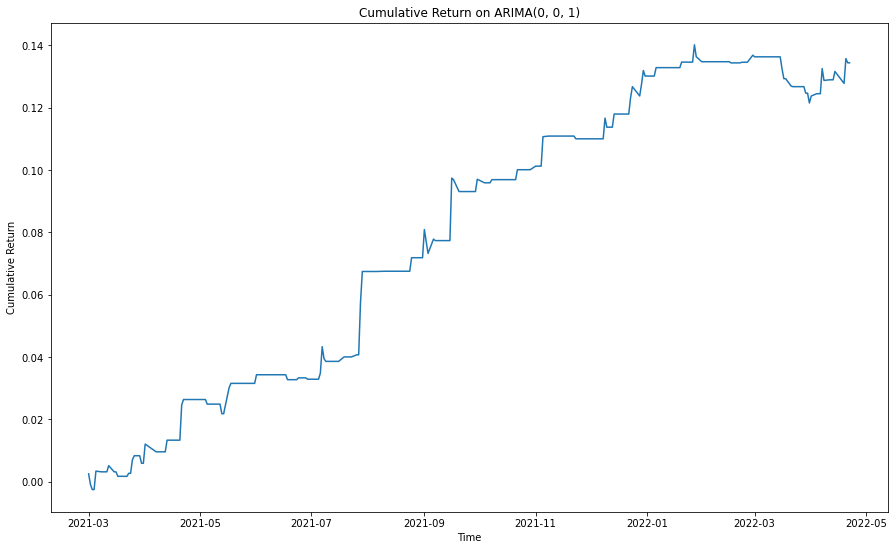

Ljung-Box Test Tatistics


,1,2,3,4,5
lb_stat,8.197284,9.155285,11.466857,11.673458,13.076221
lb_pvalue,0.004195,0.010279,0.009452,0.019952,0.022675


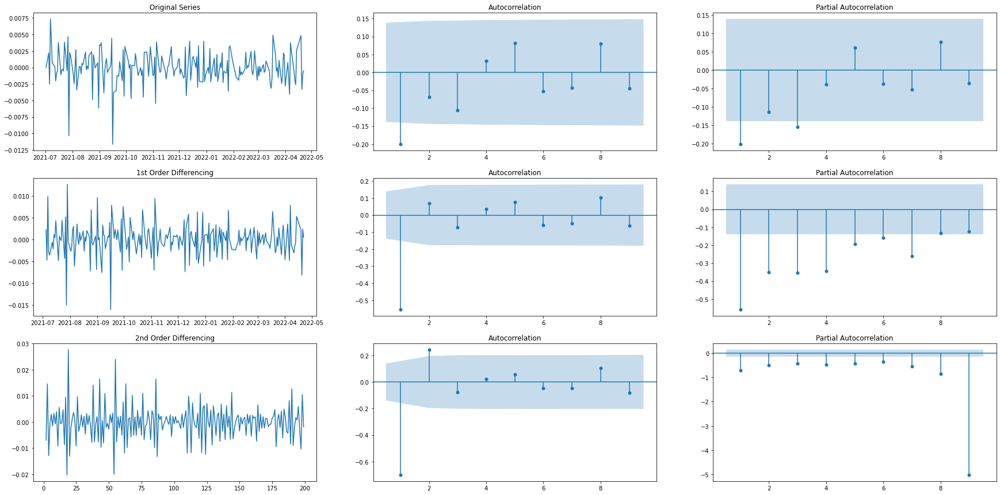

corr:0.5425009824479394
rmse: 0.0023272461535120957


In [349]:

params=(0,0,1)

diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[diff.index.year>2017]
diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
df = diff.dropna()
model_1 = pm.auto_arima(df.dropna(), start_p=0, start_q=0,
                    test='adf',       # use adftest to find optimal 'd'
                    max_p=60, max_q=60, # maximum p and q
                    m=1,              # frequency of series
                    d=None,           # let model determine 'd'
                    seasonal=False,   # No Seasonality
                    trace=False,
                    information_criterion='aic',
                    error_action='ignore',  
                    suppress_warnings=True, 
                    stepwise=False)
# print(model.summary())
params=model_1.get_params()['order']


diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[diff.index.year>2017]
diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
series= diff.dropna().reset_index(drop=True)
X = series.values
size = int(len(X) * 0.7)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
count=0

print('params: '+str(params))
if params not in target_result_dic.keys():
    for t in range(len(test)):
        count+=1
        print("{:2%}".format(count/len(test)))
        model_fit = ARIMA(history,order=params).fit(disp=0)
        yhat = model_fit.forecast()[0]
        predictions.append(yhat[0])
        obs = test[t]
        history.append(obs)
        clear_output(wait=False)
    print(pairs)
    print(params)
    result=pd.DataFrame([predictions,test],index=['predictions','test']).T.dropna()
    result.index=diff.dropna().iloc[size:len(X)].index
    target_result_dic.update({params:result})
else:
    result=target_result_dic[params]
result=target_result_dic[params]
bivariate_plot(result)
series= diff.dropna()
X = series.values
size = int(len(X) * 0.7)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
result.index=series.iloc[size:len(X)].index
result['position']=(result['predictions']-result['predictions'].rolling(period).mean())/result['predictions'].rolling(period).std()
result['position']=result['position'].apply(lambda x:x if abs(x)>1 else 0)
result['position']=result['position'].apply(lambda x:np.sign(x)*2 if abs(x)>2 else x)
# result['position']/=2
result['profit']=result['position']*result['test']-abs(result['position'])*transcost*5

print('average position: '+str(abs(result['position']).replace(0,np.nan).mean()))
stoploss=-1.5*abs(result['profit'].std())
result['profit']=result['profit'].apply(lambda x:stoploss if x<stoploss else x)
result['resid']=result['predictions']-result['test']
plt.title('Cumulative Return on ARIMA'+str(params))
plt.xlabel('Time')
plt.ylabel('Cumulative Return')
plt.plot(result['profit'].cumsum().replace(0,np.nan).dropna())
plt.show()
print('Ljung-Box Test Tatistics')
resid=result['test']-result['predictions']
pd.options.display.max_columns=None
display(acorr_ljungbox(resid.iloc[-200:],5,return_df=True).T)
resid_analysis(resid.iloc[-200:],lags=10)
print('corr:'+str(result.corr().iloc[0,1]))
print('rmse: '+str(sqrt(mean_squared_error(result.iloc[:,0],result.iloc[:,1]))))


## Model 4: Try to deviate from optimal model observed by auto-arima

In [ ]:
# we choose ARIMA(3,0,1) because it seems that approdximately PACF cuts off at 3 and ACF cuts off at 1
params=(2,0,1)

diff=(np.log(data[name1]/data[name1].shift(1))-np.log(data[name2]/data[name2].shift(1))).dropna()
diff=diff.loc[(diff.index.year!=2020) | (diff.index.month!=3)]
diff=diff.loc[diff.index.year>2017]
series= diff.dropna().reset_index(drop=True)
X = series.values
size = int(len(X) * 0.8)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
count=0

print('params: '+str(params))
if params not in target_result_dic.keys():
    for t in range(len(test)):
        count+=1
        print("{:2%}".format(count/len(test)))
        model_fit = ARIMA(history,order=params).fit(disp=0)
        yhat = model_fit.forecast()[0]
        predictions.append(yhat[0])
        obs = test[t]
        history.append(obs)
        clear_output(wait=False)
    print(pairs)
    print(params)
    result=pd.DataFrame([predictions,test],index=['predictions','test']).T.dropna()
    result.index=diff.dropna().iloc[size:len(X)].index
    target_result_dic.update({params:result})
else:
    result=target_result_dic[params]
result=target_result_dic[params]
bivariate_plot(result)
series= diff.dropna()
X = series.values
size = int(len(X) * 0.8)
if size<100:
    size = int(len(X) * 0.5)
train, test = X[0:size], X[size:len(X)]
result.index=series.iloc[size:len(X)].index
result['position']=(result['predictions']-result['predictions'].rolling(period).mean())/result['predictions'].rolling(period).std()
result['position']=result['position'].apply(lambda x:x if abs(x)>1 else 0)
result['position']=result['position'].apply(lambda x:np.sign(x)*2 if abs(x)>2 else x)
# result['position']/=2
result['profit']=result['position']*result['test']-abs(result['position'])*transcost*5

print('average position: '+str(abs(result['position']).replace(0,np.nan).mean()))
stoploss=-1.5*abs(result['profit'].std())
result['profit']=result['profit'].apply(lambda x:stoploss if x<stoploss else x)
result['resid']=result['predictions']-result['test']
plt.title('Cumulative Return on ARIMA'+str(params))
plt.xlabel('Time')
plt.ylabel('Cumulative Return')
# plt.plot(result['profit'].loc[(result.index.month!=7)&(result.index.month!=9)].cumsum().replace(0,np.nan).dropna())
plt.plot(result['profit'].cumsum().replace(0,np.nan).dropna())
plt.show()
print('Ljung-Box Test Tatistics')
resid=result['test']-result['predictions']
pd.options.display.max_columns=None
display(acorr_ljungbox(resid,20,return_df=True).T)
evaluate_regr_model(result.iloc[:,0], result.iloc[:,1], figsize=(25,5))
resid_analysis(resid)
print('corr:'+str(result.corr().iloc[0,1]))
print('rmse: '+str(sqrt(mean_squared_error(result.iloc[:,0],result.iloc[:,1]))))


In [324]:

import gc
gc.collect()

102096

In [130]:
from statsmodels.tsa.stattools import adfuller
from arch import arch_model

In [142]:
import datetime

predicted=-0.000151, expected=-0.005230,progress=0.012195
predicted=0.000236, expected=0.001430,progress=0.024390
predicted=0.000364, expected=0.000253,progress=0.036585
predicted=0.000050, expected=0.006403,progress=0.048780
predicted=-0.000276, expected=0.003019,progress=0.060976
predicted=-0.000477, expected=-0.002647,progress=0.073171
predicted=0.000054, expected=0.007573,progress=0.085366
predicted=-0.000213, expected=-0.005025,progress=0.097561
predicted=-0.000010, expected=-0.001522,progress=0.109756
predicted=0.000527, expected=0.003636,progress=0.121951
predicted=0.000020, expected=-0.000177,progress=0.134146
predicted=-0.000051, expected=0.004622,progress=0.146341
predicted=-0.000163, expected=-0.001971,progress=0.158537
predicted=-0.000033, expected=-0.009765,progress=0.170732
predicted=0.000886, expected=0.002252,progress=0.182927
predicted=0.000670, expected=-0.001479,progress=0.195122
predicted=0.000180, expected=0.001073,progress=0.207317
predicted=0.000200, expected=0.0

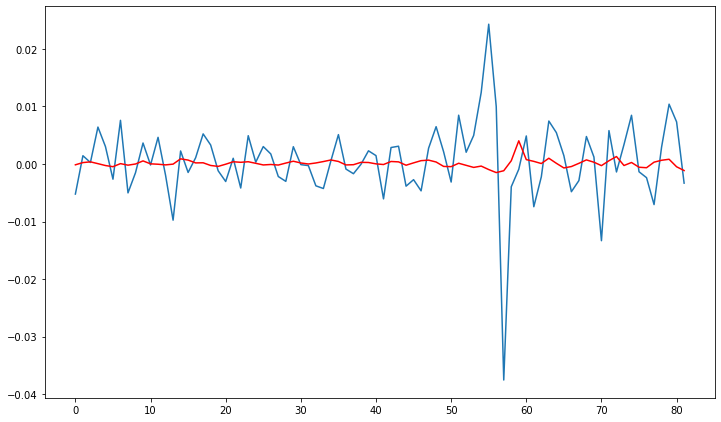

In [276]:
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

